# Air Quality Analysis — Lazio Region

*Merged report combining factories, air quality, wind, cars, energy consumption, and energy production datasets.*

This report investigates the relationship between **air pollution**, **industrial emissions**, **wind patterns**, **vehicle registrations**, and **energy production/consumption** in the **Lazio region** (Rome area), Italy.

**Objective:** Understand what factors influence air quality in Rome and surrounding areas by combining multiple datasets spanning 2021–2024.

**Data sources:**
- E-PRTR factory emissions database (industrial releases)
- European Air Quality e-Reporting (station metadata + hourly measurements)
- Open-Meteo API (hourly wind speed and direction)
- Vehicle registration records (Rome area)
- ENTSO-E Transparency Platform (energy consumption and production by source)

---
## 1. Setup & Imports

We use **pandas** for data manipulation, **numpy** for numerical operations, **matplotlib** and **seaborn** for visualisation, and **contextily** for basemap tiles in geographic plots.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


---
## 2. Factories Data
### 2.1 Data Inspection

The factories dataset comes from the **European Pollutant Release and Transfer Register (E-PRTR)**. It contains facility-level records of pollutant releases to air across Europe. We filter to **Italy only** and the **2021–2024** reporting window to align with our other datasets.

In [ ]:
df_factories= pd.read_csv("F1_4_Air_Releases_Facilities.csv")

In [ ]:
# ============================================================
# 1. BASIC STRUCTURE
# ============================================================
print("=" * 60)
print("1. BASIC STRUCTURE")
print("=" * 60)
print(f"Shape: {df_factories.shape[0]:,} rows x {df_factories.shape[1]} columns")
print(f"\nColumns: {list(df_factories.columns)}")
print(f"\nData types:")
print(df_factories.dtypes)

1. BASIC STRUCTURE
Shape: 59,099 rows x 16 columns

Columns: ['PublicationDate', 'countryName', 'reportingYear', 'EPRTR_SectorCode', 'EPRTR_SectorName', 'EPRTRAnnexIMainActivity', 'FacilityInspireId', 'facilityName', 'city', 'Longitude', 'Latitude', 'addressConfidentialityReason', 'TargetRelease', 'Pollutant', 'Releases', 'confidentialityReason']

Data types:
PublicationDate                  object
countryName                      object
reportingYear                     int64
EPRTR_SectorCode                float64
EPRTR_SectorName                 object
EPRTRAnnexIMainActivity          object
FacilityInspireId                object
facilityName                     object
city                             object
Longitude                       float64
Latitude                        float64
addressConfidentialityReason     object
TargetRelease                    object
Pollutant                        object
Releases                        float64
confidentialityReason            objec

In [ ]:
# ============================================================
# 2. FIRST & LAST ROWS
# ============================================================
print("\n" + "=" * 60)
print("2. SAMPLE ROWS")
print("=" * 60)
df_factories.head()


2. SAMPLE ROWS


,PublicationDate,countryName,reportingYear,EPRTR_SectorCode,EPRTR_SectorName,EPRTRAnnexIMainActivity,FacilityInspireId,facilityName,city,Longitude,Latitude,addressConfidentialityReason,TargetRelease,Pollutant,Releases,confidentialityReason
0,2026/02/13,Germany,2013,1.00,Energy sector,1(e),https://registry.gdi-de.org/id/de.nw.inspire.p...,RWE Power AG-Fabrik Fortuna Nord,Bergheim,6.66,50.99,NaN,AIR,Sulphur oxides (SOX),824000.00,NaN
1,2026/02/13,Sweden,2020,7.00,Intensive livestock production and aquaculture,7(a)(i),SE.CAED/10017896.Facility,Skåneägg Produktion AB,MÖRARP,12.85,56.05,NaN,AIR,Ammonia (NH3),16300.00,NaN
2,2026/02/13,Romania,2013,5.00,Waste and wastewater management,5(d),RO.CAED/104TL0001.FACILITY,SC ECOREC SA,TULCEA,28.77,45.19,NaN,AIR,Methane (CH4),269000.00,NaN
3,2026/02/13,Italy,2021,7.00,Intensive livestock production and aquaculture,7(a),IT.CAED/370602036.FACILITY,RONCHETRIN 1,GAZZO VERONESE,11.11,45.12,NaN,AIR,Ammonia (NH3),31920.00,NaN
4,2026/02/13,Czechia,2007,1.00,Energy sector,1(c),CZ.MZP.U423/CZ14819275.FACILITY,energetika,Štětí,14.38,50.46,NaN,AIR,Sulphur oxides (SOX),507000.00,NaN


In [ ]:
df_factories = df_factories[df_factories["countryName"] == "Italy"].copy()

In [ ]:
df_factories = df_factories[(df_factories["reportingYear"].between(2021, 2024))
].copy()



In [ ]:
# ============================================================
# 3. SUMMARY STATISTICS
# ============================================================
print("\n" + "=" * 60)
print("3. SUMMARY STATISTICS (Numeric)")
print("=" * 60)
print(df_factories.describe())

print("\n" + "=" * 60)
print("3b. SUMMARY STATISTICS (Categorical)")
print("=" * 60)
print(df_factories.describe(include="object"))


3. SUMMARY STATISTICS (Numeric)
       reportingYear  EPRTR_SectorCode  Longitude  Latitude      Releases
count        1067.00           1066.00    1055.00   1055.00       1067.00
mean         2022.46              4.80      11.39     43.98   80015438.86
std             1.12              2.54       2.43      2.29  379692870.55
min          2021.00              1.00       7.45     36.90          0.00
25%          2021.00              2.00       9.81     43.49      12331.50
50%          2022.00              6.00      10.89     45.02      24739.00
75%          2023.00              7.00      12.40     45.42     253503.55
max          2024.00              9.00      18.32     46.23 4703124870.00

3b. SUMMARY STATISTICS (Categorical)
       PublicationDate countryName  \
count             1067        1067   
unique               1           1   
top         2026/02/13       Italy   
freq              1067        1067   

                                      EPRTR_SectorName  \
count         


4. MISSING DATA
                              count  percent
confidentialityReason          1067   100.00
addressConfidentialityReason   1055    98.88
Longitude                        12     1.12
Latitude                         12     1.12
EPRTR_SectorCode                  1     0.09
EPRTR_SectorName                  1     0.09
EPRTRAnnexIMainActivity           1     0.09
PublicationDate                   0     0.00
facilityName                      0     0.00
FacilityInspireId                 0     0.00
countryName                       0     0.00
reportingYear                     0     0.00
city                              0     0.00
TargetRelease                     0     0.00
Pollutant                         0     0.00
Releases                          0     0.00


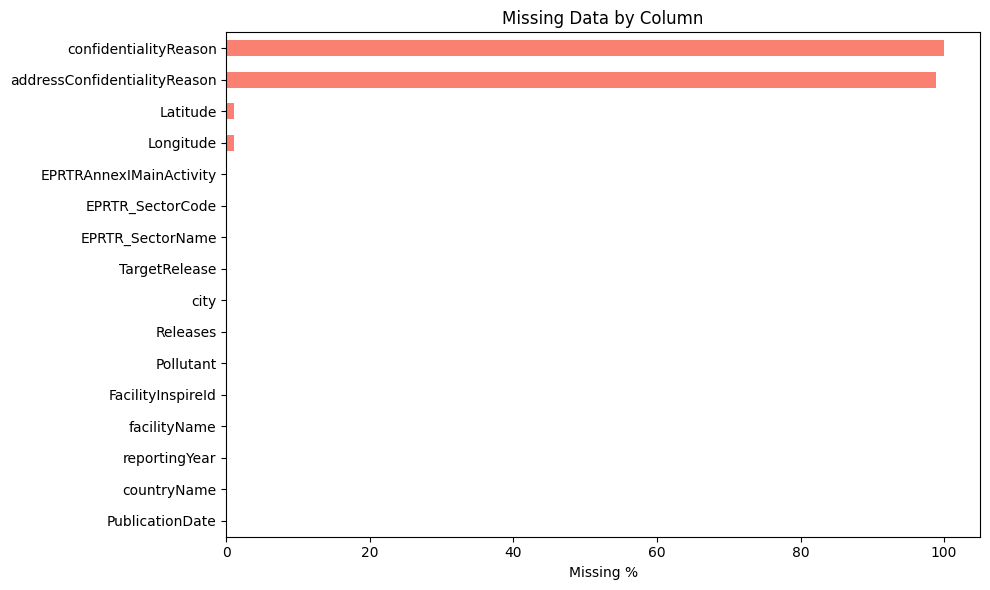

In [ ]:
# ============================================================
# 4. MISSING DATA
# ============================================================
print("\n" + "=" * 60)
print("4. MISSING DATA")
print("=" * 60)
nulls = df_factories.isna().sum()
null_pct = (df_factories.isna().sum() / len(df_factories) * 100).round(2)
missing = pd.DataFrame({"count": nulls, "percent": null_pct}).sort_values("percent", ascending=False)
print(missing.to_string())

fig, ax = plt.subplots(figsize=(10, 6))
null_pcts = (df_factories.isna().sum() / len(df_factories) * 100).sort_values(ascending=True)
null_pcts.plot(kind="barh", ax=ax, color="salmon")
ax.set_xlabel("Missing %")
ax.set_title("Missing Data by Column")
plt.tight_layout()
plt.show()


In [ ]:
"""
Zero Value Inspection - Factories Dataset (better chart)
"""

import pandas as pd
import matplotlib.pyplot as plt

numeric_cols = df_factories.select_dtypes(include="number").columns
total_rows = len(df_factories)

print(f"Total rows: {total_rows:,}")
print(f"Numeric columns: {len(numeric_cols)}\n")

zero_summary = []
for col in numeric_cols:
    zero_count = (df_factories[col] == 0).sum()
    zero_pct = (zero_count / total_rows * 100)
    null_count = df_factories[col].isna().sum()
    zero_summary.append({
        "column": col,
        "zeros": zero_count,
        "zero_%": round(zero_pct, 2),
        "nulls": null_count,
        "total_valid": total_rows - null_count,
    })

zero_df = pd.DataFrame(zero_summary).sort_values("zero_%", ascending=False)
print(zero_df.to_string(index=False))



Total rows: 1,067
Numeric columns: 5

          column  zeros  zero_%  nulls  total_valid
   reportingYear      0    0.00      0         1067
EPRTR_SectorCode      0    0.00      1         1066
       Longitude      0    0.00     12         1055
        Latitude      0    0.00     12         1055
        Releases      0    0.00      0         1067


In [ ]:

# ============================================================
# 5. UNIQUE VALUES PER COLUMN
# ============================================================
print("\n" + "=" * 60)
print("5. UNIQUE VALUES PER COLUMN")
print("=" * 60)
for col in df_factories.columns:
    print(f"  {col}: {df_factories[col].nunique()} unique")


5. UNIQUE VALUES PER COLUMN
  PublicationDate: 1 unique
  countryName: 1 unique
  reportingYear: 4 unique
  EPRTR_SectorCode: 9 unique
  EPRTR_SectorName: 9 unique
  EPRTRAnnexIMainActivity: 30 unique
  FacilityInspireId: 701 unique
  facilityName: 683 unique
  city: 542 unique
  Longitude: 683 unique
  Latitude: 680 unique
  addressConfidentialityReason: 1 unique
  TargetRelease: 1 unique
  Pollutant: 31 unique
  Releases: 1042 unique
  confidentialityReason: 0 unique


In [ ]:

# ============================================================
# 6. KEY DISTRIBUTIONS
# ============================================================
print("\n" + "=" * 60)
print("6. KEY DISTRIBUTIONS")
print("=" * 60)

print("\nTop 15 Pollutants:")
print(df_factories["Pollutant"].value_counts().head(15))

print("\nReporting Year distribution:")
print(df_factories["reportingYear"].value_counts().sort_index())



6. KEY DISTRIBUTIONS

Top 15 Pollutants:
Pollutant
Ammonia (NH3)                                     499
Nitrogen oxides (NOX)                             137
Carbon dioxide (CO2)                              114
Methane (CH4)                                      55
Non-methane volatile organic compounds (NMVOC)     42
Nitrous oxide (N2O)                                25
Sulphur oxides (SOX)                               24
Carbon monoxide (CO)                               22
Zinc and compounds (as Zn)                         22
Hydro-fluorocarbons (HFCS)                         19
Benzene                                            15
Arsenic and compounds (as As)                      13
Nickel and compounds (as Ni)                       11
Mercury and compounds (as Hg)                       8
Polychlorinated biphenyls (PCBs)                    7
Name: count, dtype: int64

Reporting Year distribution:
reportingYear
2021    280
2022    276
2023    253
2024    258
Name: count, dtype: 

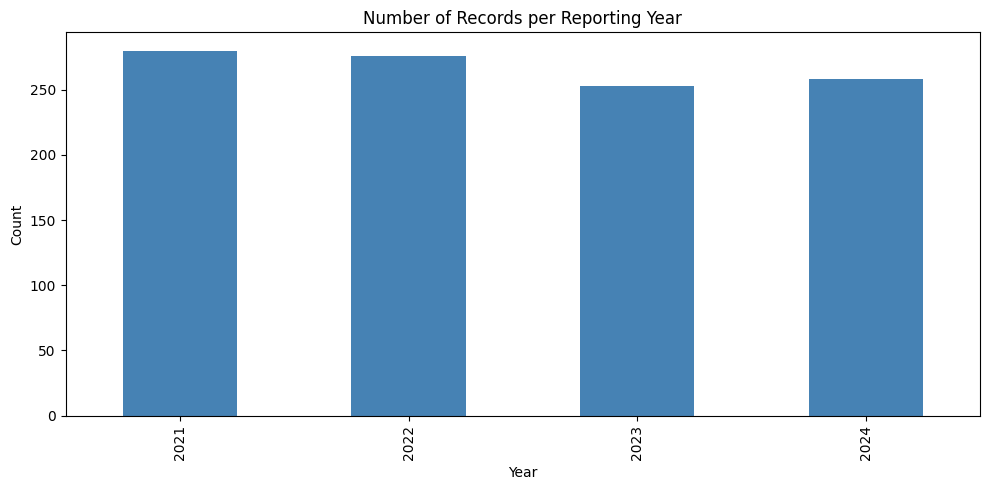

In [ ]:

# ============================================================
# 7. PLOTS
# ============================================================

# 7a. Reporting Year distribution
fig, ax = plt.subplots(figsize=(10, 5))
df_factories["reportingYear"].value_counts().sort_index().plot(kind="bar", ax=ax, color="steelblue")
ax.set_title("Number of Records per Reporting Year")
ax.set_xlabel("Year")
ax.set_ylabel("Count")
plt.tight_layout()
plt.show()



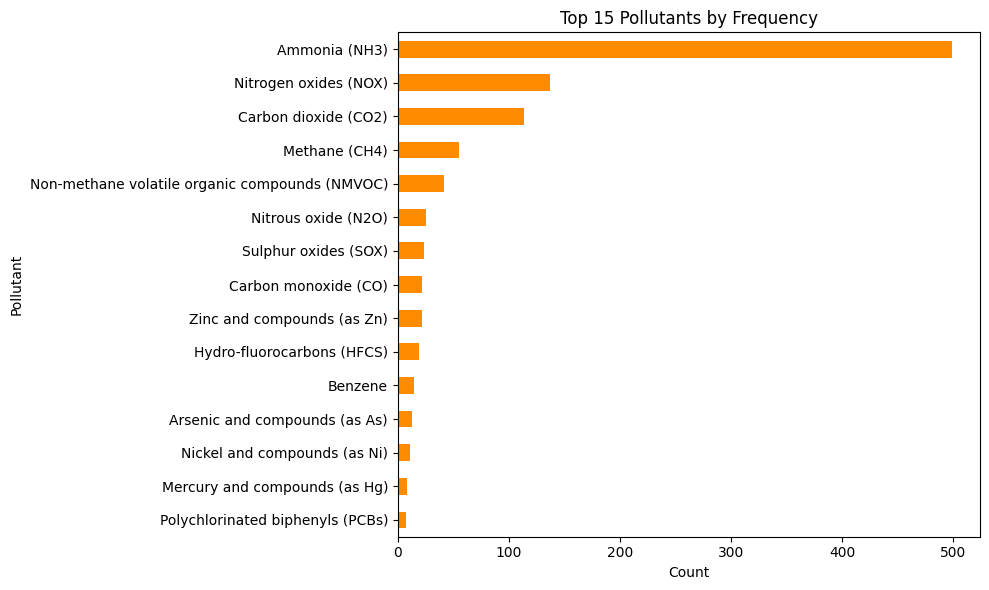

In [ ]:
# 7b. Top pollutants
fig, ax = plt.subplots(figsize=(10, 6))
df_factories["Pollutant"].value_counts().head(15).plot(kind="barh", ax=ax, color="darkorange")
ax.set_title("Top 15 Pollutants by Frequency")
ax.set_xlabel("Count")
ax.invert_yaxis()
plt.tight_layout()
plt.show()

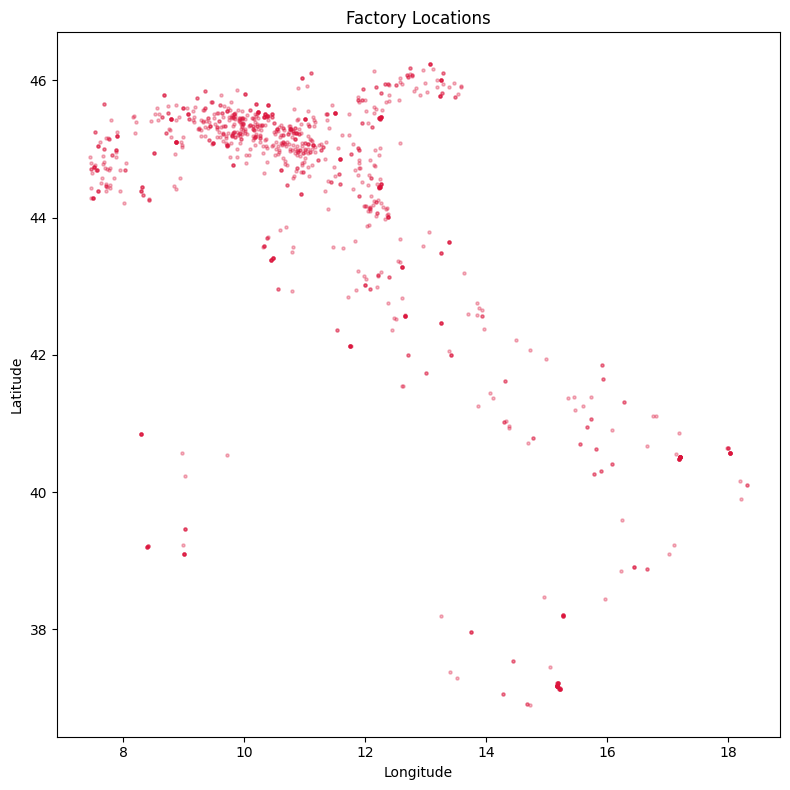


Geographic spread:
  Lat: 36.9031 to 46.2325
  Lon: 7.4491 to 18.3180


In [ ]:


# 7d. Geographic distribution
if "Latitude" in df_factories.columns and "Longitude" in df_factories.columns:
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(df_factories["Longitude"], df_factories["Latitude"], alpha=0.3, s=5, c="crimson")
    ax.set_title("Factory Locations")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    plt.tight_layout()
    plt.show()

    print("\nGeographic spread:")
    print(f"  Lat: {df_factories['Latitude'].min():.4f} to {df_factories['Latitude'].max():.4f}")
    print(f"  Lon: {df_factories['Longitude'].min():.4f} to {df_factories['Longitude'].max():.4f}")

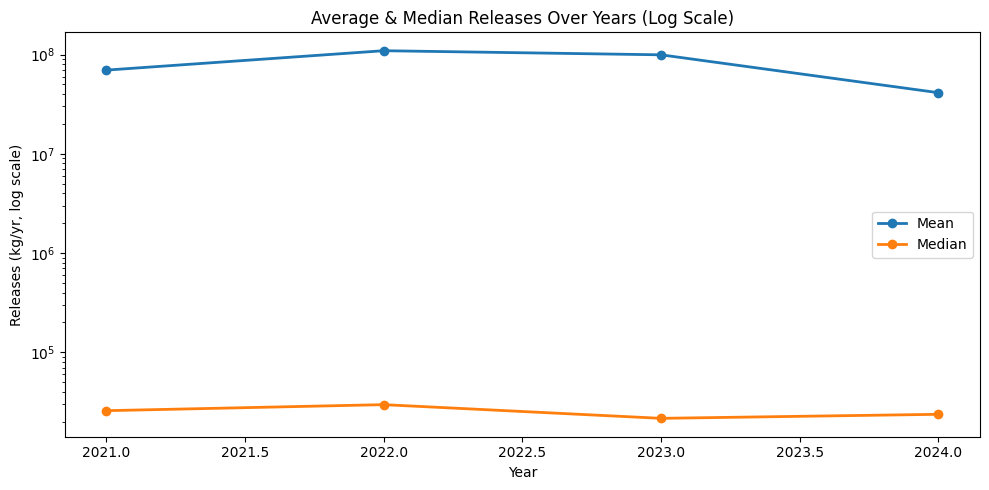

In [ ]:
if "Releases" in df_factories.columns:
    fig, ax = plt.subplots(figsize=(10, 5))
    yearly = df_factories.groupby("reportingYear")["Releases"].agg(["mean", "median", "sum"])
    yearly[["mean", "median"]].plot(ax=ax, marker="o", linewidth=2)
    ax.set_yscale("log")
    ax.set_title("Average & Median Releases Over Years (Log Scale)")
    ax.set_xlabel("Year")
    ax.set_ylabel("Releases (kg/yr, log scale)")
    ax.legend(["Mean", "Median"])
    plt.tight_layout()
    plt.show()

In [ ]:
print(df_factories["Releases"].quantile([0.25, 0.5, 0.75, 0.9, 0.95, 0.99]))

0.25        12331.50
0.50        24739.00
0.75       253503.55
0.90    112912440.00
0.95    381730900.00
0.99   2015497693.25
Name: Releases, dtype: float64


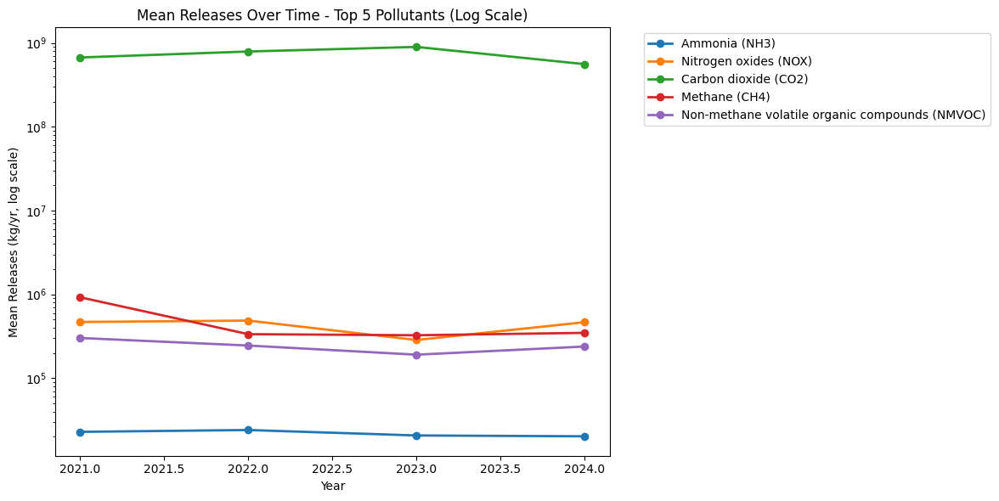

In [ ]:
if "Releases" in df_factories.columns:
    top5 = df_factories["Pollutant"].value_counts().head(5).index
    fig, ax = plt.subplots(figsize=(12, 6))
    for poll in top5:
        subset = df_factories[df_factories["Pollutant"] == poll].groupby("reportingYear")["Releases"].mean()
        subset.plot(ax=ax, marker="o", label=poll, linewidth=2)
    ax.set_yscale("log")
    ax.set_title("Mean Releases Over Time - Top 5 Pollutants (Log Scale)")
    ax.set_xlabel("Year")
    ax.set_ylabel("Mean Releases (kg/yr, log scale)")
    ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

In [ ]:
# ============================================================
# 8. DUPLICATE CHECK
# ============================================================
print("\n" + "=" * 60)
print("8. DUPLICATES")
print("=" * 60)
print(f"Exact duplicate rows: {df_factories.duplicated().sum()}")

# =======


8. DUPLICATES
Exact duplicate rows: 0


### 2.2 Factories Data Cleaning

**Cleaning strategy:** We drop columns that are nearly 100% null (e.g., confidentiality reasons), remove identifiers not needed for aggregate analysis (facility names, IDs), calculate each factory's distance from Rome centre using the Haversine formula, and one-hot encode the sector categories for downstream modelling.

In [ ]:
# Drop columns that are nearly 100% null — no usable data
# confidentialityReason: 100% null
# addressConfidentialityReason: 98.97% null
df_factories = df_factories.drop(columns=["confidentialityReason", "addressConfidentialityReason"])

print(f"Remaining columns: {df_factories.shape[1]}")
print(df_factories.columns.tolist())

Remaining columns: 14
['PublicationDate', 'countryName', 'reportingYear', 'EPRTR_SectorCode', 'EPRTR_SectorName', 'EPRTRAnnexIMainActivity', 'FacilityInspireId', 'facilityName', 'city', 'Longitude', 'Latitude', 'TargetRelease', 'Pollutant', 'Releases']


In [ ]:
# Check if there are power/energy facilities near Rome in df_factories
# Look for energy-related activities
print(df_factories["EPRTRAnnexIMainActivity"].value_counts())

EPRTRAnnexIMainActivity
7(a)        450
1(c)        133
3(c)         73
2(b)         63
1(a)         54
3(e)         37
5(d)         32
4(a)         28
9(c)         27
4(b)         21
7(a)(ii)     20
2(e)         18
4(e)         16
5(b)         15
7(a)(i)      14
6(b)         12
8(b)         11
5(a)          9
2(a)          5
4(c)          5
3(a)          4
2(f)          4
2(d)          3
1(d)          3
5(c)          3
5(f)          2
1(b)          1
9(a)          1
9(d)          1
8(c)          1
Name: count, dtype: int64


In [ ]:
print(df_factories["EPRTR_SectorName"].value_counts())

EPRTR_SectorName
Intensive livestock production and aquaculture                     484
Energy sector                                                      191
Mineral industry                                                   114
Production and processing of metals                                 93
Chemical industry                                                   70
Waste and wastewater management                                     61
Other activities                                                    29
Paper and wood production and processing                            12
Animal and vegetable products from the food and beverage sector     12
Name: count, dtype: int64


In [ ]:
# Facilities within Lazio area (rough bounds)
lazio = df_factories[
    (df_factories["Latitude"].between(40.0, 44.0)) &
    (df_factories["Longitude"].between(10.0, 14.5))
]
print(f"Facilities in centra italy area: {len(lazio)}")
print(lazio[["facilityName", "EPRTR_SectorName", "Latitude", "Longitude"]].drop_duplicates())

Facilities in centra italy area: 119
                                            facilityName  \
41                           CENTRALE TORREVALDALIGA SUD   
74     ACCIAI SPECIALI TERNI S.P.A. - stabilimento di...   
626                       Società Agricola Fileni S.r.l.   
1075                             Laminazione Sottile SpA   
1418                                 ALESSANDRO STASSANO   
...                                                  ...   
53034   Complesso IPPC "Azienda Agraria Del Sero Angelo"   
53608                       TERMOVALORIZZATORE DI ACERRA   
53653                       CORNING PHARMACEUTICAL GLASS   
53712                              SOGLIANO AMBIENTE SPA   
58491                     STABILIMENTO DI SAN PELLEGRINO   

                                     EPRTR_SectorName   Latitude  Longitude  
41                                      Energy sector  42.123100  11.765400  
74                Production and processing of metals  42.566700  12.666700  
626    I

In [ ]:
from math import radians, sin, cos, sqrt, atan2

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    return R * 2 * atan2(sqrt(a), sqrt(1-a))

# Rome center
rome_lat, rome_lon = 41.9028, 12.4964

energy_facilities = lazio[lazio["EPRTR_SectorName"] == "Energy sector"].copy()
energy_facilities["distance_km"] = energy_facilities.apply(
    lambda r: haversine(rome_lat, rome_lon, r["Latitude"], r["Longitude"]), axis=1
)

print(energy_facilities[["facilityName", "city", "Latitude", "Longitude", "distance_km"]].drop_duplicates().sort_values("distance_km").to_string())

                                                                 facilityName                    city  Latitude  Longitude  distance_km
14419                                   CENTRALE A CICLO COMBINATO DI APRILIA                 APRILIA   41.5494    12.6308    40.848517
24093                                    Centrale compressione gas di Gallese                 GALLESE   42.3621    12.4432    51.259896
41                                                CENTRALE TORREVALDALIGA SUD           CIVITAVECCHIA   42.1231    11.7654    65.171744
2310                                             Centrale Torrevaldaliga Nord           CIVITAVECCHIA   42.1275    11.7586    65.874727
37379                           Centrale termoelettrica di Montalto di Castro      MONTALTO DI CASTRO   42.3589    11.5338    94.196925
2965          Enel Produzione S.p.A. - IMPIANTO TERMOELETTRICO DI PIETRAFITTA                 PIEGARO   42.9946    12.2003   123.809378
23341                                   Centrale

In [ ]:
df_factories.to_csv("factories_last.csv", index=False)

In [ ]:
# Drop columns not needed for analysis
# TargetRelease — not relevant
# city — all Rome/Lazio area, no variation needed
# facilityName — individual names not needed for aggregate analysis
# FacilityInspireId — identifier, not needed
# EPRTR_SectorCode — numeric code, redundant with EPRTR_SectorName
df_factories = df_factories.drop(columns=[
    "TargetRelease",
    "city",
    "facilityName",
    "FacilityInspireId",
    "EPRTR_SectorCode"
])

print(f"Remaining columns: {df_factories.columns.tolist()}")

Remaining columns: ['PublicationDate', 'countryName', 'reportingYear', 'EPRTR_SectorName', 'EPRTRAnnexIMainActivity', 'Longitude', 'Latitude', 'Pollutant', 'Releases']


In [ ]:
df_factories = df_factories.drop(columns = "PublicationDate")

In [ ]:
df_factories = df_factories.drop(columns = "countryName")

In [ ]:
df_factories = df_factories.drop(columns = ["Longitude","Latitude"])

In [ ]:
df_factories = df_factories.drop(columns = "EPRTRAnnexIMainActivity")

In [ ]:
# Create dummy variables for EPRTR_SectorName
# drop_first=True to avoid multicollinearity
dummies = pd.get_dummies(df_factories["EPRTR_SectorName"], prefix="Sector", drop_first=True)

# Add dummies and drop original column
df_factories = pd.concat([df_factories, dummies], axis=1)
df_factories = df_factories.drop(columns=["EPRTR_SectorName"])

print(f"Shape: {df_factories.shape}")
print(f"Columns: {df_factories.columns.tolist()}")

Shape: (1067, 19)
Columns: ['reportingYear', 'EPRTR_SectorCode', 'EPRTRAnnexIMainActivity', 'FacilityInspireId', 'facilityName', 'city', 'Longitude', 'Latitude', 'TargetRelease', 'Pollutant', 'Releases', 'Sector_Chemical industry', 'Sector_Energy sector', 'Sector_Intensive livestock production and aquaculture', 'Sector_Mineral industry', 'Sector_Other activities', 'Sector_Paper and wood production and processing', 'Sector_Production and processing of metals', 'Sector_Waste and wastewater management']


In [ ]:
# Convert dummy columns from True/False to 0/1
dummy_cols = [c for c in df_factories.columns if c.startswith("Sector_")]
df_factories[dummy_cols] = df_factories[dummy_cols].astype(int)

print(df_factories[dummy_cols].head())

    Sector_Chemical industry  Sector_Energy sector  \
3                          0                     0   
6                          0                     0   
41                         0                     1   
74                         0                     0   
92                         0                     0   

    Sector_Intensive livestock production and aquaculture  \
3                                                   1       
6                                                   1       
41                                                  0       
74                                                  0       
92                                                  0       

    Sector_Mineral industry  Sector_Other activities  \
3                         0                        0   
6                         0                        0   
41                        0                        0   
74                        0                        0   
92                        0 

In [ ]:
df_factories.to_csv("factories_last_1.csv", index=False)

---
## 3. Air Quality Station Metadata
### 3.1 Data Inspection

The station metadata comes from the **European Air Quality e-Reporting** system. Four CSV extracts are combined, covering monitoring stations in the Lazio region. Each row describes a station–pollutant–year combination with coordinates, altitude, and data links.

In [ ]:
import pandas as pd

files = ["DataExtract 4.csv","DataExtract 5.csv","DataExtract 6.csv","DataExtract 7.csv"]

df_stats = pd.concat([pd.read_csv(f) for f in files], ignore_index=True)

In [ ]:

# ============================================================
# 1. BASIC STRUCTURE
# ============================================================
print("=" * 60)
print("1. BASIC STRUCTURE")
print("=" * 60)
print(f"Shape: {df_stats.shape[0]:,} rows x {df_stats.shape[1]} columns")
print(f"\nData types:")
print(df_stats.dtypes)


1. BASIC STRUCTURE
Shape: 2,706 rows x 27 columns

Data types:
Country                                                            object
Air Quality Network                                                object
Air Quality Network Name                                           object
Air Quality Station EoI Code                                       object
Air Quality Station Name                                           object
Sampling Point Id                                                  object
Air Pollutant                                                      object
Air Pollutant Description                                          object
Data Aggregation Process Id                                        object
Data Aggregation Process                                           object
Year                                                                int64
Air Pollution Level                                               float64
Unit Of Air Pollution Level                      

In [ ]:
# ============================================================
# 2. SUMMARY STATISTICS
# ============================================================
print("\n" + "=" * 60)
print("2. SUMMARY STATISTICS (Numeric)")
print("=" * 60)
print(df_stats.describe())

print("\n" + "=" * 60)
print("2b. SUMMARY STATISTICS (Categorical)")
print("=" * 60)
df_stats.describe(include="object")


2. SUMMARY STATISTICS (Numeric)
              Year  Air Pollution Level  Data Coverage  Verification  \
count  2706.000000          2706.000000    2706.000000        2706.0   
mean   2022.484479           821.140721      94.674523           1.0   
std       1.118133          3809.418096       3.518019           0.0   
min    2021.000000            -1.992000      83.840000           1.0   
25%    2021.000000             0.672250      92.900000           1.0   
50%    2022.000000            25.560000      94.810000           1.0   
75%    2023.000000            85.398000      97.605000           1.0   
max    2024.000000         36627.117000     100.000000           1.0   

         Longitude     Latitude     Altitude  City Population  
count  2706.000000  2706.000000  2706.000000           2706.0  
mean     12.504233    41.906535    33.359941        2808293.0  
std       0.036858     0.031844    12.110450              0.0  
min      12.447600    41.857700    17.000000        2808293.0 

,Country,Air Quality Network,Air Quality Network Name,Air Quality Station EoI Code,Air Quality Station Name,Sampling Point Id,Air Pollutant,Air Pollutant Description,Data Aggregation Process Id,Data Aggregation Process,Unit Of Air Pollution Level,Air Quality Station Type,Air Quality Station Area,City,City Code,Source Of Data Flow,Calculation Time,Link to raw data (only E1a/validated data from AQ e-Reporting),Observation Frequency
count,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706,2706
unique,1,1,1,10,10,55,11,11,51,50,3,2,1,1,1,1,51,55,1
top,Italy,NET.IT112A,Regione Lazio,IT0953A,VILLA ADA,SPO.IT1835A_7_UV-P_2006-12-06_00:00:00,NO2,Nitrogen dioxide (air),P1Y-day-per50,1 year 50 %ile of daily values in a year,ug/m3,Background,Urban,Roma ...,IT001C1 ...,E1a/validated data AQ e-Reporting,07/03/2026 22:59:18,https://eeadmz1batchservice02.blob.core.window...,hour
freq,2706,2706,2706,528,528,116,760,760,218,218,2206,1830,2706,2706,2706,2706,218,116,2706


In [ ]:
# ============================================================
# 3. MISSING DATA
# ============================================================
print("\n" + "=" * 60)
print("3. MISSING DATA")
print("=" * 60)
nulls = df_stats.isna().sum()
null_pct = (df_stats.isna().sum() / len(df_stats) * 100).round(2)
missing = pd.DataFrame({"count": nulls, "percent": null_pct}).sort_values("percent", ascending=False)
print(missing.to_string())





3. MISSING DATA
                                                                count  percent
Country                                                             0      0.0
Air Quality Network                                                 0      0.0
Air Quality Network Name                                            0      0.0
Air Quality Station EoI Code                                        0      0.0
Air Quality Station Name                                            0      0.0
Sampling Point Id                                                   0      0.0
Air Pollutant                                                       0      0.0
Air Pollutant Description                                           0      0.0
Data Aggregation Process Id                                         0      0.0
Data Aggregation Process                                            0      0.0
Year                                                                0      0.0
Air Pollution Level                

In [ ]:
# 5. KEY DISTRIBUTIONS
# ============================================================
print("\n" + "=" * 60)
print("5. KEY DISTRIBUTIONS")
print("=" * 60)

print("\nPollutants:")
print(df_stats["Air Pollutant"].value_counts())

print("\nYear distribution:")
print(df_stats["Year"].value_counts().sort_index())

print("\nStation Names:")
print(df_stats["Air Quality Station Name"].value_counts())




5. KEY DISTRIBUTIONS

Pollutants:
Air Pollutant
NO2               760
O3                696
NOX as NO2        320
NO                280
SO2               126
CO                104
C6H5-CH3           84
C6H5-C2H5          84
C6H6               84
m,p-C6H4(CH3)2     84
o-C6H4-(CH3)2      84
Name: count, dtype: int64

Year distribution:
Year
2021    687
2022    687
2023    666
2024    666
Name: count, dtype: int64

Station Names:
Air Quality Station Name
VILLA ADA            528
FERMI                328
BUFALOTTA            294
C.SO FRANCIA         276
CIPRO                252
CINECITTA            252
L.GO PERESTRELLO     252
ARENULA              252
L.GO MAGNA GRECIA    136
TIBURTINA            136
Name: count, dtype: int64


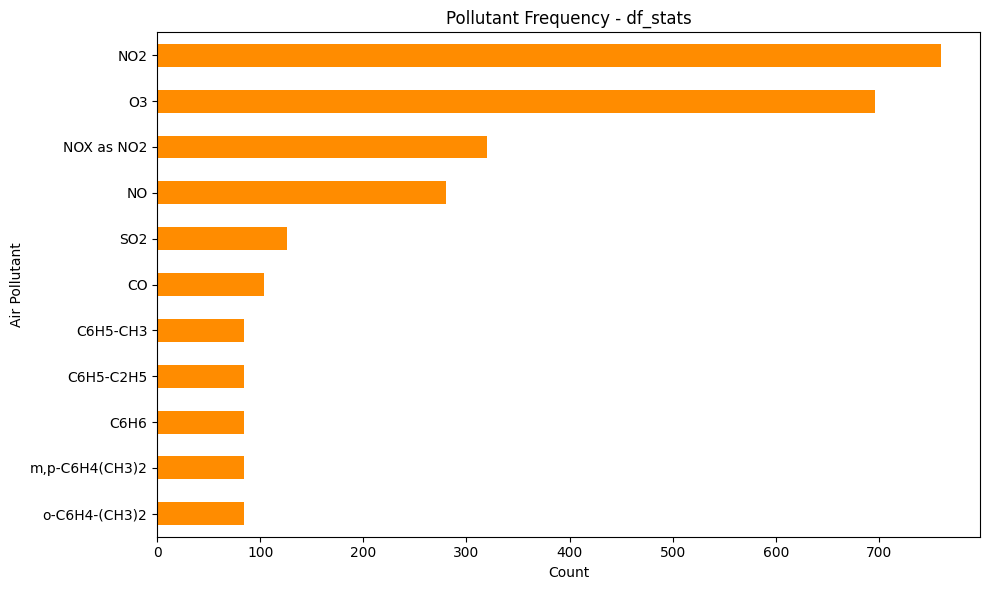

In [ ]:

# 6b. Pollutant frequency
fig, ax = plt.subplots(figsize=(10, 6))
df_stats["Air Pollutant"].value_counts().plot(kind="barh", ax=ax, color="darkorange")
ax.set_title("Pollutant Frequency - df_stats")
ax.set_xlabel("Count")
ax.invert_yaxis()
plt.tight_layout()
plt.show()

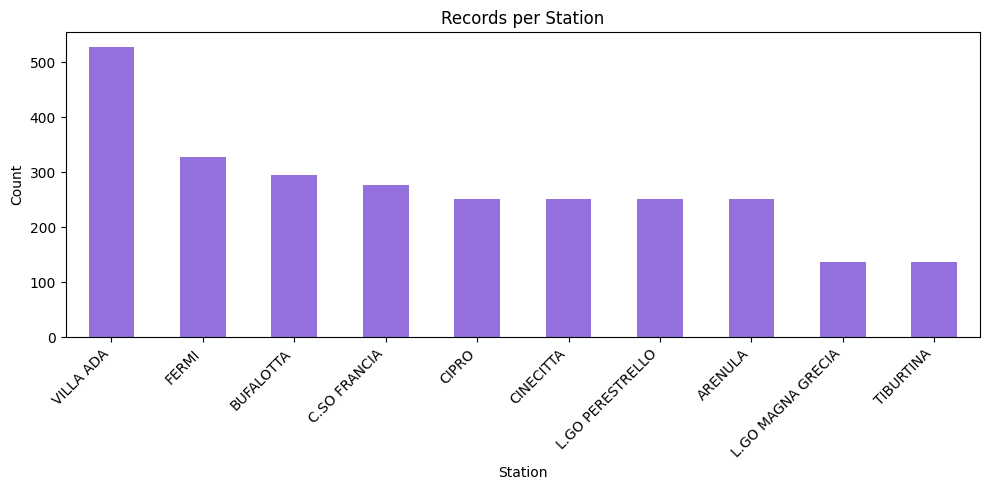

In [ ]:
# 6d. Records per station
fig, ax = plt.subplots(figsize=(10, 5))
df_stats["Air Quality Station Name"].value_counts().plot(kind="bar", ax=ax, color="mediumpurple")
ax.set_title("Records per Station")
ax.set_xlabel("Station")
ax.set_ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

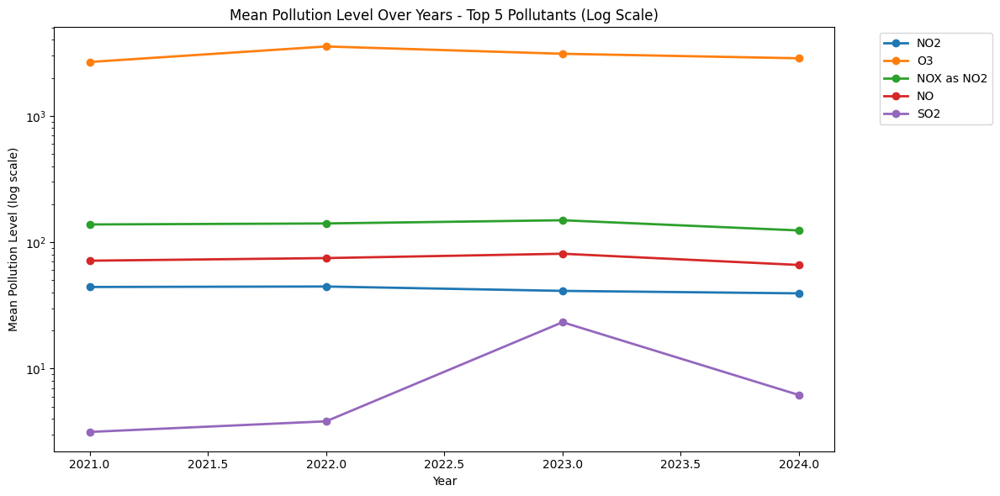

In [ ]:
fig, ax = plt.subplots(figsize=(12, 6))
for poll in df_stats["Air Pollutant"].value_counts().head(5).index:
    sub = df_stats[df_stats["Air Pollutant"] == poll].groupby("Year")["Air Pollution Level"].mean()
    ax.plot(sub.index, sub.values, marker="o", linewidth=2, label=poll)
ax.set_yscale("log")
ax.set_title("Mean Pollution Level Over Years - Top 5 Pollutants (Log Scale)")
ax.set_xlabel("Year")
ax.set_ylabel("Mean Pollution Level (log scale)")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


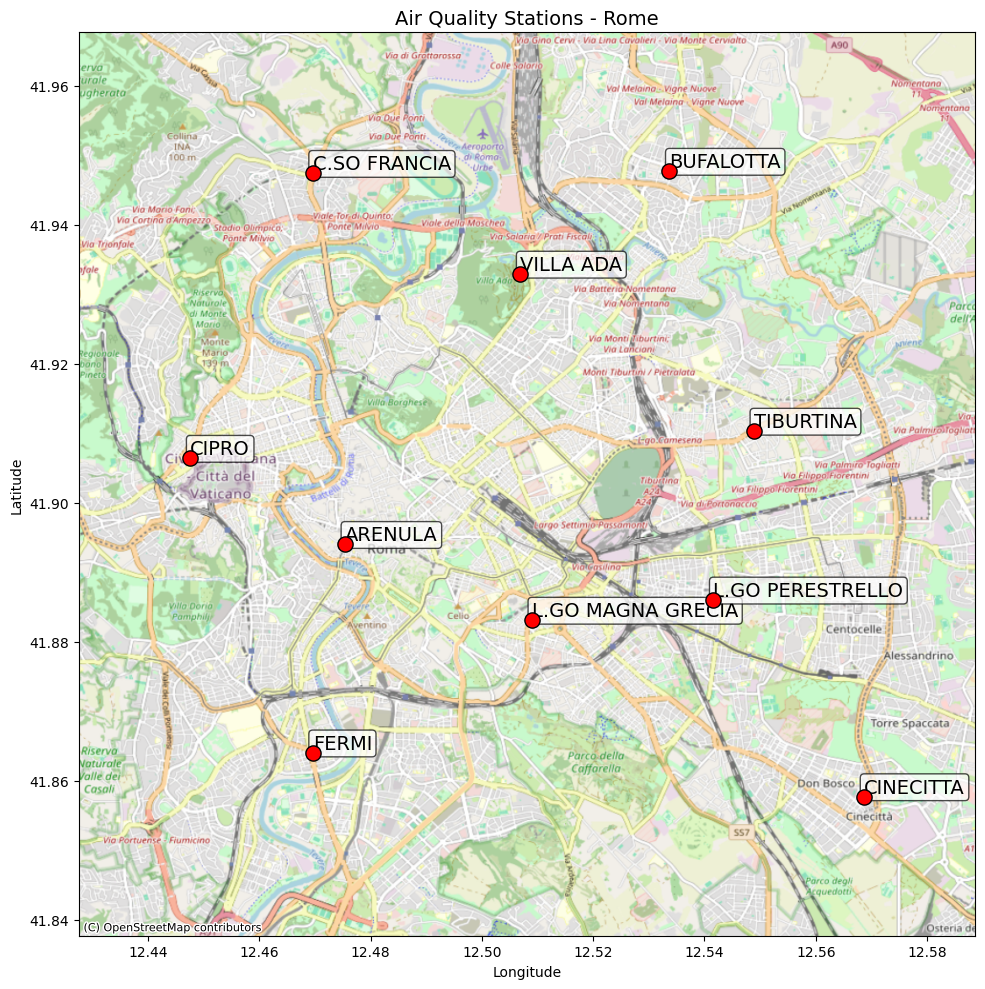

In [ ]:
import contextily as ctx
import matplotlib.pyplot as plt

stations = df_stats[["Air Quality Station Name", "Latitude", "Longitude"]].drop_duplicates()

fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(stations["Longitude"], stations["Latitude"], s=120, c="red", zorder=5, edgecolors="black")

for _, row in stations.iterrows():
    ax.annotate(row["Air Quality Station Name"],
                (row["Longitude"], row["Latitude"]),
                fontsize=14, ha="left", va="bottom",
                bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.7))

# Add some padding around the points
pad = 0.02
ax.set_xlim(stations["Longitude"].min() - pad, stations["Longitude"].max() + pad)
ax.set_ylim(stations["Latitude"].min() - pad, stations["Latitude"].max() + pad)

# Add the real map as background
ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title("Air Quality Stations - Rome", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# 7. ZERO VALUES
# ============================================================
print("\n" + "=" * 60)
print("7. ZERO VALUES")
print("=" * 60)
numeric_cols = df_stats.select_dtypes(include="number").columns
for col in numeric_cols:
    zero_count = (df_stats[col] == 0).sum()
    if zero_count > 0:
        print(f"  {col}: {zero_count} zeros ({zero_count/len(df_stats)*100:.2f}%)")



7. ZERO VALUES
  Air Pollution Level: 424 zeros (15.67%)


In [ ]:
# ============================================================
# 8. DUPLICATES
# ============================================================
print("\n" + "=" * 60)
print("8. DUPLICATES")
print("=" * 60)
print(f"Exact duplicate rows: {df_stats.duplicated().sum()}")




8. DUPLICATES
Exact duplicate rows: 0


In [ ]:

# ============================================================
# 9. DATA QUALITY SUMMARY
# ============================================================
print("\n" + "=" * 60)
print("9. DATA QUALITY SUMMARY")
print("=" * 60)
print(f"  Total rows: {len(df_stats):,}")
print(f"  Columns: {df_stats.shape[1]}")
print(f"  Columns with nulls: {(df_stats.isna().sum() > 0).sum()}")
print(f"  Exact duplicates: {df_stats.duplicated().sum()}")
print(f"  Unique stations: {df_stats['Air Quality Station Name'].nunique()}")
print(f"  Unique sampling points: {df_stats['Sampling Point Id'].nunique()}")
print(f"  Unique pollutants: {df_stats['Air Pollutant'].nunique()}")
print(f"  Year range: {df_stats['Year'].min()} - {df_stats['Year'].max()}")
print(f"  Pollution Level range: {df_stats['Air Pollution Level'].min()} - {df_stats['Air Pollution Level'].max()}")


9. DATA QUALITY SUMMARY
  Total rows: 2,706
  Columns: 27
  Columns with nulls: 0
  Exact duplicates: 0
  Unique stations: 10
  Unique sampling points: 55
  Unique pollutants: 11
  Year range: 2021 - 2024
  Pollution Level range: -1.992 - 36627.117


### 3.2 Station Data Cleaning

**Cleaning strategy:** We remove constant-value columns (Country, Network Name, Observation Frequency, etc.) since all stations belong to the same Lazio network. Redundant identifiers and aggregation metadata are also dropped to keep only the fields needed for merging with hourly measurements.

In [ ]:
# Drop 'Country' column — all values are Italy, no information gained
df_stats = df_stats.drop(columns=["Country"])

print(f"Remaining columns: {df_stats.shape[1]}")

Remaining columns: 26


In [ ]:
# Drop 'Air Quality Network Name' — all values are "Regione Lazio", no variation
df_stats = df_stats.drop(columns=["Air Quality Network Name"])

print(f"Remaining columns: {df_stats.shape[1]}")

Remaining columns: 25


In [ ]:
# Drop 'Air Quality Network' — same network for all stations (NET.IT112A), no variation
df_stats = df_stats.drop(columns=["Air Quality Network"])

print(f"Remaining columns: {df_stats.shape[1]}")

Remaining columns: 24


In [ ]:
# Drop 'Observation Frequency' — same value for all rows (hourly)
# Drop 'Source Of Data Flow' — same source for all rows
# Drop 'City Code' — redundant identifier, city name is sufficient
# Drop 'City Population' — constant value across all rows, no variation
# Drop 'Air Quality Station Area' — all stations are Urban, no variation
df_stats = df_stats.drop(columns=[
    "Observation Frequency",
    "Source Of Data Flow",
    "City Code",
    "City Population",
    "Air Quality Station Area",
])

print(f"Remaining columns: {df_stats.shape[1]}")
print(df_stats.columns.tolist())

Remaining columns: 19
['Air Quality Station EoI Code', 'Air Quality Station Name', 'Sampling Point Id', 'Air Pollutant', 'Air Pollutant Description', 'Data Aggregation Process Id', 'Data Aggregation Process', 'Year', 'Air Pollution Level', 'Unit Of Air Pollution Level', 'Data Coverage', 'Verification', 'Air Quality Station Type', 'Longitude', 'Latitude', 'Altitude', 'City', 'Calculation Time', 'Link to raw data (only E1a/validated data from AQ e-Reporting)']


In [ ]:
df_stats = df_stats.drop(columns = "City")

In [ ]:
# Drop 'Air Quality Station EoI Code' — redundant, same information as Station Name
df_stats = df_stats.drop(columns=["Air Quality Station EoI Code","Air Quality Station Type"])

print(f"Remaining columns: {df_stats.shape[1]}")
print(df_stats.columns.tolist())

Remaining columns: 16
['Air Quality Station Name', 'Sampling Point Id', 'Air Pollutant', 'Air Pollutant Description', 'Data Aggregation Process Id', 'Data Aggregation Process', 'Year', 'Air Pollution Level', 'Unit Of Air Pollution Level', 'Data Coverage', 'Verification', 'Longitude', 'Latitude', 'Altitude', 'Calculation Time', 'Link to raw data (only E1a/validated data from AQ e-Reporting)']


In [ ]:
# Drop 'Data Coverage' — not needed for analysis
# Drop 'Verification' — same verification status across rows, no variation
df_stats = df_stats.drop(columns=["Data Coverage", "Verification","Calculation Time"])

print(f"Remaining columns: {df_stats.shape[1]}")
print(df_stats.columns.tolist())

Remaining columns: 13
['Air Quality Station Name', 'Sampling Point Id', 'Air Pollutant', 'Air Pollutant Description', 'Data Aggregation Process Id', 'Data Aggregation Process', 'Year', 'Air Pollution Level', 'Unit Of Air Pollution Level', 'Longitude', 'Latitude', 'Altitude', 'Link to raw data (only E1a/validated data from AQ e-Reporting)']


---
## 4. Raw Air Quality Measurements (Parquet Data)
### 4.1 Data Download & Combination

The raw hourly air quality measurements are distributed as **Parquet files** linked from the station metadata. We download all files, combine them into a single DataFrame, and extract the measurement year from the timestamp. This gives us millions of hourly pollution readings across all Lazio stations.

In [ ]:
links = df_stats[
    "Link to raw data (only E1a/validated data from AQ e-Reporting)"
].tolist()

In [ ]:
df_stats = df_stats.rename(columns={"Air Pollutant": "Pollutant"})

In [ ]:
"""
SCRIPT 1: Download all parquet files
=====================================
Run this first. Downloads all parquets from df_stats links to Colab local disk.
"""

import pandas as pd
import requests
import os
import time
from concurrent.futures import ThreadPoolExecutor, as_completed

# --- CONFIGURATION ---
DF_STATS_PATH = "/content/df_stats.csv"  # adjust if needed
DOWNLOAD_FOLDER = "/content/parquets"
LINK_COL = "Link to raw data (only E1a/validated data from AQ e-Reporting)"

os.makedirs(DOWNLOAD_FOLDER, exist_ok=True)

# Load df_stats just to get the links
df_stats
links = df_stats[LINK_COL].dropna().unique()
parquet_links = [l for l in links if l.endswith(".parquet")]
print(f"Found {len(parquet_links)} unique parquet links\n")

# Download function
def download_one(url):
    filename = url.split("/")[-1]
    filepath = os.path.join(DOWNLOAD_FOLDER, filename)
    if os.path.exists(filepath):
        return filepath, "exists"
    try:
        r = requests.get(url, timeout=120)
        r.raise_for_status()
        with open(filepath, "wb") as f:
            f.write(r.content)
        return filepath, "ok"
    except Exception as e:
        return None, str(e)

# Download all in parallel
start = time.time()
ok = 0
fail = 0
total = len(parquet_links)

with ThreadPoolExecutor(max_workers=20) as executor:
    futures = {executor.submit(download_one, url): url for url in parquet_links}
    for i, future in enumerate(as_completed(futures), 1):
        filepath, status = future.result()
        if filepath:
            ok += 1
        else:
            fail += 1
            print(f"  FAILED: {futures[future].split('/')[-1]} - {status}")
        if i % 10 == 0 or i == total:
            print(f"  [{i}/{total}] Downloaded: {ok} | Failed: {fail}")

elapsed = time.time() - start
total_mb = sum(
    os.path.getsize(os.path.join(DOWNLOAD_FOLDER, f))
    for f in os.listdir(DOWNLOAD_FOLDER) if f.endswith(".parquet")
) / (1024 * 1024)

print(f"\nDone in {elapsed:.1f}s")
print(f"Files in {DOWNLOAD_FOLDER}: {ok}")
print(f"Total size: {total_mb:.1f} MB")

Found 55 unique parquet links

  [10/55] Downloaded: 10 | Failed: 0
  [20/55] Downloaded: 20 | Failed: 0
  [30/55] Downloaded: 30 | Failed: 0
  [40/55] Downloaded: 40 | Failed: 0
  [50/55] Downloaded: 50 | Failed: 0
  [55/55] Downloaded: 55 | Failed: 0

Done in 0.0s
Files in /content/parquets: 55
Total size: 67.2 MB


In [ ]:
"""
SCRIPT 2: Combine all parquets into one file
=============================================
Reads all parquet files from /content/parquets/,
combines them into one dataframe, saves as CSV.
"""

import pandas as pd
import os
import gc
import glob
import time

# --- CONFIGURATION ---
PARQUET_FOLDER = "/content/parquets"
OUTPUT_PATH = "/content/all_parquets_combined.csv"

# Get all parquet files
parquet_files = sorted(glob.glob(os.path.join(PARQUET_FOLDER, "*.parquet")))
print(f"Found {len(parquet_files)} parquet files\n")

# Read all
start = time.time()
all_dfs = []

for i, filepath in enumerate(parquet_files, 1):
    df = pd.read_parquet(filepath)
    all_dfs.append(df)

    if i == 1:
        print(f"Columns: {list(df.columns)}")
        print(f"First file rows: {len(df):,}\n")

    if i % 10 == 0 or i == len(parquet_files):
        print(f"  [{i}/{len(parquet_files)}] read")

# Combine
print("\nCombining...")
df_combined = pd.concat(all_dfs, ignore_index=True)
del all_dfs
gc.collect()

print(f"Total rows: {df_combined.shape[0]:,}")
print(f"Columns: {df_combined.shape[1]}")
print(f"Memory: {df_combined.memory_usage(deep=True).sum() / (1024*1024):.0f} MB")

# Save
print(f"\nSaving to {OUTPUT_PATH}...")
df_combined.to_csv(OUTPUT_PATH, index=False)
size_mb = os.path.getsize(OUTPUT_PATH) / (1024 * 1024)

elapsed = time.time() - start
print(f"Saved: {size_mb:.1f} MB | Done in {elapsed:.1f}s")

Found 55 parquet files

Columns: ['Samplingpoint', 'Pollutant', 'Start', 'End', 'Value', 'Unit', 'AggType', 'Validity', 'Verification', 'ResultTime', 'DataCapture', 'FkObservationLog']
First file rows: 87,672

  [10/55] read
  [20/55] read
  [30/55] read
  [40/55] read
  [50/55] read
  [55/55] read

Combining...
Total rows: 4,659,792
Columns: 12
Memory: 2029 MB

Saving to /content/all_parquets_combined.csv...
Saved: 805.9 MB | Done in 79.8s


In [ ]:
"""
SCRIPT 3: Extract Year from Start column
=========================================
Reads the combined parquets CSV, adds a Year column
from the Start column, saves back.
"""

import pandas as pd
import time

# --- CONFIGURATION ---
INPUT_PATH = "/content/all_parquets_combined.csv"
OUTPUT_PATH = "/content/all_parquets_combined_year.csv"  # overwrite same file

print("Loading combined parquets...")
start = time.time()

df = pd.read_csv(INPUT_PATH)
print(f"Rows: {df.shape[0]:,}")

# Convert Start to datetime and extract Year
df["Start"] = pd.to_datetime(df["Start"])
df["Year"] = df["Start"].dt.year.astype(int)

print(f"Year range: {df['Year'].min()} - {df['Year'].max()}")
print(f"Sample:\n{df[['Start', 'Year']].head()}\n")

# Save
print("Saving...")
df.to_csv(OUTPUT_PATH, index=False)

elapsed = time.time() - start
print(f"Done in {elapsed:.1f}s")

Loading combined parquets...
Rows: 4,659,792
Year range: 2013 - 2024
Sample:
                Start  Year
0 2015-01-01 00:00:00  2015
1 2015-01-01 01:00:00  2015
2 2015-01-01 02:00:00  2015
3 2015-01-01 03:00:00  2015
4 2015-01-01 04:00:00  2015

Saving...
Done in 71.8s


In [ ]:
prefinal_df = pd.read_csv("all_parquets_combined_year.csv")

In [ ]:
# ============================================================
# 1. BASIC STRUCTURE
# ============================================================
print("=" * 60)
print("1. BASIC STRUCTURE")
print("=" * 60)
print(f"Shape: {prefinal_df.shape[0]:,} rows x {prefinal_df.shape[1]} columns")
print(f"\nColumns: {prefinal_df.columns.tolist()}")
print(f"\nData types:")
print(prefinal_df.dtypes)
print(f"\nFirst 5 rows:")
prefinal_df.head()

1. BASIC STRUCTURE
Shape: 4,659,792 rows x 13 columns

Columns: ['Samplingpoint', 'Pollutant', 'Start', 'End', 'Value', 'Unit', 'AggType', 'Validity', 'Verification', 'ResultTime', 'DataCapture', 'FkObservationLog', 'Year']

Data types:
Samplingpoint        object
Pollutant             int64
Start                object
End                  object
Value               float64
Unit                 object
AggType              object
Validity              int64
Verification          int64
ResultTime           object
DataCapture         float64
FkObservationLog     object
Year                  int64
dtype: object

First 5 rows:


,Samplingpoint,Pollutant,Start,End,Value,Unit,AggType,Validity,Verification,ResultTime,DataCapture,FkObservationLog,Year
0,IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2015-01-01 00:00:00,2015-01-01 01:00:00,0.4,ug.m-3,hour,1,1,2017-07-11 11:39:13,NaN,68a30951-ea2e-428c-b120-acb924a65230,2015
1,IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2015-01-01 01:00:00,2015-01-01 02:00:00,-999.0,ug.m-3,hour,-1,1,2017-07-11 11:39:13,NaN,68a30951-ea2e-428c-b120-acb924a65230,2015
2,IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2015-01-01 02:00:00,2015-01-01 03:00:00,1.4,ug.m-3,hour,1,1,2017-07-11 11:39:13,NaN,68a30951-ea2e-428c-b120-acb924a65230,2015
3,IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2015-01-01 03:00:00,2015-01-01 04:00:00,1.6,ug.m-3,hour,1,1,2017-07-11 11:39:13,NaN,68a30951-ea2e-428c-b120-acb924a65230,2015
4,IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00,20,2015-01-01 04:00:00,2015-01-01 05:00:00,1.3,ug.m-3,hour,1,1,2017-07-11 11:39:13,NaN,68a30951-ea2e-428c-b120-acb924a65230,2015


In [ ]:
# ============================================================
# 2. SUMMARY STATISTICS
# ============================================================
pd.set_option('display.float_format', lambda x: '%.2f' % x)

print("\n" + "=" * 60)
print("2. SUMMARY STATISTICS (Numeric)")
print("=" * 60)
print(prefinal_df.describe())

print("\n" + "=" * 60)
print("2b. SUMMARY STATISTICS (Categorical)")
print("=" * 60)
print(prefinal_df.describe(include="object"))


2. SUMMARY STATISTICS (Numeric)
       Pollutant      Value   Validity  Verification  DataCapture       Year
count 4659792.00 4659792.00 4659792.00    4659792.00         0.00 4659792.00
mean       75.02    -444.03       0.96          1.00          NaN    2019.14
std       152.58    2100.45       0.56          0.00          NaN       3.47
min         1.00   -9999.00      -1.00          1.00          NaN    2013.00
25%         8.00       0.91       1.00          1.00          NaN    2017.00
50%         9.00      11.00       1.00          1.00          NaN    2020.00
75%        38.00      43.05       1.00          1.00          NaN    2022.00
max       482.00    1701.00       2.00          1.00          NaN    2024.00

2b. SUMMARY STATISTICS (Categorical)
                                     Samplingpoint                Start  \
count                                      4659792              4659792   
unique                                          55               105192   
top     IT/

In [ ]:
prefinal_df = prefinal_df[prefinal_df["Year"].between(2021, 2024)].copy()


In [ ]:

# ============================================================
# 3. MISSING DATA
# ============================================================
print("\n" + "=" * 60)
print("3. MISSING DATA")
print("=" * 60)
nulls = prefinal_df.isna().sum()
null_pct = (prefinal_df.isna().sum() / len(prefinal_df) * 100).round(2)
missing = pd.DataFrame({"count": nulls, "percent": null_pct}).sort_values("percent", ascending=False)
print(missing.to_string())





3. MISSING DATA
                    count  percent
DataCapture       1910976   100.00
Pollutant               0     0.00
Start                   0     0.00
End                     0     0.00
Samplingpoint           0     0.00
Value                   0     0.00
Unit                    0     0.00
Validity                0     0.00
AggType                 0     0.00
Verification            0     0.00
ResultTime              0     0.00
FkObservationLog        0     0.00
Year                    0     0.00


In [ ]:

# ============================================================
# 4. UNIQUE VALUES
# ============================================================
print("\n" + "=" * 60)
print("4. UNIQUE VALUES PER COLUMN")
print("=" * 60)
for col in prefinal_df.columns:
    print(f"  {col}: {prefinal_df[col].nunique()} unique")


4. UNIQUE VALUES PER COLUMN
  Samplingpoint: 55 unique
  Pollutant: 11 unique
  Start: 35064 unique
  End: 35064 unique
  Value: 983463 unique
  Unit: 2 unique
  AggType: 1 unique
  Validity: 3 unique
  Verification: 1 unique
  ResultTime: 4 unique
  DataCapture: 0 unique
  FkObservationLog: 273 unique
  Year: 4 unique


In [ ]:
# ============================================================
# 5. KEY DISTRIBUTIONS
# ============================================================
print("\n" + "=" * 60)
print("5. KEY DISTRIBUTIONS")
print("=" * 60)

print("\nPollutants:")
print(prefinal_df["Pollutant"].value_counts())

print("\nUnit:")
print(prefinal_df["Unit"].value_counts())



5. KEY DISTRIBUTIONS

Pollutants:
Pollutant
38     350640
9      350640
8      350640
7      210384
20     105192
21     105192
431    105192
482    105192
464    105192
10      70128
1       52584
Name: count, dtype: int64

Unit:
Unit
ug.m-3    1840848
mg.m-3      70128
Name: count, dtype: int64


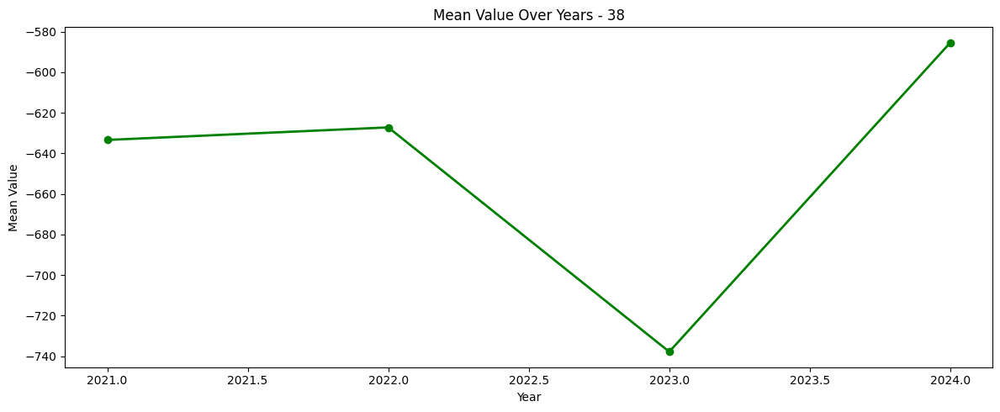

In [ ]:
# 7d. Mean value over time - dominant pollutant alone
top_poll = prefinal_df["Pollutant"].value_counts().head(5).index
dominant = top_poll[0]

fig, ax = plt.subplots(figsize=(12, 5))
sub = prefinal_df[prefinal_df["Pollutant"] == dominant].groupby("Year")["Value"].mean()
ax.plot(sub.index, sub.values, marker="o", linewidth=2, color="green")
ax.set_title(f"Mean Value Over Years - {dominant}")
ax.set_xlabel("Year")
ax.set_ylabel("Mean Value")
plt.tight_layout()
plt.show()

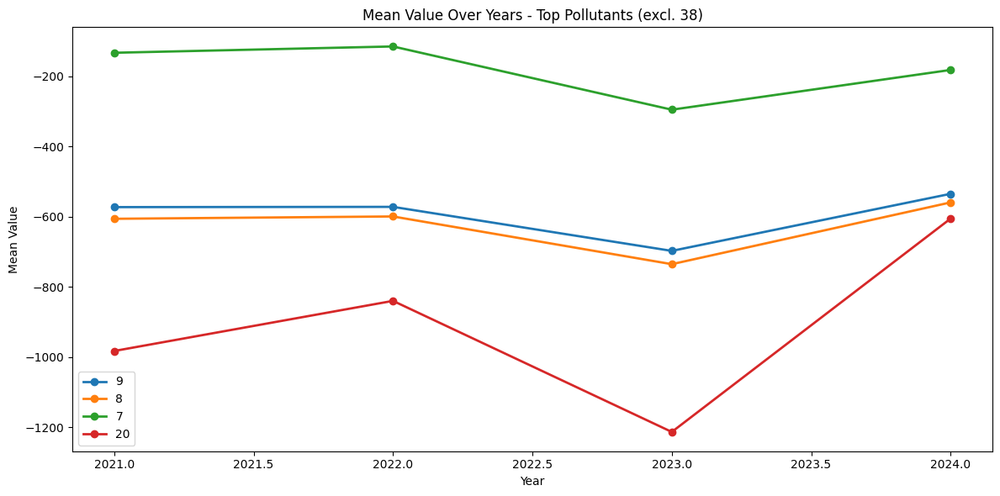

In [ ]:

# 7e. Mean value over time - others
others = [p for p in top_poll if p != dominant]
if others:
    fig, ax = plt.subplots(figsize=(12, 6))
    for poll in others:
        sub = prefinal_df[prefinal_df["Pollutant"] == poll].groupby("Year")["Value"].mean()
        ax.plot(sub.index, sub.values, marker="o", linewidth=2, label=poll)
    ax.set_title(f"Mean Value Over Years - Top Pollutants (excl. {dominant})")
    ax.set_xlabel("Year")
    ax.set_ylabel("Mean Value")
    ax.legend()
    plt.tight_layout()
    plt.show()


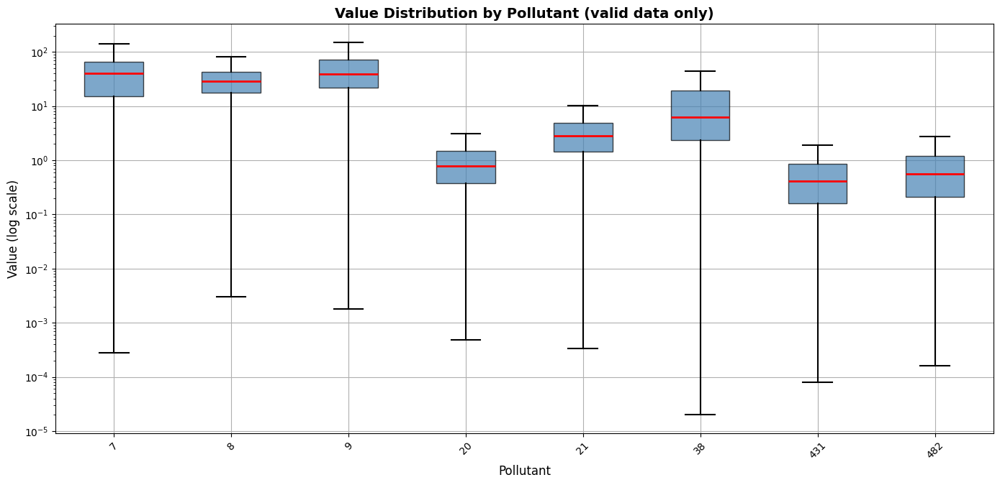

In [ ]:
top8 = prefinal_df["Pollutant"].value_counts().head(8).index
subset = prefinal_df[(prefinal_df["Pollutant"].isin(top8)) &
                      (prefinal_df["Value"] > 0)]

fig, ax = plt.subplots(figsize=(14, 7))
subset.boxplot(column="Value", by="Pollutant", ax=ax, rot=45,
               showfliers=False, patch_artist=True,
               boxprops=dict(facecolor="steelblue", alpha=0.7),
               medianprops=dict(color="red", linewidth=2),
               whiskerprops=dict(linewidth=1.5),
               capprops=dict(linewidth=1.5))
ax.set_yscale("log")
ax.set_title("Value Distribution by Pollutant (valid data only)", fontsize=14, fontweight="bold")
ax.set_xlabel("Pollutant", fontsize=12)
ax.set_ylabel("Value (log scale)", fontsize=12)
plt.suptitle("")
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# 8. ZERO & NEGATIVE VALUES
# ============================================================
print("\n" + "=" * 60)
print("8. ZERO & NEGATIVE VALUES")
print("=" * 60)
zero_count = (prefinal_df["Value"] == 0).sum()
neg_count = (prefinal_df["Value"] < 0).sum()
null_count = prefinal_df["Value"].isna().sum()
print(f"  Zeros: {zero_count:,} ({zero_count/len(prefinal_df)*100:.2f}%)")
print(f"  Negatives: {neg_count:,} ({neg_count/len(prefinal_df)*100:.2f}%)")
print(f"  Nulls: {null_count:,} ({null_count/len(prefinal_df)*100:.2f}%)")

if neg_count > 0:
    print(f"\n  Min negative value: {prefinal_df['Value'].min()}")
    print(f"  Negatives by pollutant:")
    negs = prefinal_df[prefinal_df["Value"] < 0]
    print(negs["Pollutant"].value_counts())



8. ZERO & NEGATIVE VALUES
  Zeros: 65,296 (3.42%)
  Negatives: 133,558 (6.99%)
  Nulls: 0 (0.00%)

  Min negative value: -9999.0
  Negatives by pollutant:
Pollutant
38     25352
8      23037
9      22784
20      9584
482     9358
21      9286
464     9246
431     9243
1       8253
7       5251
10      2164
Name: count, dtype: int64


In [ ]:
# Zero and negative breakdown by pollutant
print("=== ZEROS BY POLLUTANT ===")
for poll in prefinal_df["Pollutant"].unique():
    sub = prefinal_df[prefinal_df["Pollutant"] == poll]
    zeros = (sub["Value"] == 0).sum()
    negs = (sub["Value"] < 0).sum()
    nulls = sub["Value"].isna().sum()
    total = len(sub)
    print(f"  Pollutant {poll}: zeros={zeros:,} ({zeros/total*100:.1f}%) | "
          f"negatives={negs:,} ({negs/total*100:.1f}%) | "
          f"nulls={nulls:,} ({nulls/total*100:.1f}%) | total={total:,}")

# Check: are negatives very small (sensor noise) or large?
negs = prefinal_df[prefinal_df["Value"] < 0]
if len(negs) > 0:
    print(f"\n=== NEGATIVE VALUES ===")
    print(f"Count: {len(negs):,}")
    print(f"Range: {negs['Value'].min():.4f} to {negs['Value'].max():.4f}")
    print(f"\nDistribution:")
    print(negs["Value"].describe())

=== ZEROS BY POLLUTANT ===
  Pollutant 20: zeros=6,370 (6.1%) | negatives=9,584 (9.1%) | nulls=0 (0.0%) | total=105,192
  Pollutant 21: zeros=1,033 (1.0%) | negatives=9,286 (8.8%) | nulls=0 (0.0%) | total=105,192
  Pollutant 38: zeros=2,848 (0.8%) | negatives=25,352 (7.2%) | nulls=0 (0.0%) | total=350,640
  Pollutant 431: zeros=27,717 (26.3%) | negatives=9,243 (8.8%) | nulls=0 (0.0%) | total=105,192
  Pollutant 464: zeros=6,381 (6.1%) | negatives=9,246 (8.8%) | nulls=0 (0.0%) | total=105,192
  Pollutant 482: zeros=20,419 (19.4%) | negatives=9,358 (8.9%) | nulls=0 (0.0%) | total=105,192
  Pollutant 8: zeros=39 (0.0%) | negatives=23,037 (6.6%) | nulls=0 (0.0%) | total=350,640
  Pollutant 9: zeros=22 (0.0%) | negatives=22,784 (6.5%) | nulls=0 (0.0%) | total=350,640
  Pollutant 10: zeros=0 (0.0%) | negatives=2,164 (3.1%) | nulls=0 (0.0%) | total=70,128
  Pollutant 1: zeros=22 (0.0%) | negatives=8,253 (15.7%) | nulls=0 (0.0%) | total=52,584
  Pollutant 7: zeros=445 (0.2%) | negatives=5,251 

In [ ]:
# Are zeros happening at specific hours? (sensor downtime = midnight/maintenance?)
prefinal_df["Hour"] = pd.to_datetime(prefinal_df["Start"]).dt.hour
zeros = prefinal_df[prefinal_df["Value"] == 0]

print("Zeros by hour:")
print(zeros["Hour"].value_counts().sort_index())

print("\nZeros by Validity flag:")
print(zeros["Validity"].value_counts())

print("\nNon-zero data by Validity flag:")
valid_data = prefinal_df[(prefinal_df["Value"] > 0)]
print(valid_data["Validity"].value_counts())



Zeros by hour:
Hour
0     2592
1     2733
2     2899
3     3221
4     3706
5     3535
6     2754
7     2127
8     1782
9     1869
10    2076
11    2440
12    2801
13    3183
14    3425
15    3454
16    3201
17    2943
18    2597
19    2310
20    2306
21    2375
22    2418
23    2549
Name: count, dtype: int64

Zeros by Validity flag:
Validity
2    65296
Name: count, dtype: int64

Non-zero data by Validity flag:
Validity
1    1595145
2     116977
Name: count, dtype: int64


In [ ]:
# ============================================================
# 9. DUPLICATES
# ============================================================
print("\n" + "=" * 60)
print("9. DUPLICATES")
print("=" * 60)
print(f"Exact duplicate rows: {prefinal_df.duplicated().sum()}")
print(f"Duplicates by Samplingpoint + Start: {prefinal_df.duplicated(subset=['Samplingpoint', 'Start']).sum()}")
print(f"Duplicates by Samplingpoint + Start + Pollutant: {prefinal_df.duplicated(subset=['Samplingpoint', 'Start', 'Pollutant']).sum()}")


9. DUPLICATES
Exact duplicate rows: 0
Duplicates by Samplingpoint + Start: 0
Duplicates by Samplingpoint + Start + Pollutant: 0


In [ ]:
# ============================================================
# 10. DATA QUALITY SUMMARY
# ============================================================
print("\n" + "=" * 60)
print("10. DATA QUALITY SUMMARY")
print("=" * 60)
print(f"  Total rows: {len(prefinal_df):,}")
print(f"  Columns: {prefinal_df.shape[1]}")
print(f"  Columns with nulls: {(prefinal_df.isna().sum() > 0).sum()}")
print(f"  Exact duplicates: {prefinal_df.duplicated().sum()}")
print(f"  Unique sampling points: {prefinal_df['Samplingpoint'].nunique()}")
print(f"  Unique pollutants: {prefinal_df['Pollutant'].nunique()}")
print(f"  Year range: {prefinal_df['Year'].min()} - {prefinal_df['Year'].max()}")
print(f"  Value range: {prefinal_df['Value'].min()} to {prefinal_df['Value'].max()}")
print(f"  Zero values: {(prefinal_df['Value'] == 0).sum():,}")
print(f"  Negative values: {(prefinal_df['Value'] < 0).sum():,}")


10. DATA QUALITY SUMMARY
  Total rows: 1,910,976
  Columns: 14
  Columns with nulls: 1
  Exact duplicates: 0
  Unique sampling points: 55
  Unique pollutants: 11
  Year range: 2021 - 2024
  Value range: -9999.0 to 1135.98413
  Zero values: 65,296
  Negative values: 133,558


### 4.2 Parquet Data Cleaning & Merge with Station Metadata

**Cleaning strategy:** We drop uninformative columns (AggType, ResultTime, DataCapture), remove the `IT/` prefix from sampling point IDs to align formats, replace all Validity=2 readings with NaN (flagged as unreliable by the source), and remove remaining negative values (sensor artifacts). We then merge the hourly measurements with station metadata on Samplingpoint + Year.

In [ ]:
# Drop 'AggType' — not useful for analysis
# Drop 'ResultTime' — only 4 unique values, not informative
# Drop 'DataCapture' — 100% NaN, no data
# Drop 'FkObservationLog' — not useful for analysis
prefinal_df = prefinal_df.drop(columns=["AggType", "ResultTime", "DataCapture", "FkObservationLog"])

print(f"Remaining columns: {prefinal_df.shape[1]}")
print(prefinal_df.columns.tolist())

Remaining columns: 10
['Samplingpoint', 'Pollutant', 'Start', 'End', 'Value', 'Unit', 'Validity', 'Verification', 'Year', 'Hour']


In [ ]:
# Remove 'IT/' prefix from Samplingpoint in prefinal_df to match df_stats format
# df_stats uses: SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00
# prefinal_df uses: IT/SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00
prefinal_df["Samplingpoint"] = prefinal_df["Samplingpoint"].str.replace("IT/", "", n=1)

# Verify
print("Prefinal sample:", prefinal_df["Samplingpoint"].iloc[0])

Prefinal sample: SPO.IT0825A_20_GC-PID_2006-07-26_00:00:00


In [ ]:
# Replace ALL Validity=2 values with NaN — Validity 2 means "not valid/unreliable"
# This covers zeros, negatives, and any other values flagged as invalid
v2_count = (prefinal_df["Validity"] == 2).sum()

prefinal_df.loc[prefinal_df["Validity"] == 2, "Value"] = np.nan

print(f"Validity=2 values replaced: {v2_count:,}")
print(f"Total NaN in Value now: {prefinal_df['Value'].isna().sum():,}")

Validity=2 values replaced: 188,097
Total NaN in Value now: 188,097


In [ ]:
# Replace any remaining negative values with NaN — sensor noise/artifacts
remaining_neg = (prefinal_df["Value"] < 0).sum()

prefinal_df.loc[prefinal_df["Value"] < 0, "Value"] = np.nan

print(f"Remaining negatives replaced: {remaining_neg:,}")
print(f"Total NaN in Value now: {prefinal_df['Value'].isna().sum():,}")

Remaining negatives replaced: 127,734
Total NaN in Value now: 315,831


In [ ]:
# Drop 'Unit Of Air Pollution Level' — unit info already in prefinal_df's 'Unit' column
# Drop 'Air Pollution Level' — aggregated stat, prefinal_df has the actual hourly values
df_stats = df_stats.drop(columns=["Unit Of Air Pollution Level", "Air Pollution Level"])

print(f"Remaining columns: {df_stats.shape[1]}")
print(df_stats.columns.tolist())

Remaining columns: 11
['Air Quality Station Name', 'Sampling Point Id', 'Pollutant', 'Air Pollutant Description', 'Data Aggregation Process Id', 'Data Aggregation Process', 'Year', 'Longitude', 'Latitude', 'Altitude', 'Link to raw data (only E1a/validated data from AQ e-Reporting)']


In [ ]:
# Check df_stats: same Samplingpoint + Year, different pollutants
stats_grouped = df_stats.groupby(["Sampling Point Id", "Year"])["Pollutant"].nunique().reset_index()
stats_multi = stats_grouped[stats_grouped["Pollutant"] > 1]
print("df_stats:")
print(f"  Total Samplingpoint+Year groups: {len(stats_grouped)}")
print(f"  Groups with multiple pollutants: {len(stats_multi)}")

# Check prefinal_df: same Samplingpoint + Year, different pollutants
pf_grouped = prefinal_df.groupby(["Samplingpoint", "Year"])["Pollutant"].nunique().reset_index()
pf_multi = pf_grouped[pf_grouped["Pollutant"] > 1]
print("\nprefinal_df:")
print(f"  Total Samplingpoint+Year groups: {len(pf_grouped)}")
print(f"  Groups with multiple pollutants: {len(pf_multi)}")

# Show examples if any
if len(pf_multi) > 0:
    print("\nPrefinal examples:")
    for _, row in pf_multi.head(3).iterrows():
        sp = row["Samplingpoint"]
        yr = row["Year"]
        sub = prefinal_df[(prefinal_df["Samplingpoint"] == sp) & (prefinal_df["Year"] == yr)]
        print(f"  {sp} | Year: {yr} | Pollutant: {sub['Pollutant'].unique()}")

df_stats:
  Total Samplingpoint+Year groups: 218
  Groups with multiple pollutants: 0

prefinal_df:
  Total Samplingpoint+Year groups: 218
  Groups with multiple pollutants: 0


In [ ]:
# Drop Pollutant_code from prefinal_df — each Samplingpoint+Year already maps to one pollutant
# Pollutant name will come from df_stats after merging on Samplingpoint + Year
prefinal_df = prefinal_df.drop(columns=["Pollutant"])

print(f"Remaining columns: {prefinal_df.columns.tolist()}")

Remaining columns: ['Samplingpoint', 'Start', 'End', 'Value', 'Unit', 'Validity', 'Verification', 'Year', 'Hour']


In [ ]:
df_stats = df_stats.rename(columns={"Sampling Point Id": "Samplingpoint"})

print("Done. Column renamed to 'Samplingpoint'")

Done. Column renamed to 'Samplingpoint'


In [ ]:
dupes = df_stats.duplicated(subset=["Samplingpoint", "Year"], keep=False)
print(f"Duplicate Samplingpoint+Year in df_stats: {dupes.sum()}")

# Show an example
example = df_stats[df_stats.duplicated(subset=["Samplingpoint", "Year"], keep=False)]
sp = example["Samplingpoint"].iloc[0]
yr = example["Year"].iloc[0]
print(f"\nExample: {sp} | Year: {yr}")
print(df_stats[(df_stats["Samplingpoint"] == sp) & (df_stats["Year"] == yr)])

Duplicate Samplingpoint+Year in df_stats: 0


IndexError: single positional indexer is out-of-bounds

In [ ]:
# Check before
print(f"Before: {len(df_stats):,} rows")

df_stats = df_stats.drop(columns=["Data Aggregation Process Id", "Data Aggregation Process"])
df_stats = df_stats.drop_duplicates()

print(f"After: {len(df_stats):,} rows")

# Verify: each Samplingpoint+Year should now have exactly 1 row
check = df_stats.groupby(["Samplingpoint", "Year"]).size()
print(f"Max rows per Samplingpoint+Year: {check.max()}")

Before: 218 rows


KeyError: "['Data Aggregation Process Id', 'Data Aggregation Process'] not found in axis"

In [ ]:
# Drop Calculation Time and Link — differ per aggregation type, not needed for analysis
df_stats = df_stats.drop(columns=[

    "Link to raw data (only E1a/validated data from AQ e-Reporting)"
])

# Now deduplicate
df_stats = df_stats.drop_duplicates()

print(f"After: {len(df_stats):,} rows")
check = df_stats.groupby(["Samplingpoint", "Year"]).size()
print(f"Max rows per Samplingpoint+Year: {check.max()}")

After: 218 rows
Max rows per Samplingpoint+Year: 1


In [ ]:
import gc
gc.collect()

print(f"prefinal_df: {len(prefinal_df):,} rows")
print(f"df_stats: {len(df_stats):,} rows")

df_merged = pd.merge(
    prefinal_df,
    df_stats,
    on=["Samplingpoint", "Year"],
    how="left",
    suffixes=("", "_stats"),
)

print(f"Merged: {len(df_merged):,} rows — should equal prefinal_df rows")
print(f"Columns: {df_merged.columns.tolist()}")

prefinal_df: 1,910,976 rows
df_stats: 218 rows
Merged: 1,910,976 rows — should equal prefinal_df rows
Columns: ['Samplingpoint', 'Start', 'End', 'Value', 'Unit', 'Validity', 'Verification', 'Year', 'Hour', 'Air Quality Station Name', 'Pollutant', 'Air Pollutant Description', 'Longitude', 'Latitude', 'Altitude']


In [ ]:
df_merged.describe()

AttributeError: 'NoneType' object has no attribute 'describe'

In [ ]:
df_merged = df_merged.to_csv("df_merged_stats_parquet_pre.csv")

---
## 5. Wind Data
### 5.1 Data Collection & Inspection

Wind data is pulled from the **Open-Meteo Archive API** for 10 stations across the Lazio region, covering 2018–2024. Variables include hourly **wind speed** (10m) and **wind direction** (10m). This data will be matched to the nearest air quality station to study how wind conditions affect pollution dispersion.

In [ ]:
"""
Pull hourly wind data from Open-Meteo API
==========================================
10 Lazio stations, 2018-01-01 to 2024-12-31

pip install openmeteo-requests requests-cache retry-requests
"""

import openmeteo_requests
import pandas as pd
import requests_cache
from retry_requests import retry
import time

cache_session = requests_cache.CachedSession('.cache', expire_after=3600)
retry_session = retry(cache_session, retries=5, backoff_factor=0.2)
openmeteo = openmeteo_requests.Client(session=retry_session)

ARCHIVE_URL = "https://archive-api.open-meteo.com/v1/archive"
OUTPUT_PATH = "/content/wind_data_lazio.csv"

stations = {
    "ARENULA":          {"lat": 41.894,  "lon": 12.4754},
    "BUFALOTTA":        {"lat": 41.9477, "lon": 12.5337},
    "C.SO FRANCIA":     {"lat": 41.9474, "lon": 12.4696},
    "CINECITTA":        {"lat": 41.8577, "lon": 12.5687},
    "CIPRO":            {"lat": 41.9064, "lon": 12.4476},
    "FERMI":            {"lat": 41.864,  "lon": 12.4696},
    "L.GO MAGNA GRECIA":{"lat": 41.8831, "lon": 12.509},
    "L.GO PERESTRELLO": {"lat": 41.886,  "lon": 12.5416},
    "TIBURTINA":        {"lat": 41.9103, "lon": 12.5489},
    "VILLA ADA":        {"lat": 41.9329, "lon": 12.5069},
}

START_DATE = "2018-01-01"
END_DATE = "2024-12-31"

all_dfs = []

for name, coords in stations.items():
    print(f"Fetching {name}...")

    try:
        params = {
            "latitude": coords["lat"],
            "longitude": coords["lon"],
            "start_date": START_DATE,
            "end_date": END_DATE,
            "hourly": ["wind_speed_10m", "wind_direction_10m"],
            "timezone": "Europe/Rome",
        }

        responses = openmeteo.weather_api(ARCHIVE_URL, params=params)
        response = responses[0]

        hourly = response.Hourly()
        wind_speed = hourly.Variables(0).ValuesAsNumpy()
        wind_direction = hourly.Variables(1).ValuesAsNumpy()

        dates = pd.date_range(
            start=pd.to_datetime(hourly.Time(), unit="s", utc=True),
            end=pd.to_datetime(hourly.TimeEnd(), unit="s", utc=True),
            freq=pd.Timedelta(seconds=hourly.Interval()),
            inclusive="left",
        )

        df = pd.DataFrame({
            "date": dates,
            "wind_speed_10m": wind_speed,
            "wind_direction_10m": wind_direction,
            "station": name,
            "latitude": coords["lat"],
            "longitude": coords["lon"],
        })

        all_dfs.append(df)
        print(f"  {len(df):,} rows")

    except Exception as e:
        print(f"  ERROR: {e}")

    time.sleep(1)

print("\nCombining...")
df_wind = pd.concat(all_dfs, ignore_index=True)
print(f"Total rows: {df_wind.shape[0]:,}")
print(f"Date range: {df_wind['date'].min()} to {df_wind['date'].max()}")

df_wind.to_csv(OUTPUT_PATH, index=False)
print(f"Saved to {OUTPUT_PATH}")

Fetching ARENULA...
  61,368 rows
Fetching BUFALOTTA...
  61,368 rows
Fetching C.SO FRANCIA...
  61,368 rows
Fetching CINECITTA...
  61,368 rows
Fetching CIPRO...
  61,368 rows
Fetching FERMI...
  61,368 rows
Fetching L.GO MAGNA GRECIA...
  61,368 rows
Fetching L.GO PERESTRELLO...
  61,368 rows
Fetching TIBURTINA...
  61,368 rows
Fetching VILLA ADA...
  61,368 rows

Combining...
Total rows: 613,680
Date range: 2017-12-31 23:00:00+00:00 to 2024-12-31 22:00:00+00:00
Saved to /content/wind_data_lazio.csv


In [ ]:
wind_df = pd.read_csv("wind_data_lazio.csv")

In [ ]:
# ============================================================
print("=" * 60)
print("1. BASIC STRUCTURE")
print("=" * 60)
print(f"Shape: {wind_df.shape[0]:,} rows x {wind_df.shape[1]} columns")
print(f"\nColumns: {wind_df.columns.tolist()}")
print(f"\nData types:")
print(wind_df.dtypes)
print(f"\nFirst 5 rows:")
print(wind_df.head())


1. BASIC STRUCTURE
Shape: 613,680 rows x 6 columns

Columns: ['date', 'wind_speed_10m', 'wind_direction_10m', 'station', 'latitude', 'longitude']

Data types:
date                   object
wind_speed_10m        float64
wind_direction_10m    float64
station                object
latitude              float64
longitude             float64
dtype: object

First 5 rows:
                        date  wind_speed_10m  wind_direction_10m  station  \
0  2017-12-31 23:00:00+00:00        9.387651          147.528820  ARENULA   
1  2018-01-01 00:00:00+00:00        9.885262          146.888640  ARENULA   
2  2018-01-01 01:00:00+00:00        9.793059          126.027466  ARENULA   
3  2018-01-01 02:00:00+00:00       10.636766          113.962494  ARENULA   
4  2018-01-01 03:00:00+00:00       11.384198          124.695220  ARENULA   

   latitude  longitude  
0    41.894    12.4754  
1    41.894    12.4754  
2    41.894    12.4754  
3    41.894    12.4754  
4    41.894    12.4754  


In [ ]:
# ============================================================
# 2. SUMMARY STATISTICS
# ============================================================
print("\n" + "=" * 60)
print("2. SUMMARY STATISTICS")
print("=" * 60)
print(wind_df.describe())


2. SUMMARY STATISTICS
       wind_speed_10m  wind_direction_10m       latitude      longitude
count   613680.000000       613680.000000  613680.000000  613680.000000
mean         9.816256          141.763262      41.902950      12.507100
std          5.931831          104.492338       0.030442       0.038472
min          0.000000            0.437356      41.857700      12.447600
25%          5.495161           39.093860      41.883100      12.469600
50%          8.287822          140.194470      41.900200      12.507950
75%         13.039754          224.999900      41.932900      12.541600
max         54.275300          360.000000      41.947700      12.568700


In [ ]:
print("\n" + "=" * 60)
print("3. MISSING DATA")
print("=" * 60)
nulls = wind_df.isna().sum()
null_pct = (wind_df.isna().sum() / len(wind_df) * 100).round(2)
missing = pd.DataFrame({"count": nulls, "percent": null_pct}).sort_values("percent", ascending=False)
print(missing.to_string())


3. MISSING DATA
                    count  percent
date                    0     0.00
wind_speed_10m          0     0.00
wind_direction_10m      0     0.00
station                 0     0.00
latitude                0     0.00
longitude               0     0.00


In [ ]:
# 5. DATE RANGE
# ============================================================
print("\n" + "=" * 60)
print("5. DATE RANGE")
print("=" * 60)
wind_df["date"] = pd.to_datetime(wind_df["date"])
wind_df["Year"] = wind_df["date"].dt.year
print(f"Date range: {wind_df['date'].min()} to {wind_df['date'].max()}")
print(f"\nRecords per year:")
print(wind_df["Year"].value_counts().sort_index())


5. DATE RANGE
Date range: 2017-12-31 23:00:00+00:00 to 2024-12-31 22:00:00+00:00

Records per year:
Year
2017       10
2018    87600
2019    87600
2020    87840
2021    87600
2022    87600
2023    87600
2024    87830
Name: count, dtype: int64


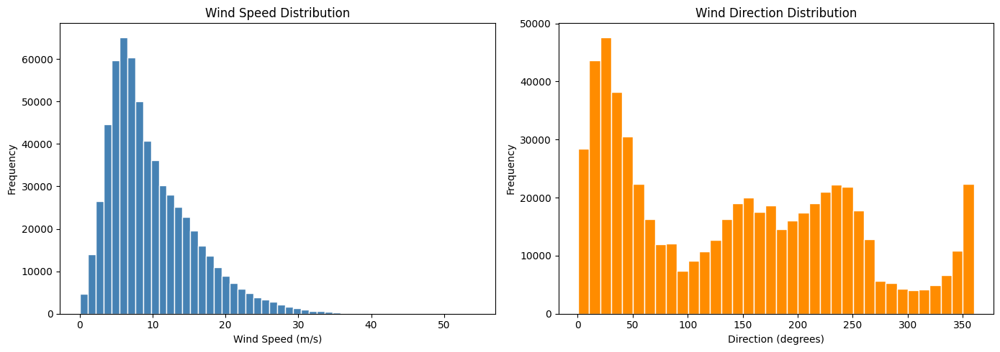

In [ ]:
# 6a. Wind speed distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

wind_df["wind_speed_10m"].dropna().plot(kind="hist", bins=50, ax=axes[0], color="steelblue", edgecolor="white")
axes[0].set_title("Wind Speed Distribution")
axes[0].set_xlabel("Wind Speed (m/s)")

wind_df["wind_direction_10m"].dropna().plot(kind="hist", bins=36, ax=axes[1], color="darkorange", edgecolor="white")
axes[1].set_title("Wind Direction Distribution")
axes[1].set_xlabel("Direction (degrees)")

plt.tight_layout()
plt.show()


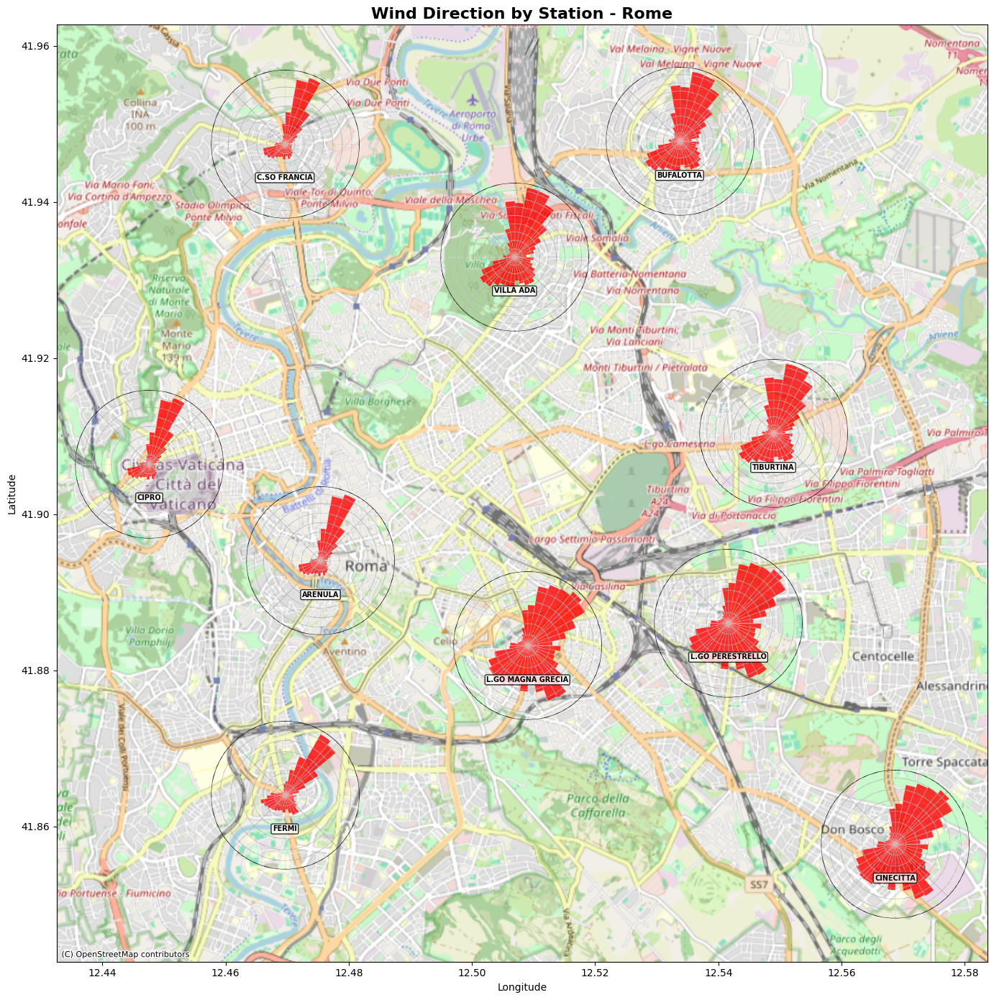

In [ ]:
import contextily as ctx
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from io import BytesIO

stations_info = wind_df.groupby("station").agg({"latitude": "first", "longitude": "first"}).reset_index()
direction_bins = np.linspace(0, 360, 37)

fig, ax_map = plt.subplots(figsize=(14, 14))

# Set map bounds with padding
pad = 0.015
ax_map.set_xlim(stations_info["longitude"].min() - pad, stations_info["longitude"].max() + pad)
ax_map.set_ylim(stations_info["latitude"].min() - pad, stations_info["latitude"].max() + pad)

# Add basemap
ctx.add_basemap(ax_map, crs="EPSG:4326", source=ctx.providers.OpenStreetMap.Mapnik)

# For each station, create a mini wind rose and paste it on the map
for _, row in stations_info.iterrows():
    station = row["station"]
    lat, lon = row["latitude"], row["longitude"]

    # Create mini wind rose as an image
    fig_mini, ax_mini = plt.subplots(figsize=(4, 4), subplot_kw={"projection": "polar"})
    data = wind_df[wind_df["station"] == station]["wind_direction_10m"].dropna()
    counts, _ = np.histogram(data, bins=direction_bins)
    theta = np.deg2rad((direction_bins[:-1] + direction_bins[1:]) / 2)
    ax_mini.bar(theta, counts, width=np.deg2rad(10), color="red", alpha=0.8, edgecolor="white", linewidth=0.3)
    ax_mini.set_theta_zero_location("N")
    ax_mini.set_theta_direction(-1)
    ax_mini.set_yticklabels([])
    ax_mini.set_xticklabels([])
    ax_mini.patch.set_alpha(0)
    fig_mini.patch.set_alpha(0)

    # Save mini figure to buffer
    buf = BytesIO()
    fig_mini.savefig(buf, format="png", dpi=80, bbox_inches="tight", transparent=True)
    plt.close(fig_mini)
    buf.seek(0)

    # Read image and place on map
    from PIL import Image
    img = Image.open(buf)
    img_array = np.array(img)

    im = OffsetImage(img_array, zoom=0.6)
    ab = AnnotationBbox(im, (lon, lat), frameon=False)
    ax_map.add_artist(ab)

    # Add station name
    ax_map.annotate(station, (lon, lat), fontsize=7, fontweight="bold",
                    ha="center", va="top", xytext=(0, -30), textcoords="offset points",
                    bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.8))

ax_map.set_title("Wind Direction by Station - Rome", fontsize=16, fontweight="bold")
ax_map.set_xlabel("Longitude")
ax_map.set_ylabel("Latitude")
plt.tight_layout()
plt.show()

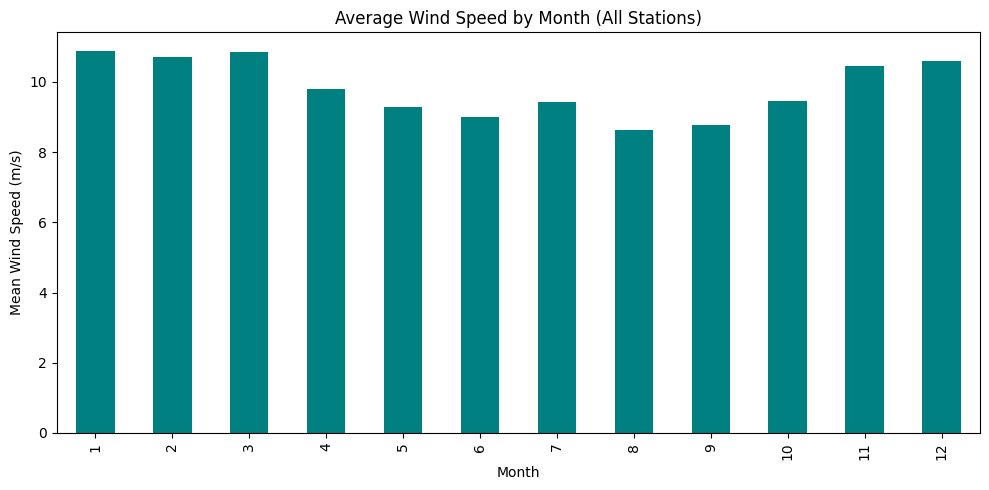

In [ ]:
# 6d. Monthly average wind speed
wind_df["month"] = wind_df["date"].dt.month
monthly = wind_df.groupby("month")["wind_speed_10m"].mean()

fig, ax = plt.subplots(figsize=(10, 5))
monthly.plot(kind="bar", ax=ax, color="teal")
ax.set_title("Average Wind Speed by Month (All Stations)")
ax.set_xlabel("Month")
ax.set_ylabel("Mean Wind Speed (m/s)")
plt.tight_layout()
plt.show()


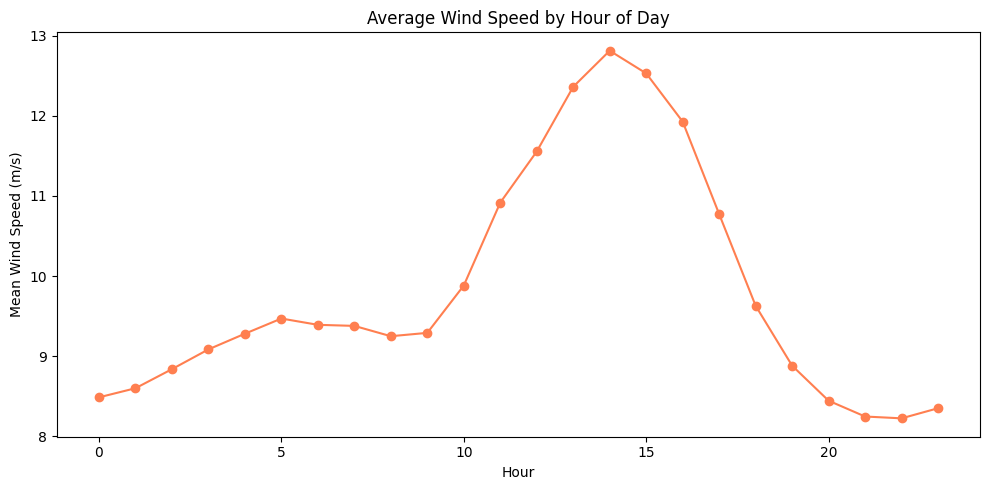

In [ ]:

# 6e. Hourly pattern
wind_df["hour"] = wind_df["date"].dt.hour
hourly = wind_df.groupby("hour")["wind_speed_10m"].mean()

fig, ax = plt.subplots(figsize=(10, 5))
hourly.plot(kind="line", ax=ax, marker="o", color="coral")
ax.set_title("Average Wind Speed by Hour of Day")
ax.set_xlabel("Hour")
ax.set_ylabel("Mean Wind Speed (m/s)")
plt.tight_layout()
plt.show()


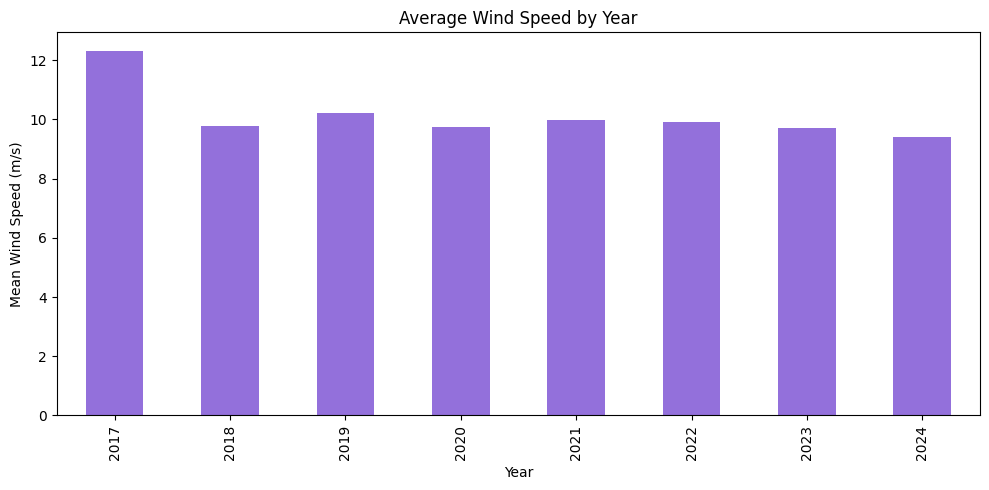

In [ ]:
# 6f. Yearly average wind speed
yearly = wind_df.groupby("Year")["wind_speed_10m"].mean()

fig, ax = plt.subplots(figsize=(10, 5))
yearly.plot(kind="bar", ax=ax, color="mediumpurple")
ax.set_title("Average Wind Speed by Year")
ax.set_xlabel("Year")
ax.set_ylabel("Mean Wind Speed (m/s)")
plt.tight_layout()
plt.show()


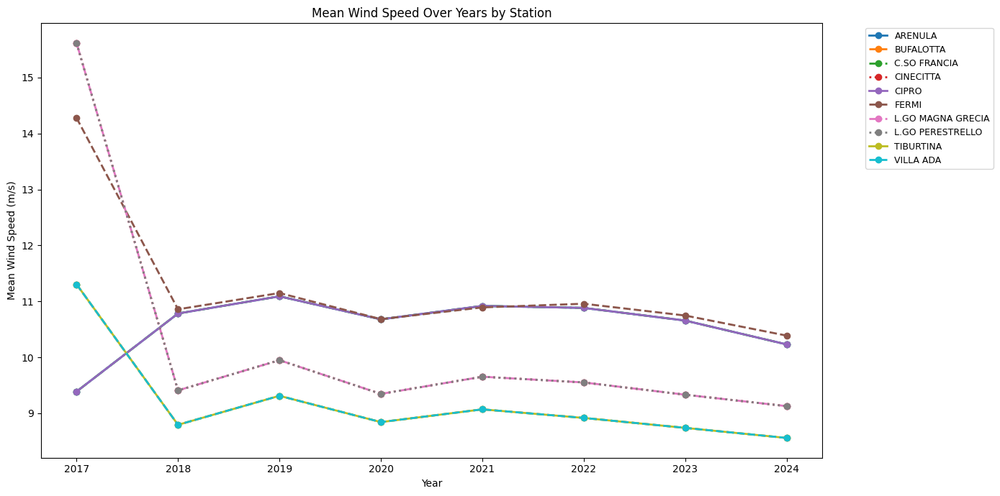

In [ ]:
fig, ax = plt.subplots(figsize=(14, 7))
stations_sorted = sorted(wind_df["station"].unique())
colors = plt.cm.tab10(np.linspace(0, 1, len(stations_sorted)))
linestyles = ["-", "--", "-.", ":", "-", "--", "-.", ":", "-", "--"]

for i, station in enumerate(stations_sorted):
    sub = wind_df[wind_df["station"] == station].groupby("Year")["wind_speed_10m"].mean()
    ax.plot(sub.index, sub.values, marker="o", linewidth=2,
            label=station, color=colors[i], linestyle=linestyles[i])

ax.set_title("Mean Wind Speed Over Years by Station")
ax.set_xlabel("Year")
ax.set_ylabel("Mean Wind Speed (m/s)")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=9)
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# 7. ZERO & NEGATIVE VALUES
# ============================================================
print("\n" + "=" * 60)
print("7. ZERO & NEGATIVE VALUES")
print("=" * 60)
for col in ["wind_speed_10m", "wind_direction_10m"]:
    zeros = (wind_df[col] == 0).sum()
    negs = (wind_df[col] < 0).sum()
    nulls = wind_df[col].isna().sum()
    print(f"  {col}: zeros={zeros:,} ({zeros/len(wind_df)*100:.2f}%) | "
          f"negatives={negs:,} | nulls={nulls:,}")


7. ZERO & NEGATIVE VALUES
  wind_speed_10m: zeros=256 (0.04%) | negatives=0 | nulls=0
  wind_direction_10m: zeros=0 (0.00%) | negatives=0 | nulls=0


In [ ]:
# 8. DUPLICATES
# ============================================================
print("\n" + "=" * 60)
print("8. DUPLICATES")
print("=" * 60)
print(f"Exact duplicate rows: {wind_df.duplicated().sum()}")
print(f"Duplicates by station + date: {wind_df.duplicated(subset=['station', 'date']).sum()}")


8. DUPLICATES
Exact duplicate rows: 0
Duplicates by station + date: 0


In [ ]:
print("\n" + "=" * 60)
print("9. DATA QUALITY SUMMARY")
print("=" * 60)
print(f"  Total rows: {len(wind_df):,}")
print(f"  Columns: {wind_df.shape[1]}")
print(f"  Columns with nulls: {(wind_df.isna().sum() > 0).sum()}")
print(f"  Exact duplicates: {wind_df.duplicated().sum()}")
print(f"  Unique stations: {wind_df['station'].nunique()}")
print(f"  Date range: {wind_df['date'].min()} to {wind_df['date'].max()}")
print(f"  Wind speed range: {wind_df['wind_speed_10m'].min():.2f} to {wind_df['wind_speed_10m'].max():.2f} m/s")
print(f"  Wind direction range: {wind_df['wind_direction_10m'].min():.1f} to {wind_df['wind_direction_10m'].max():.1f} degrees")


9. DATA QUALITY SUMMARY
  Total rows: 613,680
  Columns: 9
  Columns with nulls: 0
  Exact duplicates: 0
  Unique stations: 10
  Date range: 2017-12-31 23:00:00+00:00 to 2024-12-31 22:00:00+00:00
  Wind speed range: 0.00 to 54.28 m/s
  Wind direction range: 0.4 to 360.0 degrees


### 5.2 Wind Data Cleaning & Matching to Air Quality Stations

**Matching strategy:** We filter wind data to 2021–2024, then use the Haversine formula to find the nearest wind station for each air quality station. Data is merged on the matching station pair + hourly timestamp (floored to the nearest hour).

In [ ]:
# Filter wind data to 2021-2024 to match air quality data range
wind_df["date"] = pd.to_datetime(wind_df["date"]).dt.tz_localize(None)
wind_df = wind_df[wind_df["date"].dt.year.between(2021, 2024)].copy()

print(f"Wind rows after filtering: {len(wind_df):,}")
print(f"Date range: {wind_df['date'].min()} to {wind_df['date'].max()}")

Wind rows after filtering: 350,630
Date range: 2021-01-01 00:00:00 to 2024-12-31 22:00:00


In [ ]:
df_merged = pd.read_csv("df_merged.csv")

In [ ]:
from math import radians, sin, cos, sqrt, atan2

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    return R * 2 * atan2(sqrt(a), sqrt(1-a))

# Get unique wind stations
wind_stations = wind_df[["station", "latitude", "longitude"]].drop_duplicates()

# For each air quality station, find closest wind station
aq_stations = df_merged[["Air Quality Station Name", "Latitude", "Longitude"]].drop_duplicates()

station_mapping = {}
for _, aq in aq_stations.iterrows():
    min_dist = float("inf")
    closest = None
    for _, ws in wind_stations.iterrows():
        d = haversine(aq["Latitude"], aq["Longitude"], ws["latitude"], ws["longitude"])
        if d < min_dist:
            min_dist = d
            closest = ws["station"]
    station_mapping[aq["Air Quality Station Name"]] = closest

# Add closest wind station column to df_merged
df_merged["wind_station"] = df_merged["Air Quality Station Name"].map(station_mapping)

print("Station mapping:")
for aq, ws in station_mapping.items():
    print(f"  {aq} -> {ws}")

Station mapping:
  C.SO FRANCIA -> C.SO FRANCIA
  nan -> None


In [ ]:
df_merged["Start"] = pd.to_datetime(df_merged["Start"], format="mixed")
wind_df["date"] = pd.to_datetime(wind_df["date"], format="mixed")

In [ ]:
# Make sure both datetimes are aligned
df_merged["Start"] = pd.to_datetime(df_merged["Start"])
wind_df["date"] = pd.to_datetime(wind_df["date"])

# Round both to nearest hour to ensure matching
df_merged["hour_key"] = df_merged["Start"].dt.floor("H")
wind_df["hour_key"] = wind_df["date"].dt.floor("H")

# Merge: match wind station + hour
df_wind_merged = pd.merge(
    df_merged,
    wind_df[["station", "hour_key", "wind_speed_10m", "wind_direction_10m"]],
    left_on=["wind_station", "hour_key"],
    right_on=["station", "hour_key"],
    how="left"
)

# Drop extra columns
df_wind_merged = df_wind_merged.drop(columns=["station", "hour_key"])

matched = df_wind_merged["wind_speed_10m"].notna().sum()
total = len(df_wind_merged)
print(f"Rows: {total:,}")
print(f"Wind data matched: {matched:,} ({matched/total*100:.1f}%)")

Rows: 69,272
Wind data matched: 69,270 (100.0%)


/tmp/ipykernel_335/1020535443.py:6: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_merged["hour_key"] = df_merged["Start"].dt.floor("H")
/tmp/ipykernel_335/1020535443.py:7: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  wind_df["hour_key"] = wind_df["date"].dt.floor("H")


In [ ]:
df_wind_merged = df_wind_merged.to_csv("air_wind_last_.csv")

---
## 6. Vehicle Registration Data
### 6.1 Data Inspection

Vehicle registration data covers cars registered in the Rome area. Key fields include registration year, fuel type, and engine power. This dataset allows us to track the shift from internal combustion engines (ICE) to hybrid and electric vehicles and correlate fleet composition trends with air quality changes.

In [ ]:
df_cars = pd.read_csv("car-data_big.csv")

/tmp/ipykernel_834/3397300776.py:1: DtypeWarning: Columns (6,35,37,38) have mixed types. Specify dtype option on import or set low_memory=False.
  df_cars = pd.read_csv("car-data_big.csv")


In [ ]:
# ============================================================
# 1. BASIC STRUCTURE
# ============================================================
print("=" * 60)
print("1. BASIC STRUCTURE")
print("=" * 60)
print(f"Shape: {df_cars.shape[0]:,} rows x {df_cars.shape[1]} columns")
print(f"\nColumns: {df_cars.columns.tolist()}")
print(f"\nData types:")
print(df_cars.dtypes)
print(f"\nFirst 5 rows:")
print(df_cars.head())


1. BASIC STRUCTURE
Shape: 9,186,905 rows x 5 columns

Columns: ['ID', 'Ft', 'ep (KW)', 'year', 'Date of registration']

Data types:
ID                        int64
Ft                       object
ep (KW)                 float64
year                      int64
Date of registration     object
dtype: object

First 5 rows:
       ID      Ft  ep (KW)  year Date of registration
0  281483  petrol     85.0  2019                  NaN
1  281484  diesel    120.0  2019                  NaN
2  281485  petrol     70.0  2019                  NaN
3  281486  petrol     51.0  2019                  NaN
4  281487  petrol     70.0  2019                  NaN


In [ ]:
# ============================================================
# 2. SUMMARY STATISTICS
# ============================================================
print("\n" + "=" * 60)
print("2. SUMMARY STATISTICS")
print("=" * 60)
print(df_cars.describe())



2. SUMMARY STATISTICS
                 ID       ep (KW)          year
count  9.186905e+06  9.183744e+06  9.186905e+06
mean   7.033781e+07  8.805217e+01  2.021424e+03
std    6.026699e+07  4.096723e+01  1.775777e+00
min    2.611500e+04  5.000000e+00  2.019000e+03
25%    4.192267e+06  6.300000e+01  2.020000e+03
50%    4.723938e+07  8.100000e+01  2.021000e+03
75%    1.293209e+08  1.000000e+02  2.023000e+03
max    1.609261e+08  9.320000e+02  2.024000e+03


In [ ]:
print("\n" + "=" * 60)
print("3. MISSING DATA")
print("=" * 60)
nulls = df_cars.isna().sum()
null_pct = (df_cars.isna().sum() / len(df_cars) * 100).round(2)
missing = pd.DataFrame({"count": nulls, "percent": null_pct}).sort_values("percent", ascending=False)
print(missing.to_string())



3. MISSING DATA
                        count  percent
Date of registration  3298240    35.90
ep (KW)                  3161     0.03
ID                          0     0.00
Ft                          0     0.00
year                        0     0.00


In [ ]:
# ============================================================
# 4. UNIQUE VALUES
# ============================================================
print("\n" + "=" * 60)
print("4. UNIQUE VALUES")
print("=" * 60)
for col in df_cars.columns:
    print(f"  {col}: {df_cars[col].nunique()} unique")



4. UNIQUE VALUES
  ID: 8979207 unique
  Ft: 19 unique
  ep (KW): 344 unique
  year: 6 unique
  Date of registration: 1037 unique


In [ ]:
# ============================================================
print("\n" + "=" * 60)
print("8. DUPLICATES")
print("=" * 60)
print(f"Exact duplicate rows: {df_cars.duplicated().sum()}")
print(f"Duplicate IDs: {df_cars.duplicated(subset=['ID']).sum()}")


8. DUPLICATES
Exact duplicate rows: 0
Duplicate IDs: 207698


In [ ]:
# 5. KEY DISTRIBUTIONS
# ============================================================
print("\n" + "=" * 60)
print("5. KEY DISTRIBUTIONS")
print("=" * 60)

print("\nFuel Types:")
print(df_cars["Ft"].value_counts())

print("\nRegistration Year:")
print(df_cars["year"].value_counts().sort_index())

# Standardize to lowercase first
df_cars["Ft"] = df_cars["Ft"].str.lower().str.strip()

print("After standardizing:")
print(df_cars["Ft"].value_counts())


5. KEY DISTRIBUTIONS

Fuel Types:
Ft
petrol             2872495
PETROL             2274939
diesel             1429019
DIESEL             1174837
lpg                 423587
LPG                 316521
PETROL/ELECTRIC     151125
ELECTRIC            148919
electric            142360
petrol/electric     121034
NG                   65341
ng                   33438
DIESEL/ELECTRIC       9853
NG-BIOMETHANE         8380
ng-biomethane         8254
diesel/electric       6331
e85                    429
HYDROGEN                23
hydrogen                20
Name: count, dtype: int64

Registration Year:
year
2019    1917399
2020    1380839
2021    1456472
2022    1312627
2023    1564184
2024    1555384
Name: count, dtype: int64
After standardizing:
Ft
petrol             5147434
diesel             2603856
lpg                 740108
electric            291279
petrol/electric     272159
ng                   98779
ng-biomethane        16634
diesel/electric      16184
e85                    429
hydrogen 

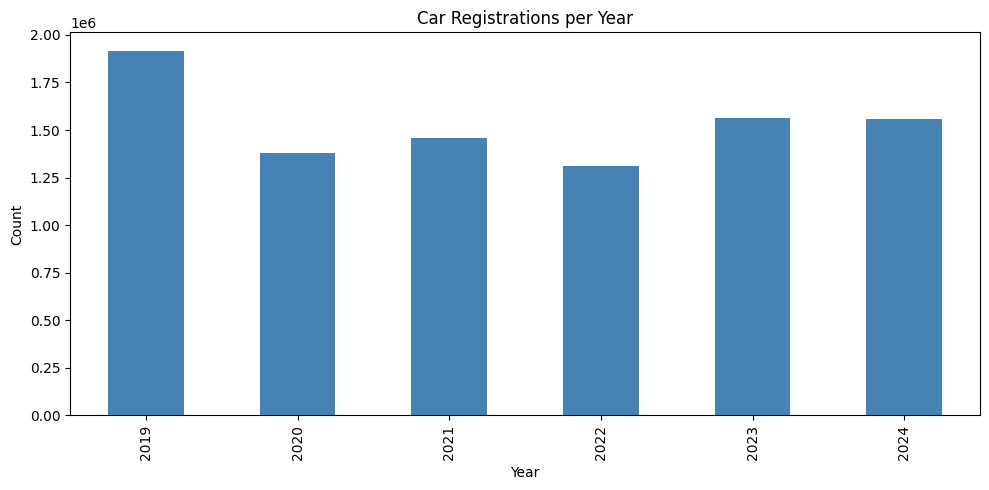

In [ ]:

# 6a. Registrations per year
fig, ax = plt.subplots(figsize=(10, 5))
df_cars["year"].value_counts().sort_index().plot(kind="bar", ax=ax, color="steelblue")
ax.set_title("Car Registrations per Year")
ax.set_xlabel("Year")
ax.set_ylabel("Count")
plt.tight_layout()
plt.show()


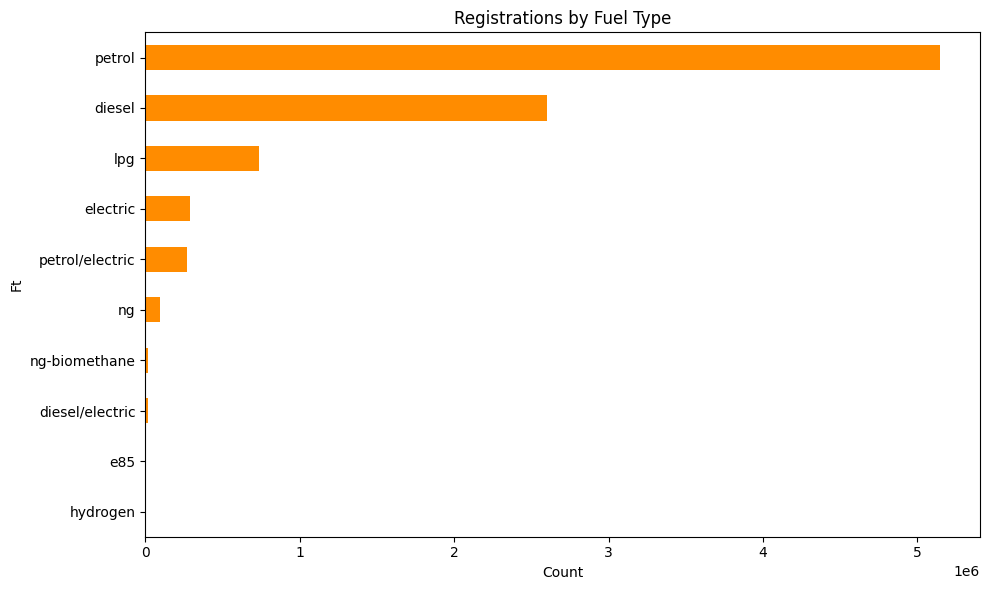

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
df_cars["Ft"].value_counts().plot(kind="barh", ax=ax, color="darkorange")
ax.set_title("Registrations by Fuel Type")
ax.set_xlabel("Count")
ax.invert_yaxis()
plt.tight_layout()
plt.show()



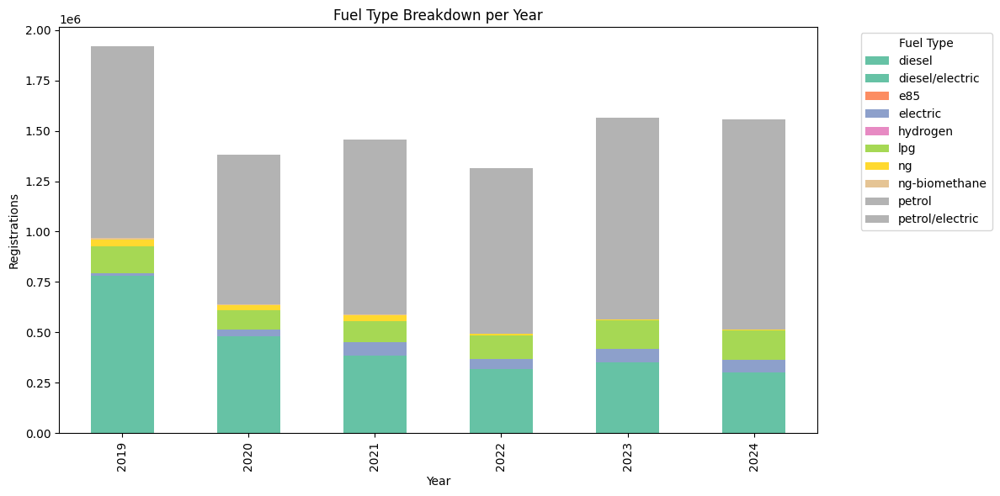

In [ ]:
fuel_year = df_cars.groupby(["year", "Ft"]).size().unstack(fill_value=0)
fig, ax = plt.subplots(figsize=(12, 6))
fuel_year.plot(kind="bar", stacked=True, ax=ax, colormap="Set2")
ax.set_title("Fuel Type Breakdown per Year")
ax.set_xlabel("Year")
ax.set_ylabel("Registrations")
ax.legend(title="Fuel Type", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


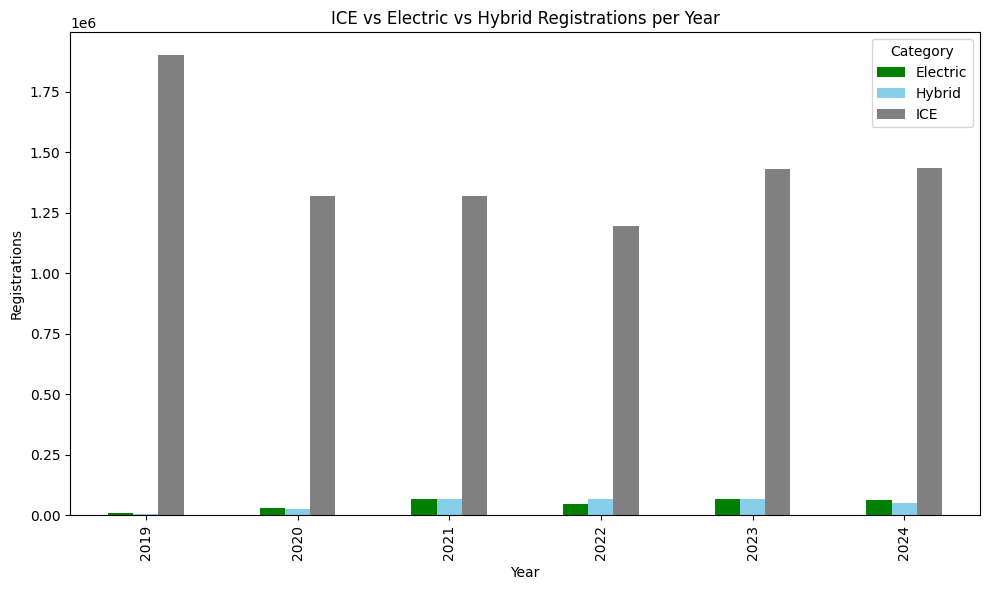

In [ ]:
def classify_fuel(ft):
    ft = str(ft).lower()
    if ft == "electric":
        return "Electric"
    elif ft in ["petrol/electric", "diesel/electric"]:
        return "Hybrid"
    else:
        return "ICE"

df_cars["fuel_category"] = df_cars["Ft"].apply(classify_fuel)

cat_year = df_cars.groupby(["year", "fuel_category"]).size().unstack(fill_value=0)
fig, ax = plt.subplots(figsize=(10, 6))
cat_year.plot(kind="bar", ax=ax, color={"ICE": "gray", "Electric": "green", "Hybrid": "skyblue"})
ax.set_title("ICE vs Electric vs Hybrid Registrations per Year")
ax.set_xlabel("Year")
ax.set_ylabel("Registrations")
ax.legend(title="Category")
plt.tight_layout()
plt.show()


In [ ]:
print("\n" + "=" * 60)
print("9. DATA QUALITY SUMMARY")
print("=" * 60)
print(f"  Total rows: {len(df_cars):,}")
print(f"  Columns: {df_cars.shape[1]}")
print(f"  Columns with nulls: {(df_cars.isna().sum() > 0).sum()}")
print(f"  Exact duplicates: {df_cars.duplicated().sum()}")
print(f"  Unique fuel types: {df_cars['Ft'].nunique()}")
print(f"  Year range: {df_cars['year'].min()} - {df_cars['year'].max()}")
print(f"  ICE: {(df_cars['fuel_category'] == 'ICE').sum():,}")
print(f"  Electric: {(df_cars['fuel_category'] == 'Electric').sum():,}")
print(f"  Hybrid: {(df_cars['fuel_category'] == 'Hybrid').sum():,}")


9. DATA QUALITY SUMMARY
  Total rows: 9,186,905
  Columns: 5
  Columns with nulls: 1
  Exact duplicates: 0
  Unique fuel types: 10
  Year range: 2019 - 2024
  ICE: 8,607,283
  Electric: 291,279
  Hybrid: 288,343


### 6.2 Cars Data Cleaning

**Cleaning strategy:** We drop engine power and ID columns, filter to 2021–2024, remove rows with missing registration dates, and classify fuel types into five categories: Benzine (petrol), Diesel, Hybrid, Electric, and Other (LPG/CNG).

In [ ]:
print("Missing 'Date of registration' by year:")
print(df_cars.groupby("year")["Date of registration"].apply(lambda x: x.isna().sum()))

print("\nMissing % by year:")
print(df_cars.groupby("year")["Date of registration"].apply(lambda x: (x.isna().sum() / len(x) * 100).round(2)))

Missing 'Date of registration' by year:
year
2019    1917399
2020    1380839
2021          2
2022          0
2023          0
2024          0
Name: Date of registration, dtype: int64

Missing % by year:
year
2019    100.0
2020    100.0
2021      0.0
2022      0.0
2023      0.0
2024      0.0
Name: Date of registration, dtype: float64


In [ ]:
# Drop 'ep (KW)' — engine power not directly relevant to air quality analysis
# Fuel type and car count trends are more meaningful for emission impact
df_cars = df_cars.drop(columns=["ep (KW)"])

print(f"Remaining columns: {df_cars.columns.tolist()}")

Remaining columns: ['ID', 'Ft', 'year', 'Date of registration']


In [ ]:
# Drop 'ID' — identifier column, not needed for analysis
df_cars = df_cars.drop(columns=["ID"])

print(f"Remaining columns: {df_cars.columns.tolist()}")

Remaining columns: ['Ft', 'year', 'Date of registration']


In [ ]:
# Group fuel types into 5 categories for cleaner analysis
# First standardize to lowercase
df_cars["Ft"] = df_cars["Ft"].str.lower().str.strip()

def classify_fuel(ft):
    ft = str(ft)
    if ft in ["petrol"]:
        return "Benzine"
    elif ft in ["diesel"]:
        return "Diesel"
    elif ft in ["petrol/electric", "diesel/electric"]:
        return "Hybrid"
    elif ft in ["electric"]:
        return "Electric"
    else:
        # lpg, ng, ng-biomethane, hydrogen, e85, etc.
        return "Others"

df_cars["fuel_category"] = df_cars["Ft"].apply(classify_fuel)

print("Fuel category breakdown:")
print(df_cars["fuel_category"].value_counts())
print(f"\n'Others' includes:")
others = df_cars[df_cars["fuel_category"] == "Others"]["Ft"].value_counts()
print(others)

Fuel category breakdown:
fuel_category
Benzine     5147434
Diesel      2603856
Others       855993
Electric     291279
Hybrid       288343
Name: count, dtype: int64

'Others' includes:
Ft
lpg              740108
ng                98779
ng-biomethane     16634
e85                 429
hydrogen             43
Name: count, dtype: int64


In [ ]:
# Remove years 2019 and 2020 — outside our analysis window (2021-2024)
before = len(df_cars)
df_cars = df_cars[df_cars["year"].between(2021, 2024)].copy()

print(f"Before: {before:,} rows")
print(f"After: {len(df_cars):,} rows")
print(f"Years: {sorted(df_cars['year'].unique())}")

Before: 9,186,905 rows
After: 5,888,667 rows
Years: [np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024)]


In [ ]:
# Drop rows where 'Date of registration' is missing
before = len(df_cars)
df_cars = df_cars.dropna(subset=["Date of registration"])

print(f"Before: {before:,} rows")
print(f"After: {len(df_cars):,} rows")
print(f"Dropped: {before - len(df_cars):,} rows")

Before: 5,888,667 rows
After: 5,888,665 rows
Dropped: 2 rows


In [ ]:
df_cars.to_csv("df_cars_cleaned_date.csv", index=False)

---
## 7. Energy Consumption Data

# Loading **Consumption** datasets and merging them into one csv file







In [89]:
def load_end_merge_excel( files ):
  dfs = [pd.read_excel(f) for f in files]
  df = pd.concat(dfs, ignore_index = True)
  return df

In [90]:
%%capture
files = ["data_petra/Export-DownloadCenterFile-20260311-234217.xlsx",
         "data_petra/Export-DownloadCenterFile-20260311-234227.xlsx",
         "data_petra/Export-DownloadCenterFile-20260311-234252.xlsx",
         "data_petra/Export-DownloadCenterFile-20260311-234258.xlsx",
         "data_petra/Export-DownloadCenterFile-20260311-234305.xlsx",
         "data_petra/Export-DownloadCenterFile-20260311-234315.xlsx"]

df = load_end_merge_excel(files)


### Checking shape and head

In this step, we are going to check the data inside our csv file to gain some insights.

In [91]:
print(f"Data Shape: {df.shape}")
df["Date"] = pd.to_datetime(df["Date"], errors="coerce")
print(f"Data Range: {df['Date'].min()} to {df['Date'].max()}")
print(f"Memory Usage: {df.memory_usage().sum()/1e6:.2f}MB")
print(df.columns.tolist())

Data Shape: (1453829, 4)
Data Range: 2021-01-01 00:00:00 to 2026-03-10 23:45:00
Memory Usage: 46.52MB
['Date', 'Total Load [MW]', 'Forecast Total Load [MW]', 'Bidding Zone']


## Creating new csv file that contains daily consumption


The available database measures total load and forecast Total Load each 15 minutes. We are now creating new database that is going to contain same informations on daily basis.

In [92]:
df.columns  = df.columns.str.strip()
df["Bidding Zone"] = df["Bidding Zone"].astype(str).str.strip()


DailyConsumption = (df.groupby([
    pd.Grouper(key = "Date", freq = "D"), "Bidding Zone"])
    [["Total Load [MW]","Forecast Total Load [MW]"]].mean().reset_index())


## Descriptive overview of Consumption Dataset


In [93]:
DailyConsumption.describe(include = "all")

,Date,Bidding Zone,Total Load [MW],Forecast Total Load [MW]
count,15144,15144,15144.000000,15144.000000
unique,NaN,8,NaN,NaN
top,NaN,Calabria,NaN,NaN
freq,NaN,1893,NaN,NaN
mean,2023-08-05 01:22:09.318542080,NaN,8932.607433,8979.840883
min,2021-01-01 00:00:00,NaN,299.911594,296.230042
25%,2022-04-19 00:00:00,NaN,1506.394359,1500.229448
50%,2023-08-05 00:00:00,NaN,2840.720849,2862.258589
75%,2024-11-20 00:00:00,NaN,9216.453273,9351.040513
max,2026-03-10 00:00:00,NaN,49212.000042,49810.812667


Our dataset contains 15144 values of electricity load, measured in MW. We have 8 different `Bidding Zones` starting from 1<sup>st</sup> January 2021 to 10<sup>th</sup>January 2026.

### Creating wider table with dates as rows and regional consumptions of electricity as columns

By doing this we are gaining clearer view of our data.

In [94]:
DailyConsumption_Wide = DailyConsumption.pivot(index = "Date", columns = "Bidding Zone", values = ["Total Load [MW]", "Forecast Total Load [MW]"]).reset_index()
DailyConsumption.to_csv("DailyConsumption.csv", index = False)
DailyConsumption_Wide.to_csv("DailyConsumption_Wide.csv", index = False)

DailyConsumption_Wide.columns.name = None
print(DailyConsumption_Wide.head())


                   Date Total Load [MW]                            \
Bidding Zone                   Calabria Centre-North Centre-South   
0            2021-01-01      592.586505  2353.797260  4779.609458   
1            2021-01-02      626.306281  2478.478625  5197.343031   
2            2021-01-03      627.480115  2342.853312  5065.761927   
3            2021-01-04      733.124813  2969.801635  6072.452698   
4            2021-01-05      722.009979  3163.967812  6471.392354   

                                                                    \
Bidding Zone         Italy         North     Sardinia       Sicily   
0             25509.468729  12720.334229  1008.967958  1957.947396   
1             27544.197896  13923.800177  1045.211010  2100.798208   
2             26613.031198  13400.244250  1036.130698  2041.380677   
3             33755.541667  17876.990146  1109.121469  2263.508875   
4             35059.562646  18798.909760  1129.786948  2118.167458   

                         

## Checking for missing values if any

Before plotting, we would like to know if we are missing any consumption data. Moreover, if so, we would like to locate it and see what is the best way to overcome that issue.

In [95]:
DailyConsumption_Wide["Date"] = pd.to_datetime(DailyConsumption_Wide["Date"])

full_dates = pd.date_range(
    start = DailyConsumption_Wide["Date"].min(),
    end = DailyConsumption_Wide["Date"].max(),
    freq = "D"
)

missing_dates = full_dates[~full_dates.isin(DailyConsumption_Wide["Date"])]
print(missing_dates)
print(DailyConsumption_Wide.isna().sum())

DatetimeIndex(['2026-01-14', '2026-01-15'], dtype='datetime64[ns]', freq='D')
                          Bidding Zone
Date                                      0
Total Load [MW]           Calabria        0
                          Centre-North    0
                          Centre-South    0
                          Italy           0
                          North           0
                          Sardinia        0
                          Sicily          0
                          South           0
Forecast Total Load [MW]  Calabria        0
                          Centre-North    0
                          Centre-South    0
                          Italy           0
                          North           0
                          Sardinia        0
                          Sicily          0
                          South           0
dtype: int64


Based on this results, we can conclude that there are two days missing (14th and 15th January 2026). Furthermore, there are no missing values for any other day present in any of regions. Since they represent &lt;0.1% of the data, we apply *linear interpolation* to preserve continuity.







In [96]:
DailyConsumption_Wide = DailyConsumption_Wide.set_index("Date").interpolate().reset_index()

---
## Checking for Duplicates

One more step before we proceed with plotting our data. We don't expect any duplicates, but better to be safe than sorry.

In [97]:
print("Duplicate dates:", DailyConsumption_Wide["Date"].duplicated().sum())

Duplicate dates: 0


## Forecast Accuracy Analysis


In [98]:
DailyConsumption["Forecast_Error"] = DailyConsumption["Forecast Total Load [MW]"] - DailyConsumption["Total Load [MW]"]
DailyConsumption["Abs_Percent_Error"] = abs(DailyConsumption["Forecast_Error"] / DailyConsumption["Total Load [MW]"]) * 100

error_stats = DailyConsumption.groupby("Bidding Zone")["Abs_Percent_Error"].mean().sort_values()
print(error_stats)


Bidding Zone
South           1.222272
North           1.223487
Italy           1.225324
Sardinia        1.225694
Sicily          1.226708
Calabria        1.227102
Centre-North    1.230617
Centre-South    1.230912
Name: Abs_Percent_Error, dtype: float64


From the results calculated above, we can see that the prediction error remains almost the same between regions. It's averaging 1.22 - 1.23% overall, which suggests that the forecasted electricity load is solidly accurate with only small deviations from the observed values.

## Plotting Consumption data


---

We are going to make 2 plots – one with each region's consumption and one for the whole Italy.


---
### Regional Consumption


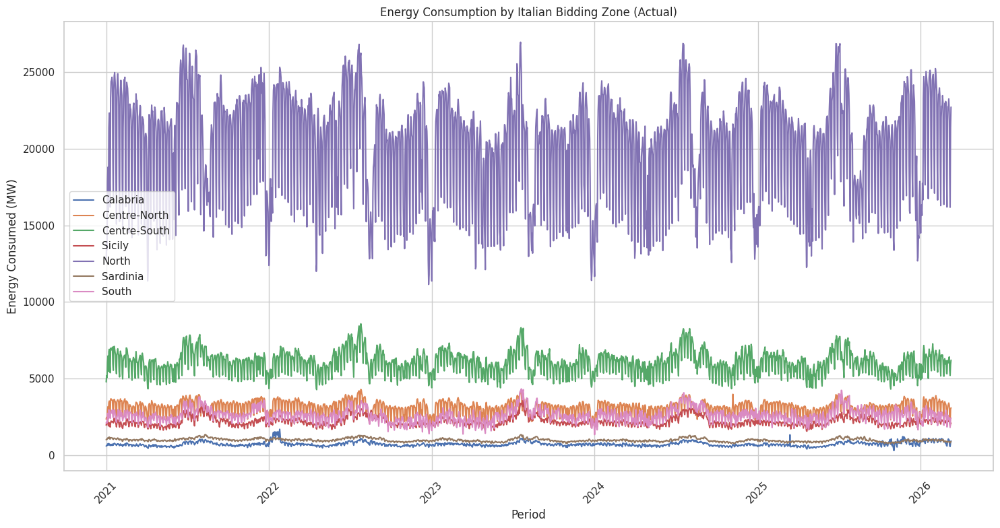

In [99]:
plt.figure(figsize=(15, 8))
regions = [
    "Calabria",
    "Centre-North",
    "Centre-South",
    "Sicily",
    "North",
    "Sardinia",
    "South"
]

for region in regions:
  plt.plot(DailyConsumption_Wide["Date"],
           DailyConsumption_Wide["Total Load [MW]", region], label=region)

plt.xlabel("Period")
plt.ylabel("Energy Consumed (MW)")
plt.title("Energy Consumption by Italian Bidding Zone (Actual)")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("images/Energy_Consumption_by_Zones.png")
plt.show()

This graph illustrates the electricity consumption by each region. `North` region shows constantly biggest consumption of electricity, whereas, region `Calabria` remains (almost) constantly the lowest consumption region.


---
### Italy's Consumption




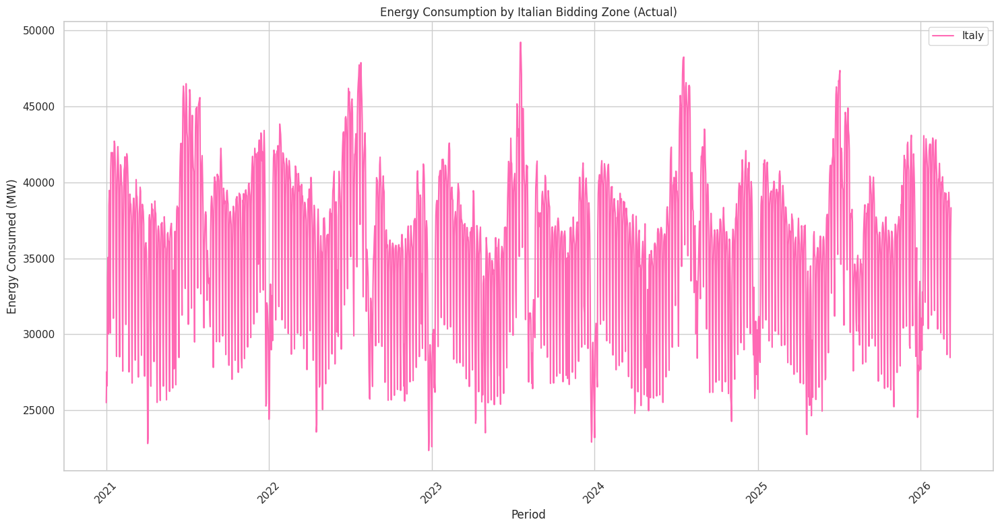

In [100]:
plt.figure(figsize=(15, 8))

plt.plot(DailyConsumption_Wide["Date"], DailyConsumption_Wide[("Total Load [MW]", "Italy")], label="Italy", color = "#FF69B4")

plt.xlabel("Period")
plt.ylabel("Energy Consumed (MW)")
plt.title("Energy Consumption by Italian Bidding Zone (Actual)")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("images/Energy_Consumption_Italy.png")
plt.show()

This graph shows the daily electricity consumption in Italy. Overall, demand fluctuates significantly. However it follows clear seasonal trend, that includes:
- peaks close to 49000 MW;
- lows around 23000 - 26000 MW.

Aside short-term variations, the general level seems to be stable over time.

---
# Loading **Energy Production** datasets and merging them


---
## 8. Energy Production Data

Energy production data covers the **Lazio region** from 2021–2025, sourced from the ENTSO-E Transparency Platform. It includes daily generation by source: Thermal, Hydro, Photovoltaic, Wind, Geothermal, and Self-consumption. The 2025 data required special handling due to higher-frequency observations.

In [101]:
%%capture
files = [ "data_petra/Export-DownloadCenterFile-20260312-012228.xlsx",  #2024
          "data_petra/Export-DownloadCenterFile-20260312-012232.xlsx",  #2023
          "data_petra/Export-DownloadCenterFile-20260312-012235.xlsx",  #2022
          "data_petra/Export-DownloadCenterFile-20260312-012253.xlsx"]

df_21_24 = load_end_merge_excel(files)

In [102]:
print(f"Data Shape: {df_21_24.shape}")
df_21_24["Date"] = pd.to_datetime(df_21_24["Date"], errors="coerce")
print(f"Data Range: {df_21_24['Date'].min()} to {df_21_24['Date'].max()}")
print(f"Memory Usage: {df_21_24.memory_usage().sum()/1e6:.2f}MB")
print(df_21_24.columns.tolist())

Data Shape: (210388, 3)
Data Range: 2021-01-01 00:00:00 to 2024-12-31 23:00:00
Memory Usage: 5.05MB
['Date', 'Actual Generation', 'Primary Source']


In [103]:
print(df_21_24.groupby(df_21_24["Date"].dt.year).size())

Date
2021.0    52560
2022.0    52560
2023.0    52560
2024.0    52704
dtype: int64


In [104]:
%%capture
print(df_21_24.head(20))

In [105]:
df_2025 = pd.read_excel("data_petra/Export-DownloadCenterFile-20260312-012738.xlsx")


/usr/local/lib/python3.12/dist-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


In [106]:
df_2025["Date"] = pd.to_datetime(df_2025["Date"], errors = "coerce")
print(df_2025.groupby(df_2025["Date"].dt.year).size())

Date
2025.0    210204
dtype: int64


from here, we can easily spot the significant difference between numbers of observations from 2021 and 2025.

In [107]:
%%capture
print(df_2025.head(20))
print(df_2025.shape)

In [108]:
df_2025 = df_2025[~df_2025["Date"].astype(str).str.contains("Applied filters", na=False)].copy()
df_2025["Date"] = pd.to_datetime(df_2025["Date"], errors="coerce")
df_2025 = df_2025.dropna(subset=["Date", "Primary Source", "Actual Generation"])

In [109]:
print(df_2025.shape)
print(df_2025["Date"].min(), df_2025["Date"].max())
print(df_2025["Primary Source"].unique())

(210204, 3)
2025-01-01 00:00:00 2025-12-31 23:45:00
['Thermal' 'Wind' 'Geothermal' 'Photovoltaic' 'Self-consumption' 'Hydro']


In [110]:
df_2025["day"] = df_2025["Date"].dt.date

freq_check = df_2025.groupby(["day", "Primary Source"]).size()
print(freq_check.describe())

count    2190.000000
mean       95.983562
std         0.233558
min        92.000000
25%        96.000000
50%        96.000000
75%        96.000000
max        96.000000
dtype: float64


In [111]:
df_2025_hourly = (
    df_2025
    .set_index("Date")
    .groupby("Primary Source")["Actual Generation"]
    .resample("H")
    .mean()
    .reset_index()
)

/tmp/ipykernel_371/2957223725.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  .resample("H")


In [112]:
df_2025_hourly["day"] = df_2025_hourly["Date"].dt.date

print(
    df_2025_hourly.groupby(["day","Primary Source"]).size().describe()
)

count    2190.0
mean       24.0
std         0.0
min        24.0
25%        24.0
50%        24.0
75%        24.0
max        24.0
dtype: float64


In [113]:
df = pd.concat([df_21_24, df_2025_hourly], ignore_index=True)

In [114]:
print(df.groupby(df["Date"].dt.year).size())

Date
2021.0    52560
2022.0    52560
2023.0    52560
2024.0    52704
2025.0    52560
dtype: int64


In [115]:
df = df[~df["Date"].astype(str).str.contains("Applied filters", na=False)].copy()
df["Date"] = pd.to_datetime(df["Date"], dayfirst=True)

DailyEnergyProduction = (
    df.assign(Day=df["Date"].dt.floor("D"))
      .groupby(["Day", "Primary Source"], as_index=False)["Actual Generation"]
      .sum()
)

print(DailyEnergyProduction["Day"].min())
print(DailyEnergyProduction["Day"].max())

2021-01-01 00:00:00
2025-12-31 00:00:00


## Finding unique sources

In this part, we are going to find our key primary sources of electrical energy generators.  

In [116]:
print((DailyEnergyProduction["Primary Source"]).unique())

['Geothermal' 'Hydro' 'Photovoltaic' 'Self-consumption' 'Thermal' 'Wind']


In [117]:
DailyEnergyProduction.describe(include = "all")

,Day,Primary Source,Actual Generation
count,10956,10956,10956.000000
unique,NaN,6,NaN
top,NaN,Geothermal,NaN
freq,NaN,1826,NaN
mean,2023-07-02 12:00:00,NaN,122.357509
min,2021-01-01 00:00:00,NaN,3.470000
25%,2022-04-02 00:00:00,NaN,33.675000
50%,2023-07-02 12:00:00,NaN,81.175000
75%,2024-10-01 00:00:00,NaN,128.172500
max,2025-12-31 00:00:00,NaN,760.180000


We have 10956 observations and 6 different sources of energy production. Our data set covers the period from 1<sup>st</sup> January 2021 to 31<sup>st</sup> December 2025.



Since the data above covers the Lazio Region, in order to see how much of the consumed energy came from the previously mentioned sources, we are going to extract data from 'TotalDailyLoad' about 'Centre-South' region.


In [118]:
energy_plt = DailyEnergyProduction.pivot(
    index="Day",
    columns="Primary Source",
    values="Actual Generation"
).reset_index()
energy_plt["Total"] = energy_plt[["Geothermal", "Hydro", "Photovoltaic", "Self-consumption", "Thermal", "Wind"]].sum(axis = 1)
energy_plt["Media"] = energy_plt[["Geothermal", "Hydro", "Photovoltaic", "Self-consumption", "Thermal", "Wind"]].mean(axis = 1)


## Wide perspective


In [119]:
energy_wide = DailyEnergyProduction.pivot(index = "Day", columns = "Primary Source", values = "Actual Generation").reset_index()
energy_wide.columns.name = None
energy_wide = energy_wide.sort_values("Day").reset_index(drop = True)

energy_wide.head()

,Day,Geothermal,Hydro,Photovoltaic,Self-consumption,Thermal,Wind
0,2021-01-01,14.51,89.63,16.05,50.382,330.61,72.98
1,2021-01-02,14.85,104.73,12.13,50.145,321.78,108.78
2,2021-01-03,14.88,95.89,17.11,52.486,324.12,77.58
3,2021-01-04,14.88,137.40,20.19,71.885,467.70,43.23
4,2021-01-05,14.87,137.50,14.65,72.799,496.41,79.59


## Checking for missing values

In [120]:
energy_wide["Day"] = pd.to_datetime(energy_wide["Day"])

full_dates = pd.date_range(
    start = energy_wide["Day"].min(),
    end = energy_wide["Day"].max(),
    freq = "D"
)

missing_dates = full_dates[~full_dates.isin(energy_wide["Day"])]
print(missing_dates)
print(energy_wide.isna().sum())

DatetimeIndex([], dtype='datetime64[ns]', freq='D')
Day                 0
Geothermal          0
Hydro               0
Photovoltaic        0
Self-consumption    0
Thermal             0
Wind                0
dtype: int64


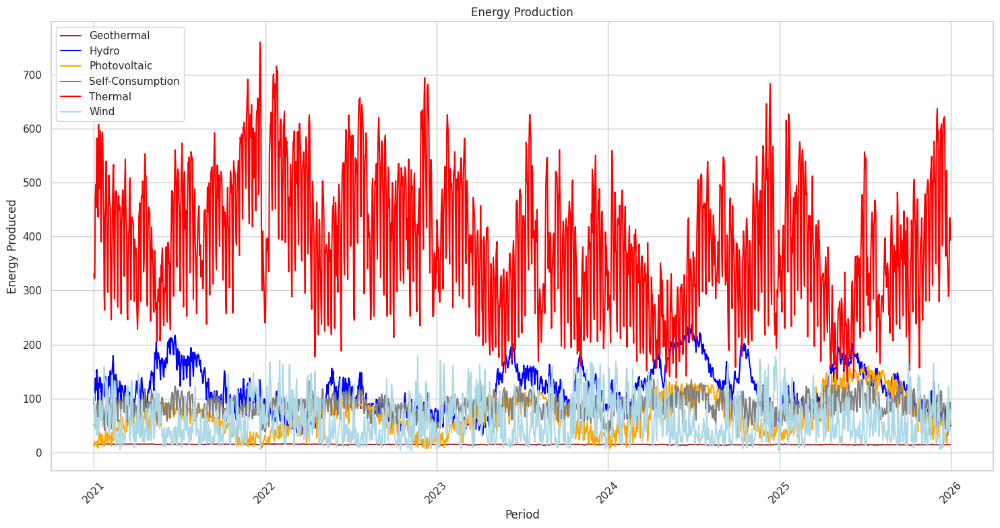

In [121]:
plt.figure(figsize = (15, 8))

plt.plot(energy_plt["Day"], energy_plt["Geothermal"], color = "brown", label = "Geothermal")
plt.plot(energy_plt["Day"], energy_plt["Hydro"], color = "blue", label = "Hydro")
plt.plot(energy_plt["Day"], energy_plt["Photovoltaic"], color = "orange", label = "Photovoltaic")
plt.plot(energy_plt["Day"], energy_plt["Self-consumption"], color = "grey", label = "Self-Consumption")
plt.plot(energy_plt["Day"], energy_plt["Thermal"], color = "red", label = "Thermal")
plt.plot(energy_plt["Day"], energy_plt["Wind"], color = "lightblue", label = "Wind")


plt.xlabel("Period")
plt.ylabel("Energy Produced")
plt.title("Energy Production")
plt.legend()
plt.xticks(rotation = 45)
plt.tight_layout()
plt.savefig("images/Energy_Production.png")
plt.show()

### Pie-Chart approach (yearly)



---
In this section, we are broathening our visual representations.




In [122]:
yearly_production = (DailyEnergyProduction.assign(
    Year = DailyEnergyProduction["Day"].dt.year).groupby(
        ["Year", "Primary Source"])["Actual Generation"].mean().reset_index())

yearly_pivot = yearly_production.pivot( index = "Year", columns = "Primary Source", values = "Actual Generation")

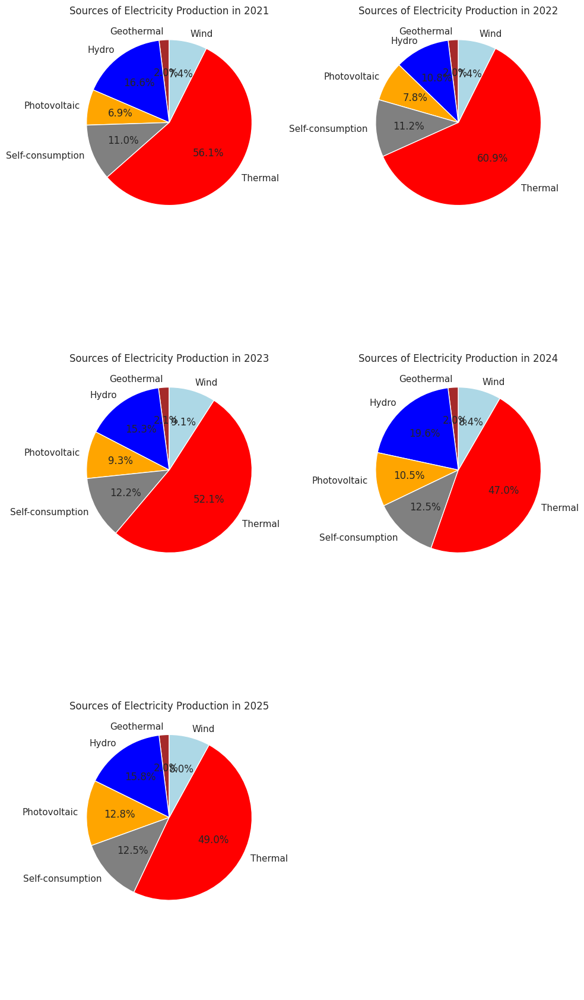

In [123]:
colors = {
    "Thermal" : "red",
    "Hydro" : "blue",
    "Wind" : "lightblue",
    "Photovoltaic" : "orange",
    "Geothermal" : "brown",
    "Self-consumption" : "grey"
}
years = yearly_pivot.index.tolist()
n = len(years)
fig, axes = plt.subplots(nrows=(n+1)//2, ncols=2, figsize=(10, 6*((n+1)//2)))
axes = axes.flatten()

for i, year in enumerate(years):
  values = yearly_pivot.loc[year]
  axes[i].pie(
      values, labels = values.index, autopct = "%1.1f%%", colors = [colors[i] for i in values.index],
      startangle = 90)
  axes[i].set_title(f"Sources of Electricity Production in {year}")

for j in range(i+1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()





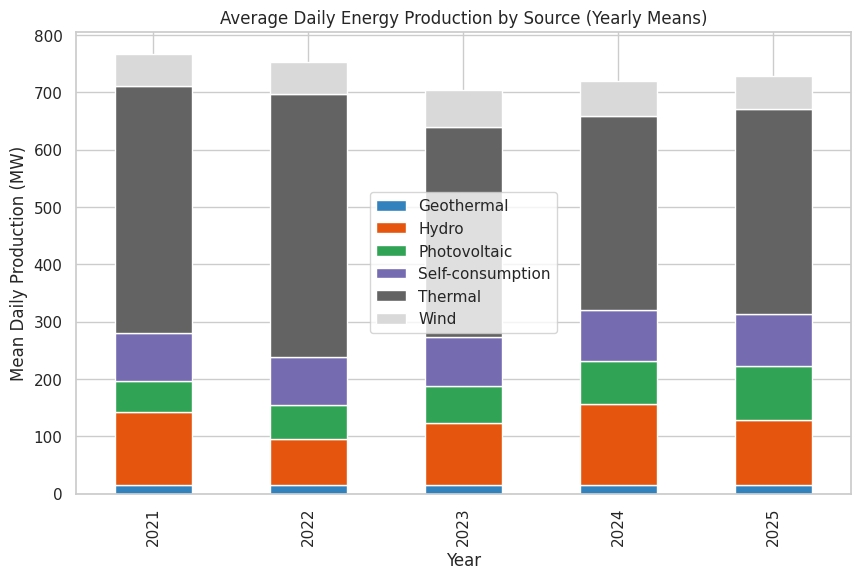

In [124]:
yearly_source_avg = (energy_wide
    .assign(Year=energy_wide["Day"].dt.year)
    .groupby("Year")[["Geothermal", "Hydro", "Photovoltaic",
                      "Self-consumption", "Thermal", "Wind"]]
    .mean()
)
yearly_source_avg.plot(kind="bar", stacked=True, figsize=(10, 6), colormap="tab20c")
plt.title("Average Daily Energy Production by Source (Yearly Means)")
plt.ylabel("Mean Daily Production (MW)")
plt.savefig("images/Average_Daily_Production_by_Source")
plt.show()


## Correlation between sources

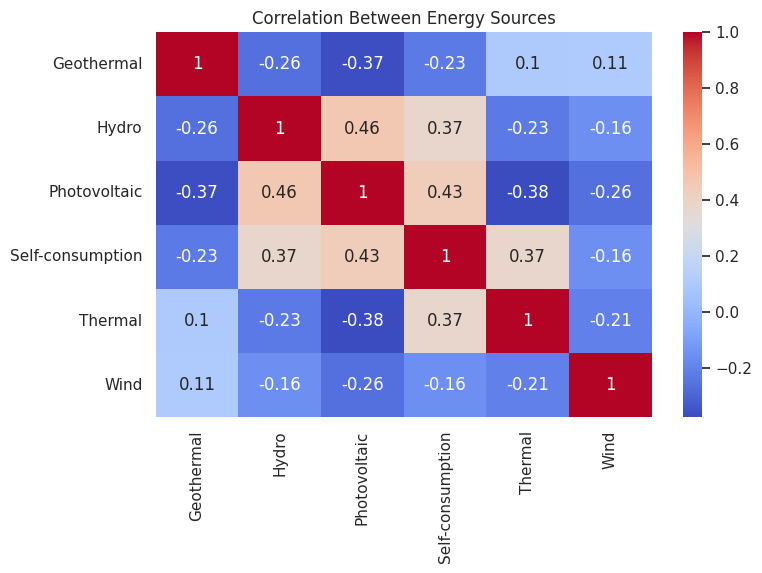

In [125]:
corr = energy_wide[["Geothermal", "Hydro", "Photovoltaic",
                    "Self-consumption", "Thermal", "Wind"]].corr()

sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.title("Correlation Between Energy Sources")
plt.show()


---
## 10. Pollution Aggregation (Daily / Weekly / Monthly / Yearly)

We aggregate the merged hourly pollution data into multiple temporal resolutions — **daily**, **weekly**, **monthly**, and **yearly** averages — for trend analysis and correlation with energy and vehicle datasets that are available at coarser granularity.

In [ ]:
# Create daily dataset: each row = one day, each pollutant = one column with daily mean value
df_merged["Start"] = pd.to_datetime(df_merged["Start"])
df_merged["Date"] = df_merged["Start"].dt.date

# Pivot: rows = Date, columns = Pollutant name, values = daily mean
daily_pollution = df_merged.groupby(["Date", "Pollutant"])["Value"].mean().reset_index()
daily_pollution = daily_pollution.pivot(index="Date", columns="Pollutant", values="Value").reset_index()
daily_pollution.columns.name = None

print(f"Shape: {daily_pollution.shape}")
daily_pollution.head()

Shape: (1461, 12)


,Date,C6H5-C2H5,C6H5-CH3,C6H6,CO,NO,NO2,NOX as NO2,O3,SO2,"m,p-C6H4(CH3)2",o-C6H4-(CH3)2
0,2021-01-01,0.138330,0.618120,0.776176,0.477877,7.245054,21.506556,30.031268,36.524583,1.664405,0.431304,0.140326
1,2021-01-02,0.282417,0.785778,0.565700,0.343035,9.069485,22.796224,31.942065,54.308934,NaN,0.706631,0.298313
2,2021-01-03,0.178403,0.509055,0.450118,0.352923,6.520143,23.687135,29.702084,41.920842,NaN,0.334104,0.186090
3,2021-01-04,0.477731,2.106506,0.970795,0.501048,21.816645,45.073931,73.114447,28.807264,NaN,1.586115,0.694697
4,2021-01-05,0.398373,1.388518,0.807650,0.460127,20.865971,41.989214,66.933897,33.395765,NaN,1.047824,0.536811


In [ ]:
# Create weekly average from daily pollution data
daily_pollution["Date"] = pd.to_datetime(daily_pollution["Date"])

weekly_pollution = daily_pollution.set_index("Date").resample("W").mean().reset_index()

print(f"Shape: {weekly_pollution.shape}")
weekly_pollution.head()

Shape: (210, 12)


,Date,C6H5-C2H5,C6H5-CH3,C6H6,CO,NO,NO2,NOX as NO2,O3,SO2,"m,p-C6H4(CH3)2",o-C6H4-(CH3)2
0,2021-01-03,0.199717,0.637651,0.597331,0.391278,7.611561,22.663305,30.558472,44.251453,1.664405,0.490680,0.208243
1,2021-01-10,0.420861,1.490267,0.848497,0.504599,22.976701,40.170569,71.510939,21.874897,1.478168,1.087037,0.581126
2,2021-01-17,0.546596,2.450235,1.263401,0.600879,40.413382,42.030480,101.280612,18.811428,1.861567,1.672257,0.837936
3,2021-01-24,0.396127,1.976635,0.959540,0.612247,35.190581,41.087022,90.529920,34.555766,2.243094,1.418752,0.563594
4,2021-01-31,0.315452,2.903247,1.165614,0.642990,40.231887,47.110116,103.661253,25.078016,2.062485,1.397992,0.832741


In [ ]:
# Create week-year label like 1-2021, 2-2021, etc.
weekly_pollution["Week"] = weekly_pollution["Date"].dt.isocalendar().week.astype(int)
weekly_pollution["Year"] = weekly_pollution["Date"].dt.year
weekly_pollution["Week_Label"] = weekly_pollution["Week"].astype(str) + "-" + weekly_pollution["Year"].astype(str)

# Move Week_Label to front, drop Date
weekly_pollution = weekly_pollution[["Week_Label"] + [c for c in weekly_pollution.columns if c not in ["Week_Label", "Date", "Week", "Year"]]]

print(f"Shape: {weekly_pollution.shape}")


KeyError: 'Date'

In [ ]:
# Set Week_Label as the index
weekly_pollution = weekly_pollution.set_index("Week_Label")

weekly_pollution.head()

,C6H5-C2H5,C6H5-CH3,C6H6,CO,NO,NO2,NOX as NO2,O3,SO2,"m,p-C6H4(CH3)2",o-C6H4-(CH3)2
Week_Label,,,,,,,,,,,
53-2021,0.199717,0.637651,0.597331,0.391278,7.611561,22.663305,30.558472,44.251453,1.664405,0.490680,0.208243
1-2021,0.420861,1.490267,0.848497,0.504599,22.976701,40.170569,71.510939,21.874897,1.478168,1.087037,0.581126
2-2021,0.546596,2.450235,1.263401,0.600879,40.413382,42.030480,101.280612,18.811428,1.861567,1.672257,0.837936
3-2021,0.396127,1.976635,0.959540,0.612247,35.190581,41.087022,90.529920,34.555766,2.243094,1.418752,0.563594
4-2021,0.315452,2.903247,1.165614,0.642990,40.231887,47.110116,103.661253,25.078016,2.062485,1.397992,0.832741


In [ ]:
# Monthly average
daily_pollution["Date"] = pd.to_datetime(daily_pollution["Date"])

monthly_pollution = daily_pollution.set_index("Date").resample("M").mean()
monthly_pollution.index = monthly_pollution.index.strftime("%m-%Y")
monthly_pollution.index.name = "Month"

print("Monthly:")
print(f"Shape: {monthly_pollution.shape}")
monthly_pollution.head()



Monthly:
Shape: (48, 11)


/tmp/ipykernel_16496/4106359579.py:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_pollution = daily_pollution.set_index("Date").resample("M").mean()


,C6H5-C2H5,C6H5-CH3,C6H6,CO,NO,NO2,NOX as NO2,O3,SO2,"m,p-C6H4(CH3)2",o-C6H4-(CH3)2
Month,,,,,,,,,,,
01-2021,0.398465,2.053408,1.014560,0.570930,32.081372,40.670233,85.824338,26.935326,1.979072,1.306591,0.655887
02-2021,0.340719,2.733323,1.201029,0.656324,28.365365,44.245933,84.047511,30.535141,1.769920,1.164190,0.675064
03-2021,0.285124,2.137003,0.876798,0.537578,15.226175,35.385109,55.006422,44.921863,1.749712,0.955434,0.426961
04-2021,0.388574,1.967681,0.762543,0.553656,12.222594,29.905397,45.397833,54.156991,1.407703,0.879546,0.455947
05-2021,0.489327,2.609158,0.908606,0.405484,10.030244,24.207022,36.668803,56.765372,1.542950,1.522186,0.607054


In [ ]:
# Yearly average
yearly_pollution = daily_pollution.set_index("Date").resample("Y").mean()
yearly_pollution.index = yearly_pollution.index.year
yearly_pollution.index.name = "Year"

print("\nYearly:")
print(f"Shape: {yearly_pollution.shape}")
yearly_pollution.head()


Yearly:
Shape: (4, 11)


/tmp/ipykernel_16496/2315735791.py:2: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly_pollution = daily_pollution.set_index("Date").resample("Y").mean()


,C6H5-C2H5,C6H5-CH3,C6H6,CO,NO,NO2,NOX as NO2,O3,SO2,"m,p-C6H4(CH3)2",o-C6H4-(CH3)2
Year,,,,,,,,,,,
2021,0.639768,3.518759,1.124097,0.531556,18.925831,33.024310,59.512402,42.799032,2.007082,2.103958,0.893194
2022,0.758463,4.776690,1.363796,0.571791,18.780164,33.231305,60.355725,45.971247,3.104746,2.849922,1.093333
2023,0.653337,3.884225,1.118360,0.673010,20.783733,31.736065,59.445835,43.662179,4.103394,3.019116,1.569673
2024,0.910123,4.218336,1.237966,0.928116,20.448750,30.920033,56.671996,43.182988,3.150131,3.363024,1.040145


In [ ]:
daily_pollution.to_csv("daily_pollution.csv", index=False)
weekly_pollution.to_csv("weekly_pollution.csv")
monthly_pollution.to_csv("monthly_pollution.csv")
yearly_pollution.to_csv("yearly_pollution.csv")
df_merged.to_csv("df_merged.csv", index=False)

---
## 11. Air Pollution vs. Energy Analysis


# Air Pollution vs Consumption
---



In [168]:
df_merged = pd.read_csv("df_merged.csv")

In [167]:
df_merged["Start"] = pd.to_datetime(df_merged["Start"], errors = "coerce")
df_merged["Value"] = pd.to_numeric(df_merged["Value"], errors = "coerce")
df_merged.loc[df_merged["Value"] < 0, "Value"] = np.nan
df_merged["Date"] = df_merged["Start"].dt.floor("D")


In [171]:
daily_pollution = (df_merged.groupby(["Date", "Pollutant"] )["Value"].mean().reset_index())

daily_pollution = daily_pollution.pivot(
    index = "Date", columns = "Pollutant",
    values = "Value").reset_index()
daily_pollution.columns.name = None

In [172]:
print(daily_pollution.head())
print(daily_pollution.columns.tolist())

         Date  C6H5-CH3      C6H6
0  2021-01-01  1.027607  1.052283
1  2021-01-02  1.160329  0.607892
2  2021-01-03  0.736045  0.547050
3  2021-01-04  3.290953  1.386719
4  2021-01-05  2.423045  1.149197
['Date', 'C6H5-CH3', 'C6H6']


## Selecting the Pollutants Available in the Dataset

In [173]:
pollutants = [c for c in ["C6H6", "C6H5-CH3"] if c in daily_pollution.columns]
print(pollutants)

['C6H6', 'C6H5-CH3']


## merging energy and pollution data



In [174]:
daily_pollution["Date"] = pd.to_datetime(daily_pollution["Date"], errors="coerce").dt.floor("D")

air_energy = pd.merge(
    energy_wide[["Day", "Thermal", "Hydro", "Wind", "Photovoltaic", "Total Production [MW]"]],
    daily_pollution,
    left_on="Day",
    right_on="Date",
    how="inner"
).drop(columns="Date")

In [175]:
print(air_energy.head())
print(air_energy.shape)
print(air_energy.isna().sum())
print(air_energy.columns.tolist())

         Day  Thermal   Hydro    Wind  Photovoltaic  Total Production [MW]  \
0 2021-01-01   330.61   89.63   72.98         16.05                574.162   
1 2021-01-02   321.78  104.73  108.78         12.13                612.415   
2 2021-01-03   324.12   95.89   77.58         17.11                582.066   
3 2021-01-04   467.70  137.40   43.23         20.19                755.285   
4 2021-01-05   496.41  137.50   79.59         14.65                815.819   

   C6H5-CH3      C6H6  
0  1.027607  1.052283  
1  1.160329  0.607892  
2  0.736045  0.547050  
3  3.290953  1.386719  
4  2.423045  1.149197  
(1461, 8)
Day                       0
Thermal                   0
Hydro                     0
Wind                      0
Photovoltaic              0
Total Production [MW]     0
C6H5-CH3                 62
C6H6                     33
dtype: int64
['Day', 'Thermal', 'Hydro', 'Wind', 'Photovoltaic', 'Total Production [MW]', 'C6H5-CH3', 'C6H6']


## Daily Pollution Trends

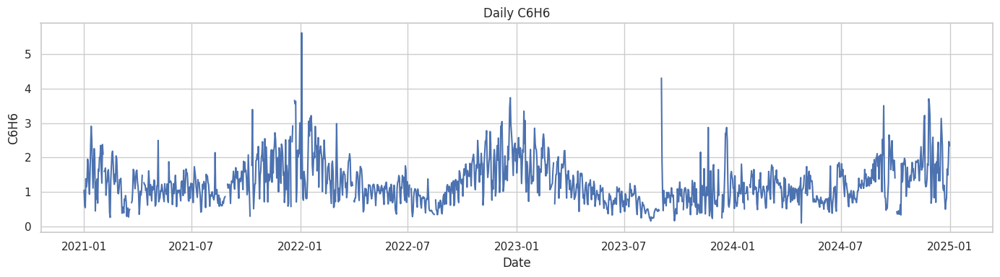

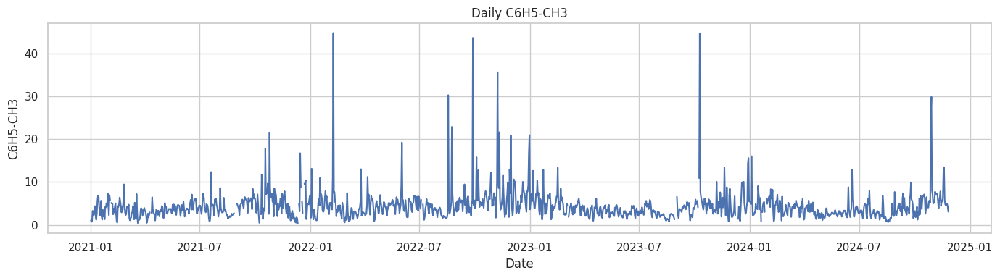

In [176]:
for poll in pollutants:
    plt.figure(figsize=(14, 4))
    plt.plot(air_energy["Day"], air_energy[poll])
    plt.title(f"Daily {poll}")
    plt.xlabel("Date")
    plt.ylabel(poll)
    plt.tight_layout()
    plt.show()

## Thermal Production Compared with Pollution

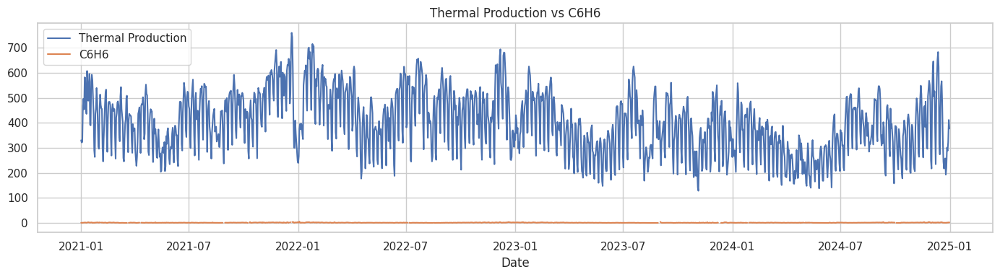

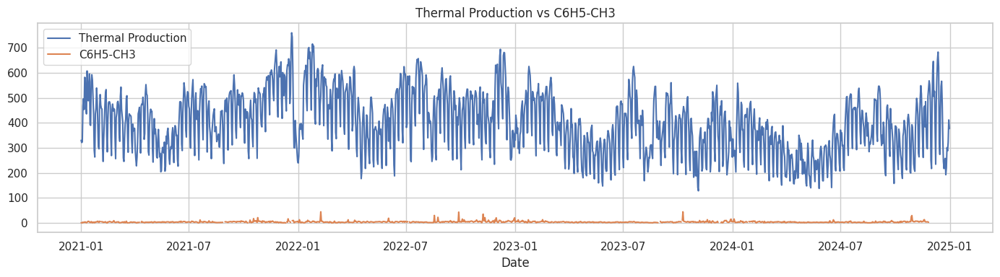

In [177]:
for poll in pollutants:
    plt.figure(figsize=(14, 4))
    plt.plot(air_energy["Day"], air_energy["Thermal"], label="Thermal Production")
    plt.plot(air_energy["Day"], air_energy[poll], label=poll)
    plt.title(f"Thermal Production vs {poll}")
    plt.xlabel("Date")
    plt.legend()
    plt.tight_layout()
    plt.show()

## Scatter Plots: Thermal Production vs Pollution

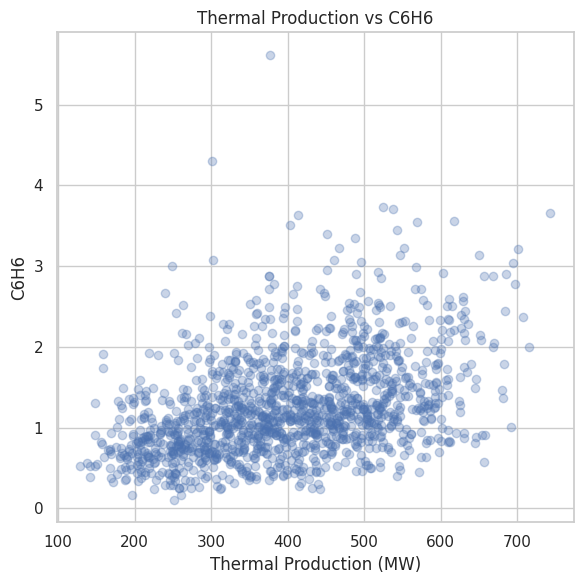

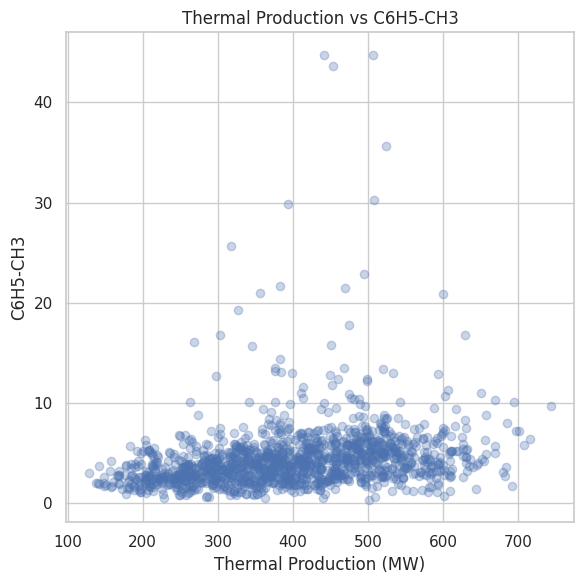

In [178]:
for poll in pollutants:
    plt.figure(figsize=(6, 6))
    plt.scatter(air_energy["Thermal"], air_energy[poll], alpha=0.3)
    plt.xlabel("Thermal Production (MW)")
    plt.ylabel(poll)
    plt.title(f"Thermal Production vs {poll}")
    plt.tight_layout()
    plt.show()

### Relationship between Thermal Production and Benzene (C6H6)


The scatterplot above shows comparison of thermal energy production with C6H6 alludes a *moderate positive relationship*. When Thermal Production increases, Benzene levels follow (*they increase slightly*). On the other side, the points are widely spread, indicating that thermal energy production cannot be the only factor influencing benzene concentrations. >>> correlation matrix
When it comes to outliers, there are several of them present. Thus, local emission sources, meteorological conditions, or industrual activities may also contribute to elevated bensene levels.

---
### Relationship between Thermal Production and Toulene (C6H5-CH3)

There is weak/moderate positve relationship between Toulene and Thermal Production. The higher thermal production levels are associated wirh slightly higher toulene concentrations, but the relationship remains dispersed. Meanwhile, there are also several high-value outliers, which could be linked to urban traffic emissions, atmospheric conditions, or industrial solvents.


## Correlation Between Energy Production and Pollution

In [179]:
corr_cols = ["Thermal", "Hydro", "Wind", "Photovoltaic", "Total Production [MW]"] + pollutants
corr_matrix = air_energy[corr_cols].corr()

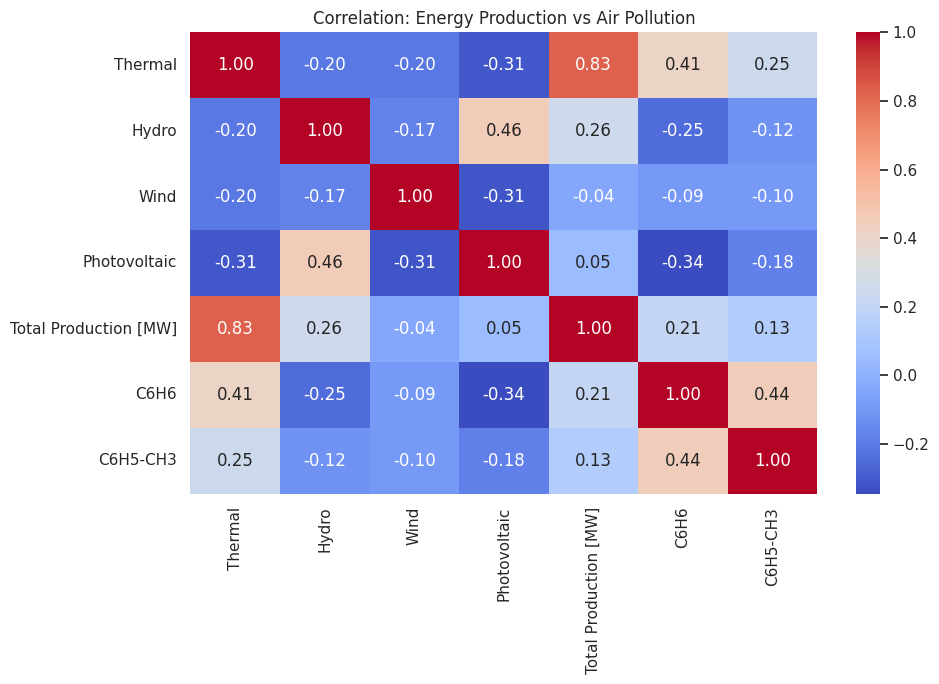

In [180]:
plt.figure(figsize=(10, 7))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation: Energy Production vs Air Pollution")
plt.tight_layout()
plt.show()

After casting a glance at a correlation matrix, and keeping in mind our observation of the previous scatter plots, we can say that it aligns together:
- a correlation of 0.41 between thermal energy production and C6H6 -> suggesting moderate association but not a strong causal relationship!
- a very weak positive correlation between Toulene and Thermal energy production, hence, its influence remains limited compared to the other sources.



---
### Relationship between pollutants



When it comes to correlation between pollutants, our correlation matrix shows that benzene and toulene themselves have a moderate correlation of 0.44. This was expected, since both of them are compounds of VOCs that often originate from similar sources. (fuel, as a collateral of industrial processes, or even vehicle emissions)

---
### Relationship with other energy sources




Overall, they showed a weak or nagative correlations with pollutant levels. Slightly negative correlation between hydro, wind and photovoltaic as sources of production and pollution levels, which means that they are not associated with higher pollution levels.


## Monthly Seasonality

In [181]:
air_energy["Month"] = air_energy["Day"].dt.month
monthly = air_energy.groupby("Month")[["Thermal"] + pollutants].mean()

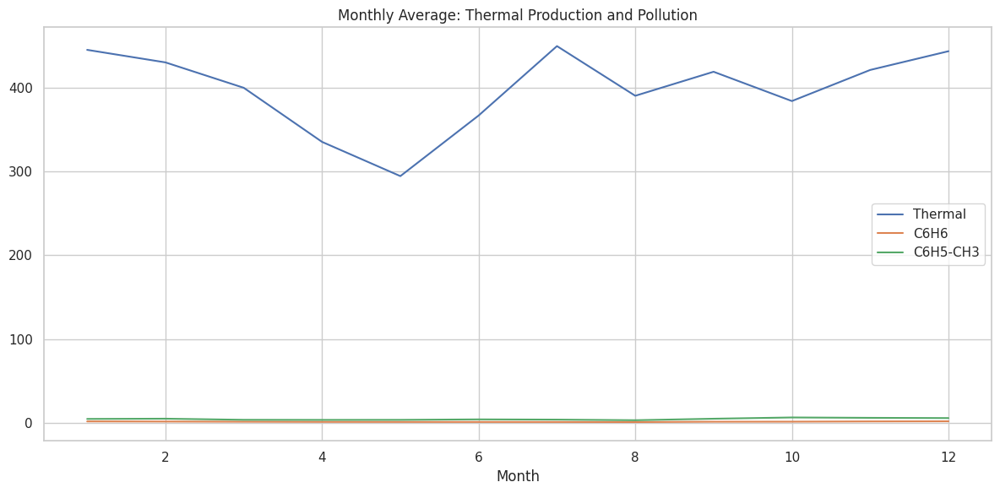

In [182]:
monthly.plot(figsize=(12, 6))
plt.title("Monthly Average: Thermal Production and Pollution")
plt.xlabel("Month")
plt.tight_layout()
plt.show()

## Exporting the Final Dataset

In [183]:
air_energy.to_csv("air_energy_comparison.csv", index=False)

---
## 12. Final EDA & Cross-Dataset Analysis

In this final section, we bring all datasets together for cross-domain analysis: wind direction vs. pollution levels (wind roses), factory proximity and directional analysis, energy production type vs. pollutant concentrations, consumption patterns, and vehicle fleet composition trends against deseasonalised air quality indicators.

In [ ]:
lastdataframe = pd.read_csv("df_merged.csv")

In [ ]:
print(f"Shape: {lastdataframe.shape}")
print(f"\nUnique stations: {lastdataframe['Air Quality Station Name'].nunique()}")
print(lastdataframe["Air Quality Station Name"].value_counts())

Shape: (69272, 16)

Unique stations: 1
Air Quality Station Name
C.SO FRANCIA    69271
Name: count, dtype: int64


In [ ]:
lastwind = pd.read_csv("wind_data_lazio.csv")

In [ ]:
dataframe10 = pd.read_csv("df_merged_stats_parquet_pre.csv")

In [ ]:
print(f"Shape: {dataframe10.shape}")
print(f"\nUnique stations: {dataframe10['Air Quality Station Name'].nunique()}")
print(dataframe10["Air Quality Station Name"].value_counts())

Shape: (1910976, 16)

Unique stations: 10
Air Quality Station Name
VILLA ADA            385704
FERMI                315576
C.SO FRANCIA         280512
BUFALOTTA            157776
CIPRO                140256
CINECITTA            140256
ARENULA              140256
L.GO PERESTRELLO     140256
L.GO MAGNA GRECIA    105192
TIBURTINA            105192
Name: count, dtype: int64


In [ ]:
# Align datetimes
dataframe10["Start"] = pd.to_datetime(dataframe10["Start"], format="mixed")
lastwind["date"] = pd.to_datetime(lastwind["date"], format="mixed").dt.tz_localize(None)

# Create hour key for matching
dataframe10["hour_key"] = dataframe10["Start"].dt.floor("H")
lastwind["hour_key"] = lastwind["date"].dt.floor("H")

# Merge wind data
dataframe10 = pd.merge(
    dataframe10,
    lastwind[["station", "hour_key", "wind_speed_10m", "wind_direction_10m"]],
    left_on=["wind_station", "hour_key"],
    right_on=["station", "hour_key"],
    how="left"
)

dataframe10 = dataframe10.drop(columns=["station", "hour_key"])

matched = dataframe10["wind_speed_10m"].notna().sum()
print(f"\nWind data matched: {matched:,} / {len(dataframe10):,} ({matched/len(dataframe10)*100:.1f}%)")

/tmp/ipykernel_36043/4230360786.py:6: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dataframe10["hour_key"] = dataframe10["Start"].dt.floor("H")
/tmp/ipykernel_36043/4230360786.py:7: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  lastwind["hour_key"] = lastwind["date"].dt.floor("H")



Wind data matched: 1,910,922 / 1,910,976 (100.0%)


In [ ]:
# Unnamed: 0 — index artifact from CSV save
# End — redundant, Start + 1 hour
# Unit — same unit for all rows
# Verification — already cleaned using Validity
# Air Pollutant Description — redundant with Pollutant code
# Samplingpoint — station name is more readable
dataframe10 = dataframe10.drop(columns=[
    "Unnamed: 0", "End", "Unit", "Verification",
    "Air Pollutant Description", "Samplingpoint"
])

print(f"Remaining columns: {dataframe10.columns.tolist()}")

Remaining columns: ['Start', 'Value', 'Validity', 'Year', 'Hour', 'Air Quality Station Name', 'Pollutant', 'Longitude', 'Latitude', 'Altitude', 'wind_station', 'wind_speed_10m', 'wind_direction_10m']


In [ ]:
dataframe10 = dataframe10.drop(columns = "Validity")

In [ ]:
dataframe10 = dataframe10.drop(columns = "Start")

Shape: (1910976, 11)
Unique stations: 10
Unique pollutants: 11
Year range: 2021 - 2024

Nulls:
Value                       315831
Year                             0
Hour                             0
Air Quality Station Name         0
Pollutant                        0
Longitude                        0
Latitude                         0
Altitude                         0
wind_station                     0
wind_speed_10m                  54
wind_direction_10m              54
dtype: int64


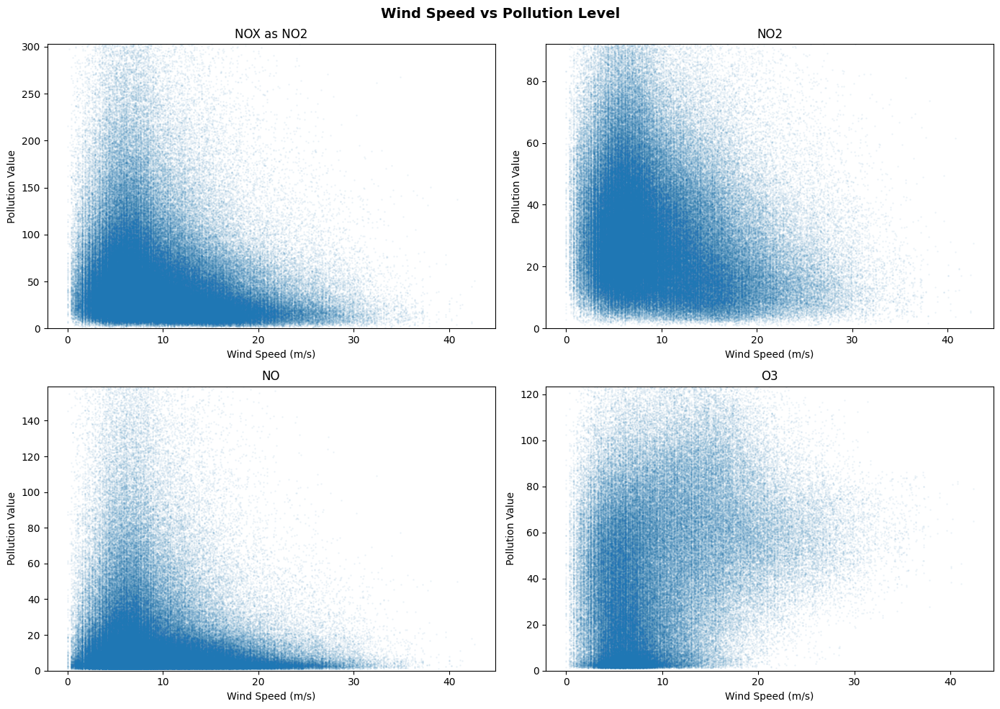

/tmp/ipykernel_36043/808195018.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid["wind_bin"] = pd.cut(valid["wind_speed_10m"], bins=[0, 3, 6, 10, 15, 50],


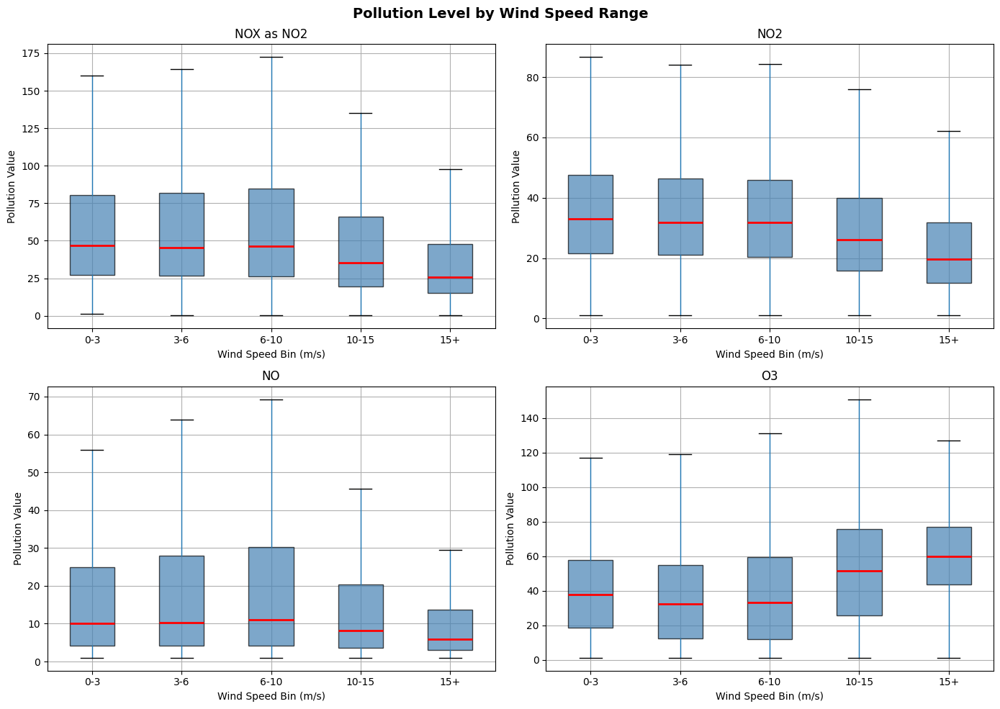

/tmp/ipykernel_36043/808195018.py:78: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_by_dir = sub_dir.groupby("dir_bin")["Value"].mean()
/tmp/ipykernel_36043/808195018.py:78: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_by_dir = sub_dir.groupby("dir_bin")["Value"].mean()
/tmp/ipykernel_36043/808195018.py:78: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_by_dir = sub_dir.groupby("dir_bin")["Value"].mean()
/

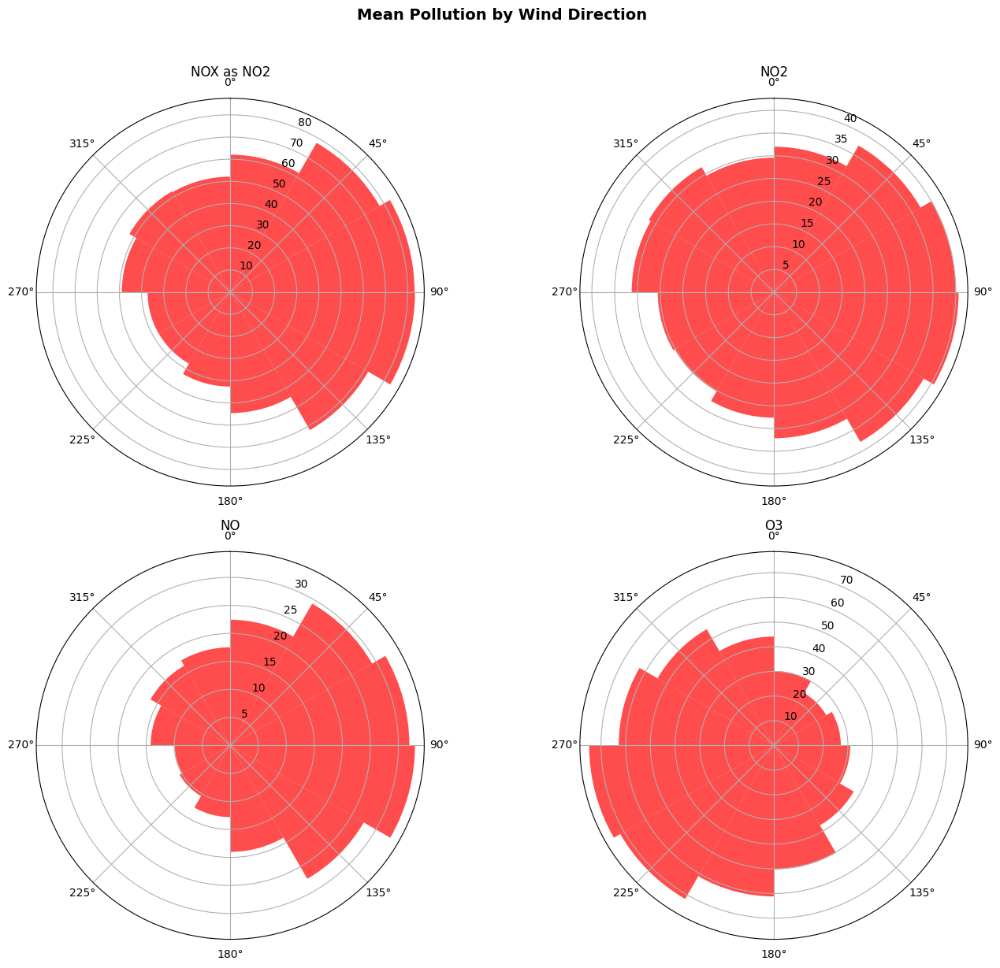

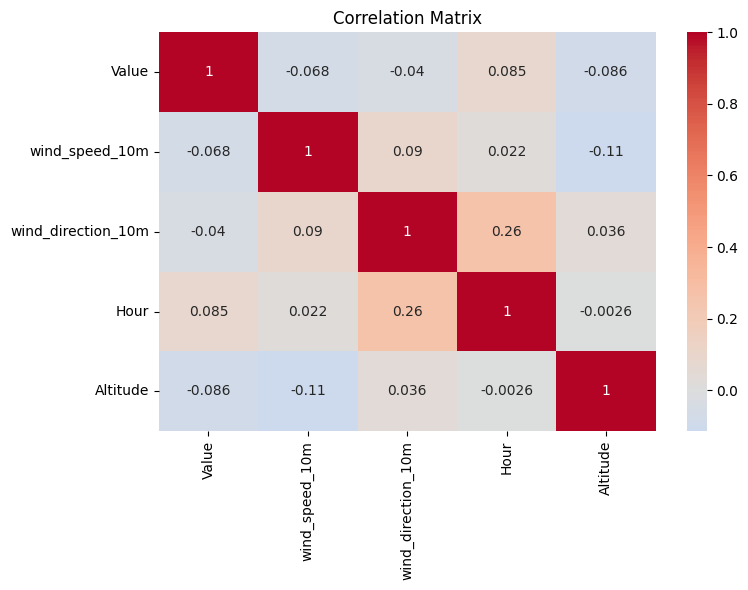

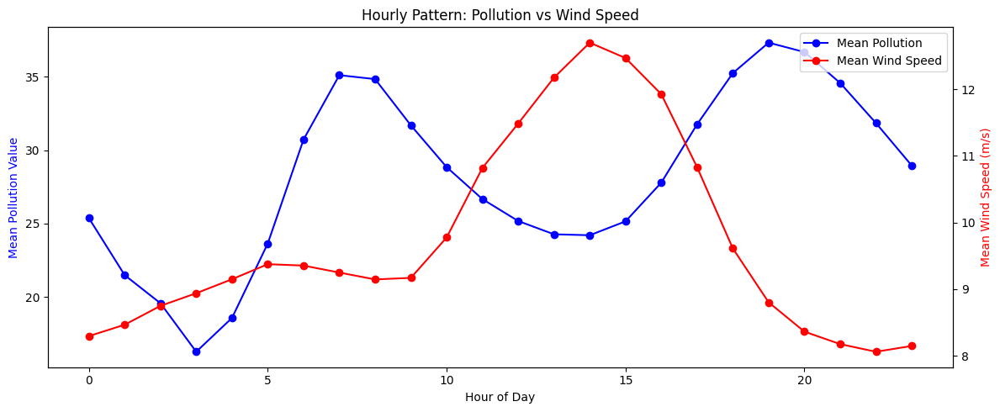

In [ ]:
"""
EDA - Air Quality & Wind Relationship
"""
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# 1. BASIC CHECK
# ============================================================
print(f"Shape: {dataframe10.shape}")
print(f"Unique stations: {dataframe10['Air Quality Station Name'].nunique()}")
print(f"Unique pollutants: {dataframe10['Pollutant'].nunique()}")
print(f"Year range: {dataframe10['Year'].min()} - {dataframe10['Year'].max()}")
print(f"\nNulls:")
print(dataframe10.isna().sum())

# ============================================================
# 2. WIND SPEED vs POLLUTION - Scatter
# ============================================================
# Filter valid data
valid = dataframe10[dataframe10["Value"].notna() & dataframe10["wind_speed_10m"].notna()]

top_pollutants = valid["Pollutant"].value_counts().head(4).index

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, poll in enumerate(top_pollutants):
    sub = valid[valid["Pollutant"] == poll]
    axes[i].scatter(sub["wind_speed_10m"], sub["Value"], alpha=0.05, s=1)
    axes[i].set_title(f"{poll}")
    axes[i].set_xlabel("Wind Speed (m/s)")
    axes[i].set_ylabel("Pollution Value")
    axes[i].set_ylim(0, sub["Value"].quantile(0.99))

plt.suptitle("Wind Speed vs Pollution Level", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# ============================================================
# 3. WIND SPEED BINS vs POLLUTION - Boxplot
# ============================================================
valid["wind_bin"] = pd.cut(valid["wind_speed_10m"], bins=[0, 3, 6, 10, 15, 50],
                            labels=["0-3", "3-6", "6-10", "10-15", "15+"])

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, poll in enumerate(top_pollutants):
    sub = valid[valid["Pollutant"] == poll]
    sub.boxplot(column="Value", by="wind_bin", ax=axes[i], showfliers=False,
                patch_artist=True, boxprops=dict(facecolor="steelblue", alpha=0.7),
                medianprops=dict(color="red", linewidth=2))
    axes[i].set_title(f"{poll}")
    axes[i].set_xlabel("Wind Speed Bin (m/s)")
    axes[i].set_ylabel("Pollution Value")
    plt.suptitle("")

plt.suptitle("Pollution Level by Wind Speed Range", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# ============================================================
# 4. WIND DIRECTION vs POLLUTION - Polar plot
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 12), subplot_kw={"projection": "polar"})
axes = axes.flatten()

direction_bins = np.linspace(0, 360, 13)  # 12 sectors of 30 degrees
labels = ["N", "NNE", "ENE", "E", "ESE", "SSE", "S", "SSW", "WSW", "W", "WNW", "NNW"]

for i, poll in enumerate(top_pollutants):
    sub = valid[valid["Pollutant"] == poll]
    sub_dir = sub.copy()
    sub_dir["dir_bin"] = pd.cut(sub_dir["wind_direction_10m"], bins=direction_bins, labels=labels)
    mean_by_dir = sub_dir.groupby("dir_bin")["Value"].mean()

    theta = np.deg2rad(np.linspace(0, 330, 12) + 15)
    axes[i].bar(theta, mean_by_dir.values, width=np.deg2rad(30), color="red", alpha=0.7)
    axes[i].set_theta_zero_location("N")
    axes[i].set_theta_direction(-1)
    axes[i].set_title(f"{poll}", pad=20)

plt.suptitle("Mean Pollution by Wind Direction", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

# ============================================================
# 5. CORRELATION MATRIX
# ============================================================
corr_data = valid[["Value", "wind_speed_10m", "wind_direction_10m", "Hour", "Altitude"]].corr()

fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(corr_data, annot=True, cmap="coolwarm", center=0, ax=ax)
ax.set_title("Correlation Matrix")
plt.tight_layout()
plt.show()

# ============================================================
# 6. HOURLY PATTERN - Pollution vs Wind
# ============================================================
hourly_avg = valid.groupby("Hour").agg(
    pollution=("Value", "mean"),
    wind_speed=("wind_speed_10m", "mean")
).reset_index()

fig, ax1 = plt.subplots(figsize=(12, 5))
ax2 = ax1.twinx()

ax1.plot(hourly_avg["Hour"], hourly_avg["pollution"], "b-o", label="Mean Pollution")
ax2.plot(hourly_avg["Hour"], hourly_avg["wind_speed"], "r-o", label="Mean Wind Speed")

ax1.set_xlabel("Hour of Day")
ax1.set_ylabel("Mean Pollution Value", color="blue")
ax2.set_ylabel("Mean Wind Speed (m/s)", color="red")
ax1.set_title("Hourly Pattern: Pollution vs Wind Speed")

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc="upper right")
plt.tight_layout()
plt.show()

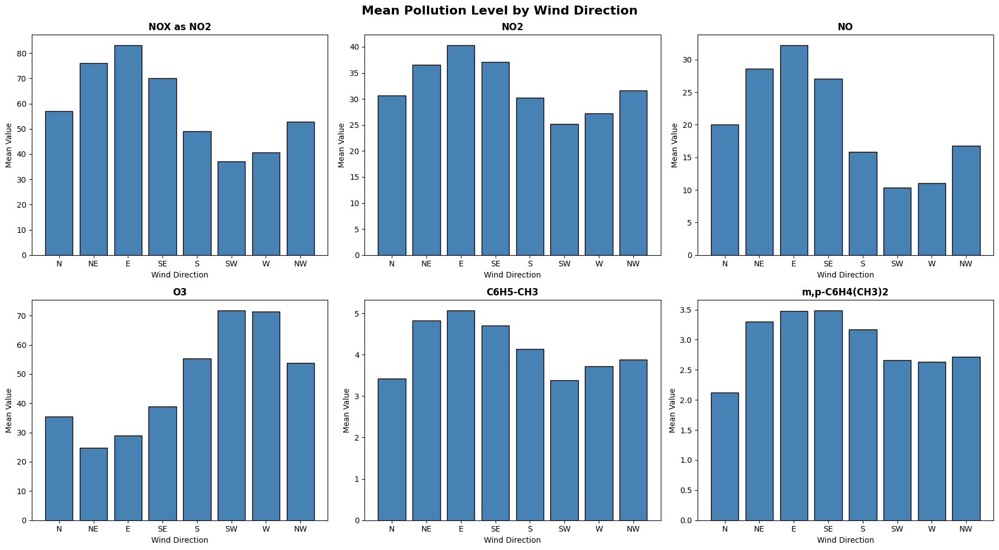

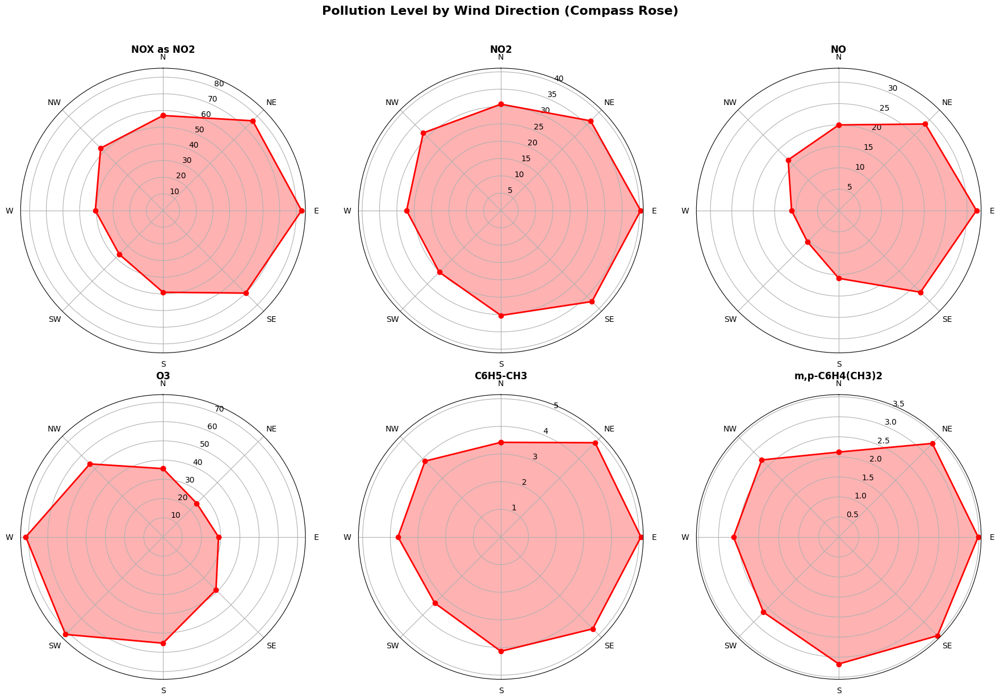


Mean pollution by wind direction:
Pollutant  C6H5-C2H5  C6H5-CH3  C6H6   CO    NO   NO2  NOX as NO2    O3  SO2  m,p-C6H4(CH3)2  o-C6H4-(CH3)2
compass                                                                                                    
N               0.68      3.42  1.09 0.60 20.02 30.68       57.00 35.54 3.33            2.12           1.10
NE              0.89      4.82  1.45 0.73 28.61 36.59       76.11 24.77 3.33            3.30           1.33
E               0.91      5.07  1.51 0.78 32.20 40.31       83.10 28.89 3.35            3.48           1.30
SE              0.94      4.70  1.42 0.76 27.02 37.14       70.05 38.96 3.19            3.49           1.36
S               0.85      4.14  1.25 0.70 15.86 30.27       49.05 55.28 3.36            3.17           1.19
SW              0.78      3.38  1.07 0.59 10.35 25.13       37.12 71.72 3.30            2.66           1.03
W               0.73      3.72  1.04 0.56 11.02 27.20       40.59 71.39 3.32            2.63         

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Group wind direction into 8 compass directions
def get_compass(deg):
    directions = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]
    idx = int(((deg + 22.5) % 360) / 45)
    return directions[idx]

valid = dataframe10[dataframe10["Value"].notna() & dataframe10["wind_direction_10m"].notna()].copy()
valid["compass"] = valid["wind_direction_10m"].apply(get_compass)

# Order for plotting
compass_order = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]

top_pollutants = valid["Pollutant"].value_counts().head(6).index

# 1. Mean pollution by compass direction per pollutant
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, poll in enumerate(top_pollutants):
    sub = valid[valid["Pollutant"] == poll]
    means = sub.groupby("compass")["Value"].mean().reindex(compass_order)
    axes[i].bar(compass_order, means.values, color="steelblue", edgecolor="black")
    axes[i].set_title(f"{poll}", fontsize=12, fontweight="bold")
    axes[i].set_ylabel("Mean Value")
    axes[i].set_xlabel("Wind Direction")

plt.suptitle("Mean Pollution Level by Wind Direction", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

# 2. Polar version - same data but on compass rose
fig, axes = plt.subplots(2, 3, figsize=(18, 12), subplot_kw={"projection": "polar"})
axes = axes.flatten()

angles = np.deg2rad([0, 45, 90, 135, 180, 225, 270, 315])

for i, poll in enumerate(top_pollutants):
    sub = valid[valid["Pollutant"] == poll]
    means = sub.groupby("compass")["Value"].mean().reindex(compass_order)

    # Close the circle
    vals = list(means.values) + [means.values[0]]
    theta = list(angles) + [angles[0]]

    axes[i].fill(theta, vals, alpha=0.3, color="red")
    axes[i].plot(theta, vals, "o-", color="red", linewidth=2)
    axes[i].set_theta_zero_location("N")
    axes[i].set_theta_direction(-1)
    axes[i].set_thetagrids([0, 45, 90, 135, 180, 225, 270, 315], compass_order)
    axes[i].set_title(f"{poll}", pad=20, fontsize=12, fontweight="bold")

plt.suptitle("Pollution Level by Wind Direction (Compass Rose)", fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

# 3. Summary table
print("\nMean pollution by wind direction:")
summary = valid.groupby(["compass", "Pollutant"])["Value"].mean().unstack()
summary = summary.reindex(compass_order)
print(summary.round(2).to_string())

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx

# Rome center
rome_lat, rome_lon = 41.9028, 12.4964

# Get factory locations (from df_factories)
factories = df_factories[["Latitude", "Longitude", "EPRTR_SectorName"]].drop_duplicates()

# Get AQ station locations
aq_stations = dataframe10[["Air Quality Station Name", "Latitude", "Longitude"]].drop_duplicates()

# Calculate direction from Rome to each factory
def get_bearing(lat1, lon1, lat2, lon2):
    dlon = np.radians(lon2 - lon1)
    lat1, lat2 = np.radians(lat1), np.radians(lat2)
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(dlon)
    bearing = np.degrees(np.arctan2(x, y))
    return (bearing + 360) % 360

factories["bearing_from_rome"] = factories.apply(
    lambda r: get_bearing(rome_lat, rome_lon, r["Latitude"], r["Longitude"]), axis=1
)

def get_compass(deg):
    directions = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]
    idx = int(((deg + 22.5) % 360) / 45)
    return directions[idx]

factories["direction_from_rome"] = factories["bearing_from_rome"].apply(get_compass)

print("Factories by direction from Rome:")
print(factories["direction_from_rome"].value_counts().reindex(
    ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]))

print("\nFactories by sector and direction:")
print(factories.groupby(["direction_from_rome", "EPRTR_SectorName"]).size().unstack(fill_value=0))

# Map: factories + AQ stations + compass directions
fig, ax = plt.subplots(figsize=(12, 12))

# Plot factories colored by sector
sectors = factories["EPRTR_SectorName"].unique()
colors = plt.cm.Set1(np.linspace(0, 1, len(sectors)))
sector_colors = dict(zip(sectors, colors))

for sector in sectors:
    sub = factories[factories["EPRTR_SectorName"] == sector]
    ax.scatter(sub["Longitude"], sub["Latitude"], s=60, alpha=0.7,
               color=sector_colors[sector], label=sector, zorder=5)

# Plot AQ stations
ax.scatter(aq_stations["Longitude"], aq_stations["Latitude"],
           s=150, c="red", marker="^", edgecolors="black", linewidths=1.5,
           zorder=6, label="AQ Stations")

# Plot Rome center
ax.scatter(rome_lon, rome_lat, s=200, c="gold", marker="*",
           edgecolors="black", linewidths=1.5, zorder=7, label="Rome Center")

# Draw compass lines from Rome
for angle, direction in zip([0, 45, 90, 135, 180, 225, 270, 315],
                             ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]):
    dx = 0.15 * np.sin(np.radians(angle))
    dy = 0.15 * np.cos(np.radians(angle))
    ax.annotate(direction, (rome_lon + dx, rome_lat + dy), fontsize=10,
                fontweight="bold", ha="center", va="center",
                bbox=dict(boxstyle="round,pad=0.2", fc="yellow", alpha=0.8))

pad = 0.3
ax.set_xlim(rome_lon - 2.5, rome_lon + 2.5)
ax.set_ylim(rome_lat - 2, rome_lat + 2)

ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title("Factories Around Rome with Compass Directions", fontsize=14, fontweight="bold")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

KeyError: "['EPRTR_SectorName'] not in index"

Factory count by direction from Rome:
direction_from_rome
N     408
NE     15
E      75
SE     76
S      15
SW     19
W       6
NW    441
Name: count, dtype: int64

Total releases (kg) by direction:
direction_from_rome
N    14481160255.64
NE     205259960.80
E    21788825314.36
SE   16291805763.07
S     2121750547.60
SW     179501057.69
W     2809144920.33
NW   26848114317.42
Name: Releases, dtype: float64


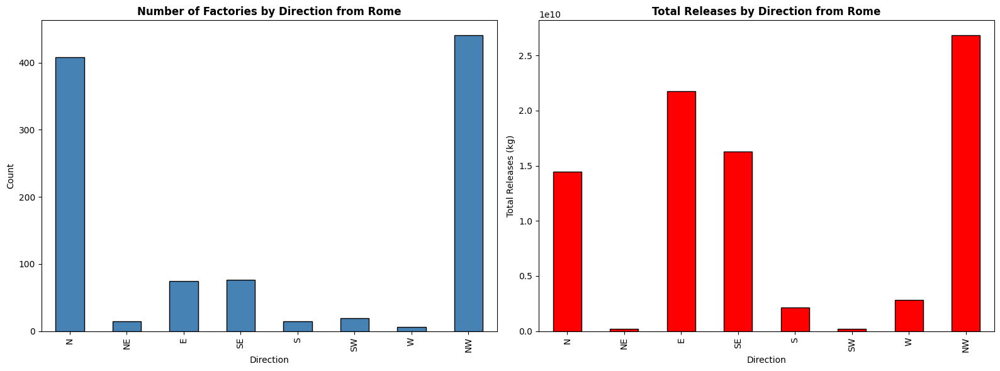

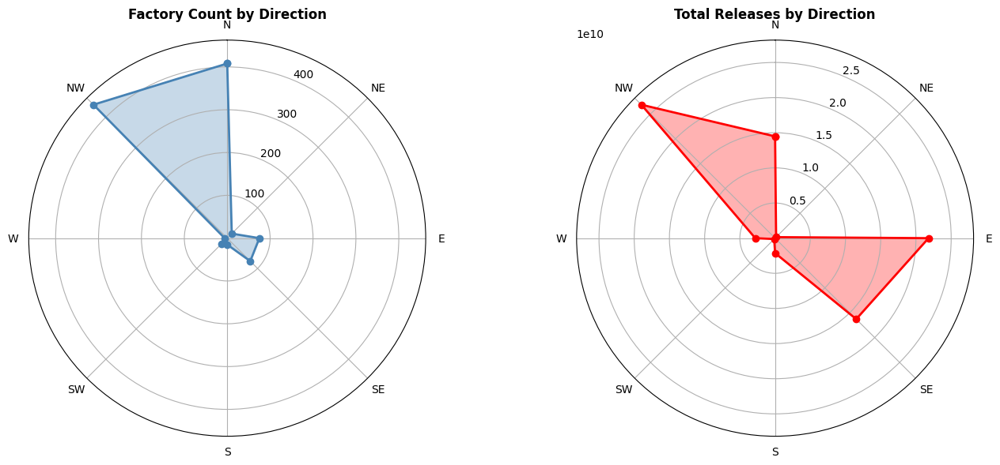


Releases by direction and sector:
EPRTR_SectorName     Animal and vegetable products from the food and beverage sector  Chemical industry  Energy sector  Intensive livestock production and aquaculture  Mineral industry  Other activities  Paper and wood production and processing  Production and processing of metals  Waste and wastewater management
direction_from_rome                                                                                                                                                                                                                                                                                                       
N                                                                          502879.00      1447882414.00 10098266078.00                                     12659785.00     1914064557.00        1628953.00                              259819548.00                         244286686.00                     502034408.00
NE                  

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import radians, sin, cos, atan2, degrees
# Drop rows with missing coordinates before calculating direction
df_factories = df_factories.dropna(subset=["Latitude", "Longitude"])

# Updated get_compass with NaN safety
def get_compass(deg):
    if pd.isna(deg):
        return "Unknown"
    directions = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]
    idx = int(((deg + 22.5) % 360) / 45)
    return directions[idx]
# Rome center
rome_lat, rome_lon = 41.9028, 12.4964

# Calculate bearing (direction) from Rome to each factory
def get_bearing(lat1, lon1, lat2, lon2):
    dlon = np.radians(lon2 - lon1)
    lat1, lat2 = np.radians(lat1), np.radians(lat2)
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(dlon)
    bearing = np.degrees(np.arctan2(x, y))
    return (bearing + 360) % 360

def get_compass(deg):
    directions = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]
    idx = int(((deg + 22.5) % 360) / 45)
    return directions[idx]

df_factories["bearing_from_rome"] = df_factories.apply(
    lambda r: get_bearing(rome_lat, rome_lon, r["Latitude"], r["Longitude"]), axis=1
)
df_factories["direction_from_rome"] = df_factories["bearing_from_rome"].apply(get_compass)

compass_order = ["N", "NE", "E", "SE", "S", "SW", "W", "NW"]

# 1. Number of factories by direction
print("Factory count by direction from Rome:")
print(df_factories["direction_from_rome"].value_counts().reindex(compass_order))

# 2. Total releases by direction
releases_by_dir = df_factories.groupby("direction_from_rome")["Releases"].sum().reindex(compass_order)
print("\nTotal releases (kg) by direction:")
print(releases_by_dir)

# 3. Bar chart: factory count by direction
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

df_factories["direction_from_rome"].value_counts().reindex(compass_order).plot(
    kind="bar", ax=axes[0], color="steelblue", edgecolor="black")
axes[0].set_title("Number of Factories by Direction from Rome", fontweight="bold")
axes[0].set_ylabel("Count")
axes[0].set_xlabel("Direction")

releases_by_dir.plot(kind="bar", ax=axes[1], color="red", edgecolor="black")
axes[1].set_title("Total Releases by Direction from Rome", fontweight="bold")
axes[1].set_ylabel("Total Releases (kg)")
axes[1].set_xlabel("Direction")

plt.tight_layout()
plt.show()

# 4. Polar plot: releases by direction
fig, axes = plt.subplots(1, 2, figsize=(14, 6), subplot_kw={"projection": "polar"})
angles = np.deg2rad([0, 45, 90, 135, 180, 225, 270, 315])

# Factory count polar
counts = df_factories["direction_from_rome"].value_counts().reindex(compass_order).values
vals = list(counts) + [counts[0]]
theta = list(angles) + [angles[0]]
axes[0].fill(theta, vals, alpha=0.3, color="steelblue")
axes[0].plot(theta, vals, "o-", color="steelblue", linewidth=2)
axes[0].set_theta_zero_location("N")
axes[0].set_theta_direction(-1)
axes[0].set_thetagrids([0, 45, 90, 135, 180, 225, 270, 315], compass_order)
axes[0].set_title("Factory Count by Direction", pad=20, fontweight="bold")

# Releases polar
rels = releases_by_dir.values
vals = list(rels) + [rels[0]]
axes[1].fill(theta, vals, alpha=0.3, color="red")
axes[1].plot(theta, vals, "o-", color="red", linewidth=2)
axes[1].set_theta_zero_location("N")
axes[1].set_theta_direction(-1)
axes[1].set_thetagrids([0, 45, 90, 135, 180, 225, 270, 315], compass_order)
axes[1].set_title("Total Releases by Direction", pad=20, fontweight="bold")

plt.tight_layout()
plt.show()

# 5. Releases by direction AND sector
print("\nReleases by direction and sector:")
sector_dir = df_factories.groupby(["direction_from_rome", "EPRTR_SectorName"])["Releases"].sum().unstack(fill_value=0)
sector_dir = sector_dir.reindex(compass_order)
print(sector_dir.round(0).to_string())

# 6. Compare with pollution compass rose
# If you already have the pollution compass data from earlier:
print("\n\nCOMPARISON:")
print("If factory releases are highest from direction X,")
print("and pollution is highest when wind comes FROM direction X,")
print("that suggests factories in that direction are contributing to Rome's air quality.")

Factories in E + SE: 151
Total releases E+SE: 38,080,631,077 kg

--- Sector breakdown ---
                                                count            sum  \
EPRTR_SectorName                                                       
Energy sector                                      68 25669832493.00   
Production and processing of metals                25  9139665967.00   
Mineral industry                                   23  2270653476.00   
Chemical industry                                   9   996490794.00   
Other activities                                   10     2519095.00   
Waste and wastewater management                     8     1242992.00   
Intensive livestock production and aquaculture      8      226259.00   

                                                       mean  
EPRTR_SectorName                                             
Energy sector                                  377497537.00  
Production and processing of metals            365586639.00  
Mineral indus

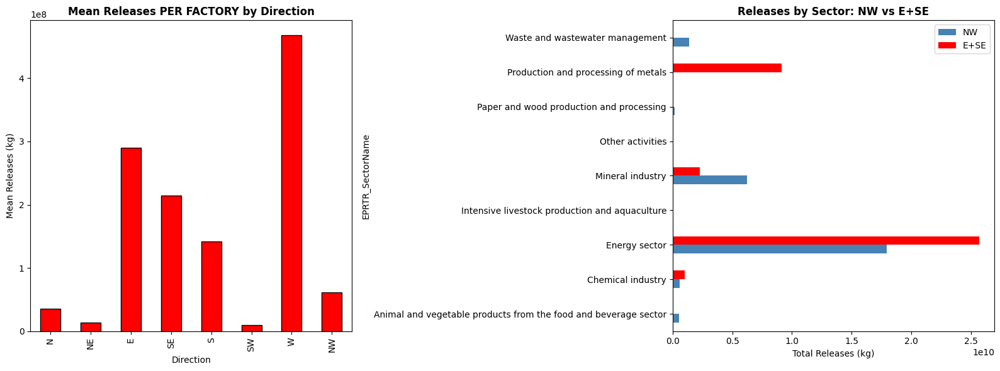

In [ ]:
# Focus on E and SE — where most pollution comes from
high_pollution_dirs = df_factories[df_factories["direction_from_rome"].isin(["E", "SE"])].copy()

print(f"Factories in E + SE: {len(high_pollution_dirs)}")
print(f"Total releases E+SE: {high_pollution_dirs['Releases'].sum():,.0f} kg")
print(f"\n--- Sector breakdown ---")
print(high_pollution_dirs.groupby("EPRTR_SectorName")["Releases"].agg(["count", "sum", "mean"]).sort_values("sum", ascending=False).round(0))

print(f"\n--- Top pollutants ---")
print(high_pollution_dirs.groupby("Pollutant")["Releases"].sum().sort_values(ascending=False).head(10))

print(f"\n--- Top facilities by releases ---")
top_fac = high_pollution_dirs.groupby(["EPRTRAnnexIMainActivity", "Latitude", "Longitude"])["Releases"].sum().sort_values(ascending=False).head(10)
print(top_fac)

# Compare: releases per factory by direction
print(f"\n--- Mean releases per factory by direction ---")
per_factory = df_factories.groupby("direction_from_rome").agg(
    num_factories=("Releases", "count"),
    total_releases=("Releases", "sum"),
    mean_releases=("Releases", "mean")
).reindex(["N", "NE", "E", "SE", "S", "SW", "W", "NW"])
print(per_factory.round(0))

# Plot: compare NW (most factories) vs E/SE (most pollution)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Releases per factory by direction
per_factory["mean_releases"].plot(kind="bar", ax=axes[0], color="red", edgecolor="black")
axes[0].set_title("Mean Releases PER FACTORY by Direction", fontweight="bold")
axes[0].set_ylabel("Mean Releases (kg)")
axes[0].set_xlabel("Direction")

# Sector comparison: NW vs E/SE
nw = df_factories[df_factories["direction_from_rome"] == "NW"]
ese = df_factories[df_factories["direction_from_rome"].isin(["E", "SE"])]

compare = pd.DataFrame({
    "NW": nw.groupby("EPRTR_SectorName")["Releases"].sum(),
    "E+SE": ese.groupby("EPRTR_SectorName")["Releases"].sum()
}).fillna(0)

compare.plot(kind="barh", ax=axes[1], color={"NW": "steelblue", "E+SE": "red"})
axes[1].set_title("Releases by Sector: NW vs E+SE", fontweight="bold")
axes[1].set_xlabel("Total Releases (kg)")

plt.tight_layout()
plt.show()

 Year  Total_Releases  Mean_Releases  Facility_Count
 2021  14645439723.52   266280722.25              55
 2022  19544805394.19   342891322.71              57
 2023  17349404774.99   369136271.81              47
 2024   6614010447.84   206687826.49              32


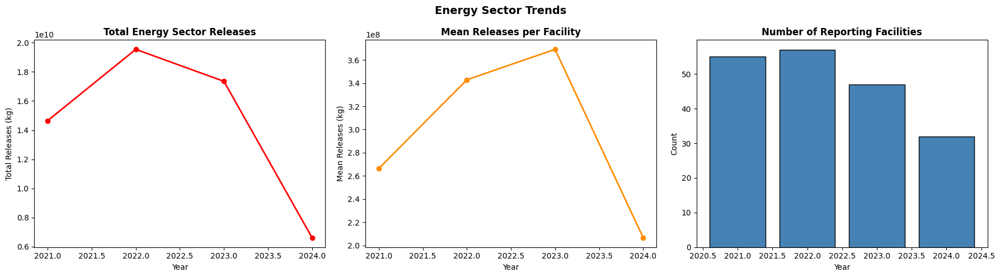

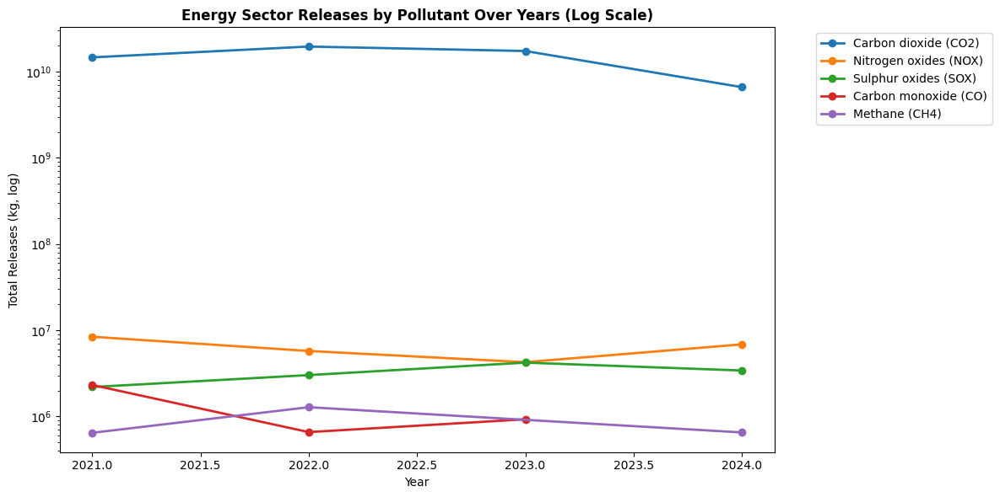

In [ ]:
# Energy sector releases over years
energy = df_factories[df_factories["EPRTR_SectorName"] == "Energy sector"]

# Total and mean releases by year
yearly_energy = energy.groupby("reportingYear")["Releases"].agg(["sum", "mean", "count"]).reset_index()
yearly_energy.columns = ["Year", "Total_Releases", "Mean_Releases", "Facility_Count"]

print(yearly_energy.to_string(index=False))

# Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(yearly_energy["Year"], yearly_energy["Total_Releases"], marker="o", color="red", linewidth=2)
axes[0].set_title("Total Energy Sector Releases", fontweight="bold")
axes[0].set_ylabel("Total Releases (kg)")
axes[0].set_xlabel("Year")

axes[1].plot(yearly_energy["Year"], yearly_energy["Mean_Releases"], marker="o", color="darkorange", linewidth=2)
axes[1].set_title("Mean Releases per Facility", fontweight="bold")
axes[1].set_ylabel("Mean Releases (kg)")
axes[1].set_xlabel("Year")

axes[2].bar(yearly_energy["Year"], yearly_energy["Facility_Count"], color="steelblue", edgecolor="black")
axes[2].set_title("Number of Reporting Facilities", fontweight="bold")
axes[2].set_ylabel("Count")
axes[2].set_xlabel("Year")

plt.suptitle("Energy Sector Trends", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# By pollutant for energy sector
fig, ax = plt.subplots(figsize=(12, 6))
top_polls = energy.groupby("Pollutant")["Releases"].sum().sort_values(ascending=False).head(5).index

for poll in top_polls:
    sub = energy[energy["Pollutant"] == poll].groupby("reportingYear")["Releases"].sum()
    ax.plot(sub.index, sub.values, marker="o", linewidth=2, label=poll)

ax.set_yscale("log")
ax.set_title("Energy Sector Releases by Pollutant Over Years (Log Scale)", fontweight="bold")
ax.set_xlabel("Year")
ax.set_ylabel("Total Releases (kg, log)")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [ ]:
energy_plt = pd.read_csv("energy_plt.csv")

In [ ]:
daily_pollution = pd.read_csv("daily_pollution.csv")

In [ ]:
# Drop unnecessary columns
energy_plt = energy_plt.drop(columns=["Unnamed: 0"])

# Align dates
daily_pollution["Date"] = pd.to_datetime(daily_pollution["Date"])
energy_plt["Day"] = pd.to_datetime(energy_plt["Day"])

# Merge on date
daily_combined = pd.merge(
    daily_pollution,
    energy_plt,
    left_on="Date",
    right_on="Day",
    how="inner"
)

daily_combined = daily_combined.drop(columns=["Day"])

print(f"Shape: {daily_combined.shape}")
print(f"Date range: {daily_combined['Date'].min()} to {daily_combined['Date'].max()}")
print(f"Rows: {len(daily_combined):,}")

Shape: (1461, 20)
Date range: 2021-01-01 00:00:00 to 2024-12-31 00:00:00
Rows: 1,461


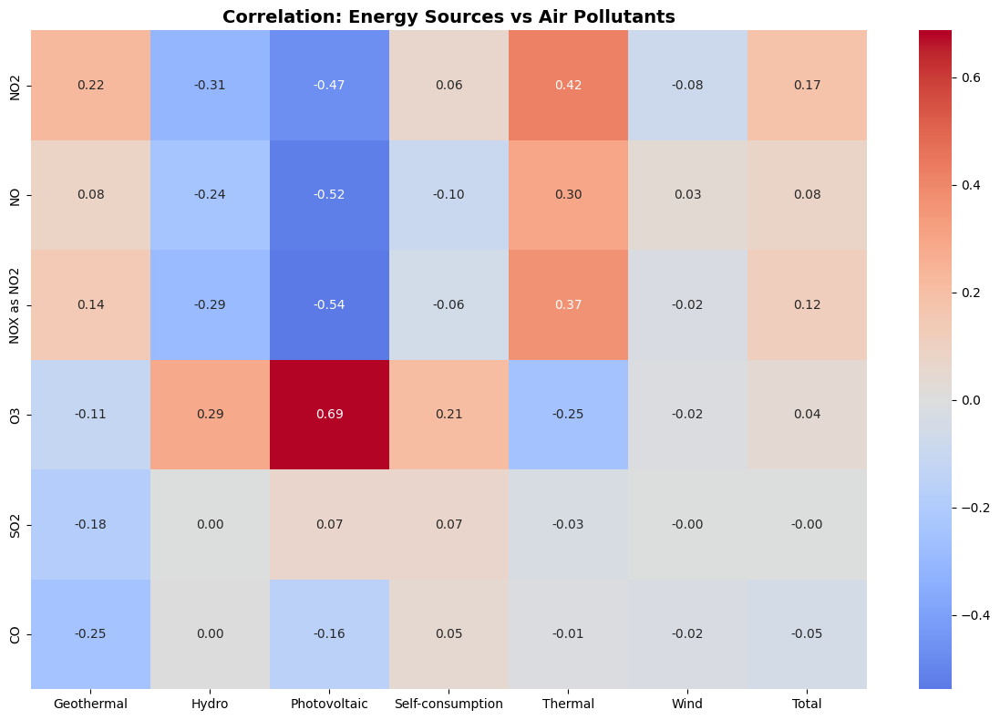

In [ ]:
import seaborn as sns

# Correlation between energy sources and pollutants
energy_cols = ["Geothermal", "Hydro", "Photovoltaic", "Self-consumption", "Thermal", "Wind", "Total"]
pollutant_cols = ["NO2", "NO", "NOX as NO2", "O3", "SO2", "CO"]

corr = daily_combined[energy_cols + pollutant_cols].corr()

# Show only energy vs pollutant correlations
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(corr.loc[pollutant_cols, energy_cols], annot=True, cmap="coolwarm",
            center=0, fmt=".2f", ax=ax)
ax.set_title("Correlation: Energy Sources vs Air Pollutants", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

In [ ]:
daily_consumption = pd.read_csv("DailyConsumption_Wide.csv")

In [ ]:
# Fix column names - the region names are in the first row
# First, set the first row as column names
daily_consumption.columns = daily_consumption.iloc[0] if daily_consumption.iloc[0].notna().any() else daily_consumption.columns

# If the first data row has region names, drop it
daily_consumption = daily_consumption.drop(index=0).reset_index(drop=True)

# Rename columns manually
daily_consumption.columns = ["Date", "Calabria", "Centre-North", "Centre-South", "Italy",
                              "North", "Sardinia", "Sicily", "South",
                              "Forecast_Calabria", "Forecast_Centre-North", "Forecast_Centre-South",
                              "Forecast_Italy", "Forecast_North", "Forecast_Sardinia",
                              "Forecast_Sicily", "Forecast_South"]

daily_consumption["Date"] = pd.to_datetime(daily_consumption["Date"])

daily_consumption.head()


,Date,Calabria,Centre-North,Centre-South,Italy,North,Sardinia,Sicily,South,Forecast_Calabria,Forecast_Centre-North,Forecast_Centre-South,Forecast_Italy,Forecast_North,Forecast_Sardinia,Forecast_Sicily,Forecast_South
0,2021-01-02,626.30628125,2478.478625,5197.3430312499995,27544.197895833335,13923.800177083334,1045.2110104166666,2100.798208333333,2172.2605625,638.0978645833333,2526.0112916666667,5299.699760416667,28078.541645833335,14197.497270833332,1065.54328125,2140.0481354166664,2211.644041666667
1,2021-01-03,627.4801145833334,2342.8533125,5065.761927083334,26613.03119791667,13400.244250000002,1036.1306979166668,2041.3806770833335,2099.18021875,617.9876354166666,2307.9996770833336,4990.84859375,26223.760354166665,13204.995989583333,1021.2098020833333,2012.2343958333333,2068.4842604166665
2,2021-01-04,733.1248125000001,2969.8016354166666,6072.452697916667,33755.541666666664,17876.990145833333,1109.1214687499998,2263.508875,2730.54203125,715.7123229166667,2899.3556354166667,5931.090708333333,32954.11463541666,17445.087802083333,1083.4688437500001,2212.2597708333333,2667.1395520833335
3,2021-01-05,722.0099791666667,3163.9678124999996,6471.392354166666,35059.562645833335,18798.909760416667,1129.7869479166668,2118.1674583333333,2655.3283333333334,703.91765625,3082.2767291666664,6306.996760416667,34161.76046875,18310.657270833333,1101.8188333333333,2066.593677083333,2589.4995416666666
4,2021-01-06,651.5847083333333,2659.43784375,5471.9226874999995,30032.760427083336,15923.627260416666,1082.9323645833333,1903.3721354166667,2339.8834270833336,641.6422083333333,2619.3943020833335,5388.964927083333,29576.92709375,15680.765270833333,1066.71496875,1874.88928125,2304.5561354166666


In [ ]:
daily_consumption["Date"] = pd.to_datetime(daily_consumption["Date"])

# Convert all columns except Date to numeric
numeric_cols = [c for c in daily_consumption.columns if c != "Date"]
daily_consumption[numeric_cols] = daily_consumption[numeric_cols].apply(pd.to_numeric, errors="coerce")

weekly_consumption = daily_consumption.set_index("Date").resample("W").mean().reset_index()

# Create week label
weekly_consumption["Week_Label"] = (
    weekly_consumption["Date"].dt.isocalendar().week.astype(int).astype(str) + "-" +
    weekly_consumption["Date"].dt.year.astype(str)
)

weekly_consumption = weekly_consumption.set_index("Week_Label").drop(columns=["Date"])

print(f"Shape: {weekly_consumption.shape}")
print(weekly_consumption.head())

Shape: (272, 16)
            Calabria  Centre-North  Centre-South    Italy    North  Sardinia  \
Week_Label                                                                     
53-2021       626.89       2410.67       5131.55 27078.61 13662.02   1040.67   
1-2021        695.81       3041.01       6149.65 34303.35 18646.44   1111.43   
2-2021        676.56       3377.05       6597.43 39096.62 22434.06   1104.08   
3-2021        718.89       3276.26       6475.67 38470.57 22118.05   1074.72   
4-2021        698.02       3274.52       6279.87 37825.55 21862.01   1056.68   

            Sicily   South  Forecast_Calabria  Forecast_Centre-North  \
Week_Label                                                             
53-2021    2071.09 2135.72             628.04                2417.01   
1-2021     2030.07 2628.95             684.88                2993.48   
2-2021     2165.84 2741.59             678.27                3382.66   
3-2021     2165.39 2641.59             728.77                3

In [ ]:
# Drop forecast columns — not needed, actual consumption is sufficient
forecast_cols = [c for c in weekly_consumption.columns if c.startswith("Forecast")]
weekly_consumption = weekly_consumption.drop(columns=forecast_cols)

print(f"Remaining columns: {weekly_consumption.columns.tolist()}")

Remaining columns: ['Calabria', 'Centre-North', 'Centre-South', 'Italy', 'North', 'Sardinia', 'Sicily', 'South']


In [ ]:
cars_size = pd.read_csv("pollution_vehicle-2.csv")

In [ ]:
cars_size.columns

Index(['year', 'week', 'date', 'Benzine', 'Diesel', 'Electric', 'Hybrid',
       'Others', 'Total', 'Benzine_weekly_growth_pct',
       'Diesel_weekly_growth_pct', 'Electric_weekly_growth_pct',
       'Hybrid_weekly_growth_pct', 'Others_weekly_growth_pct',
       'Benzine_share_pct', 'Diesel_share_pct', 'Electric_share_pct',
       'Hybrid_share_pct', 'Others_share_pct', 'C6H5-C2H5', 'C6H5-CH3', 'C6H6',
       'CO', 'NO', 'NO2', 'NOX as NO2', 'O3', 'SO2', 'm,p-C6H4(CH3)2',
       'o-C6H4-(CH3)2'],
      dtype='object')

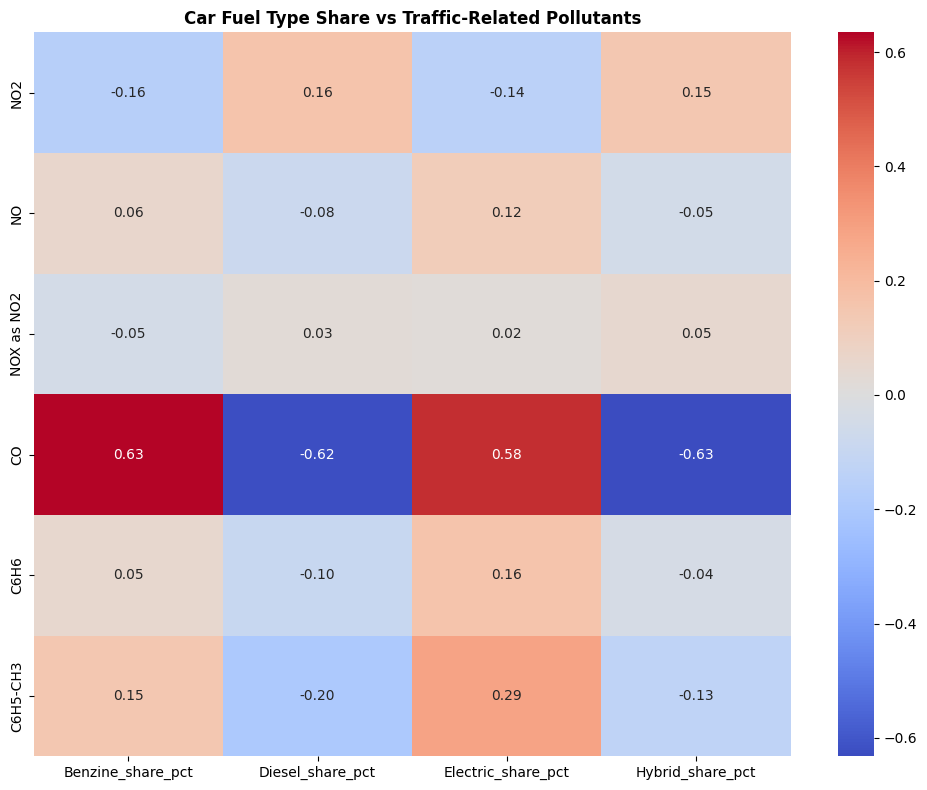

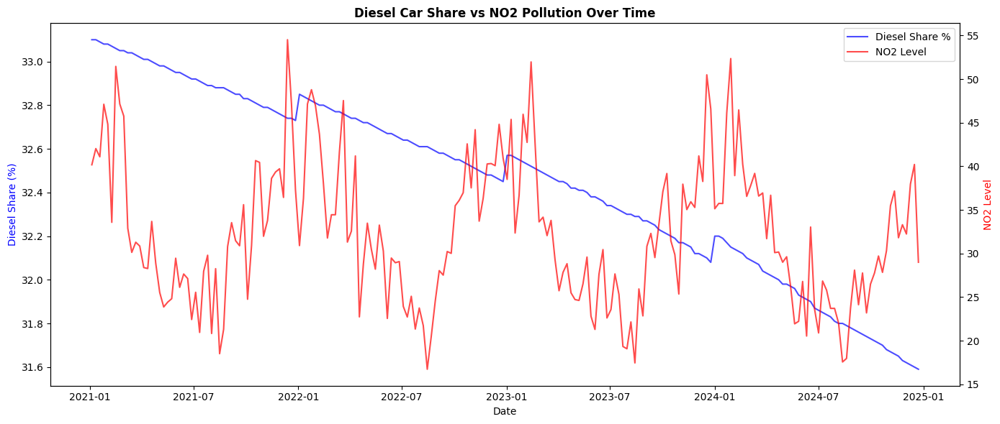

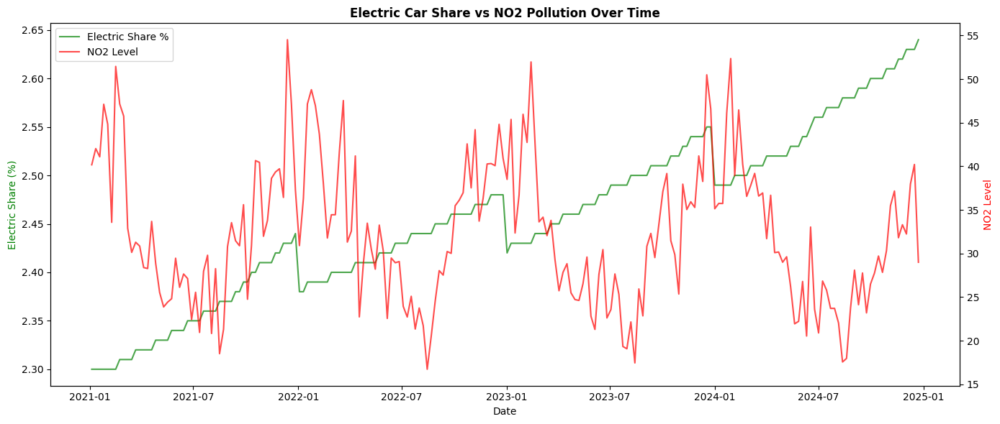

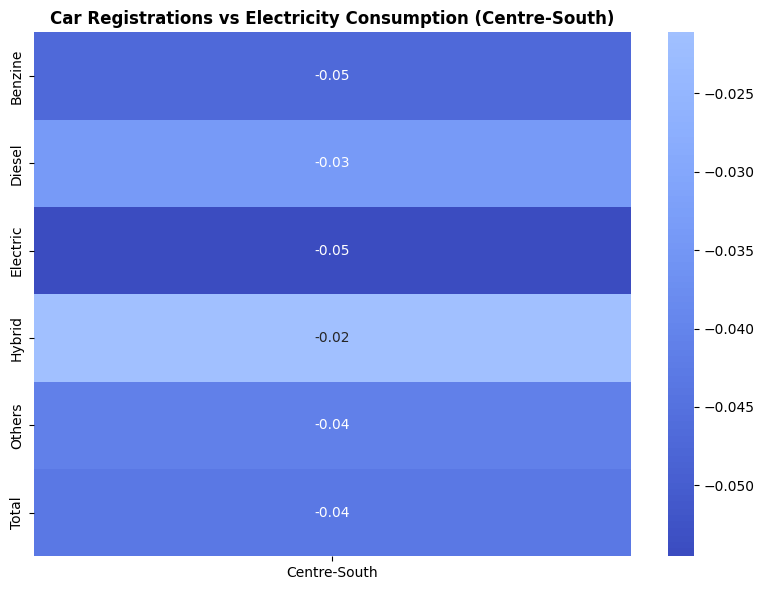

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# 1. CORRELATION: Car types vs Air Quality
# ============================================================
pollutant_cols = ["NO2", "NO", "NOX as NO2", "CO", "C6H6", "C6H5-CH3"]
share_cols = ["Benzine_share_pct", "Diesel_share_pct", "Electric_share_pct", "Hybrid_share_pct"]

fig, ax = plt.subplots(figsize=(10, 8))
corr = cars_size[share_cols + pollutant_cols].corr()
sns.heatmap(corr.loc[pollutant_cols, share_cols], annot=True, cmap="coolwarm",
            center=0, fmt=".2f", ax=ax)
ax.set_title("Car Fuel Type Share vs Traffic-Related Pollutants", fontweight="bold")
plt.tight_layout()
plt.show()

# ============================================================
# 2. TREND: Diesel share vs NO2
# ============================================================
cars_size["date"] = pd.to_datetime(cars_size["date"])

fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()
ax1.plot(cars_size["date"], cars_size["Diesel_share_pct"], "b-", linewidth=1.5, label="Diesel Share %", alpha=0.7)
ax2.plot(cars_size["date"], cars_size["NO2"], "r-", linewidth=1.5, label="NO2 Level", alpha=0.7)
ax1.set_xlabel("Date")
ax1.set_ylabel("Diesel Share (%)", color="blue")
ax2.set_ylabel("NO2 Level", color="red")
ax1.set_title("Diesel Car Share vs NO2 Pollution Over Time", fontweight="bold")
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)
plt.tight_layout()
plt.show()

# ============================================================
# 3. TREND: Electric share vs NO2
# ============================================================
fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()
ax1.plot(cars_size["date"], cars_size["Electric_share_pct"], "g-", linewidth=1.5, label="Electric Share %", alpha=0.7)
ax2.plot(cars_size["date"], cars_size["NO2"], "r-", linewidth=1.5, label="NO2 Level", alpha=0.7)
ax1.set_xlabel("Date")
ax1.set_ylabel("Electric Share (%)", color="green")
ax2.set_ylabel("NO2 Level", color="red")
ax1.set_title("Electric Car Share vs NO2 Pollution Over Time", fontweight="bold")
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)
plt.tight_layout()
plt.show()

# ============================================================
# 4. Car registrations vs Electricity Consumption
# ============================================================
# Merge with weekly consumption
weekly_consumption_reset = weekly_consumption.reset_index()
cars_size["Week_Label"] = (
    cars_size["date"].dt.isocalendar().week.astype(int).astype(str) + "-" +
    cars_size["date"].dt.year.astype(str)
)

car_cons = pd.merge(cars_size, weekly_consumption_reset[["Week_Label", "Centre-South"]],
                     on="Week_Label", how="inner")

car_cols = ["Benzine", "Diesel", "Electric", "Hybrid", "Others", "Total"]
fig, ax = plt.subplots(figsize=(8, 6))
corr2 = car_cons[car_cols + ["Centre-South"]].corr()
sns.heatmap(corr2[["Centre-South"]].drop("Centre-South"), annot=True, cmap="coolwarm",
            center=0, fmt=".2f", ax=ax)
ax.set_title("Car Registrations vs Electricity Consumption (Centre-South)", fontweight="bold")
plt.tight_layout()
plt.show()

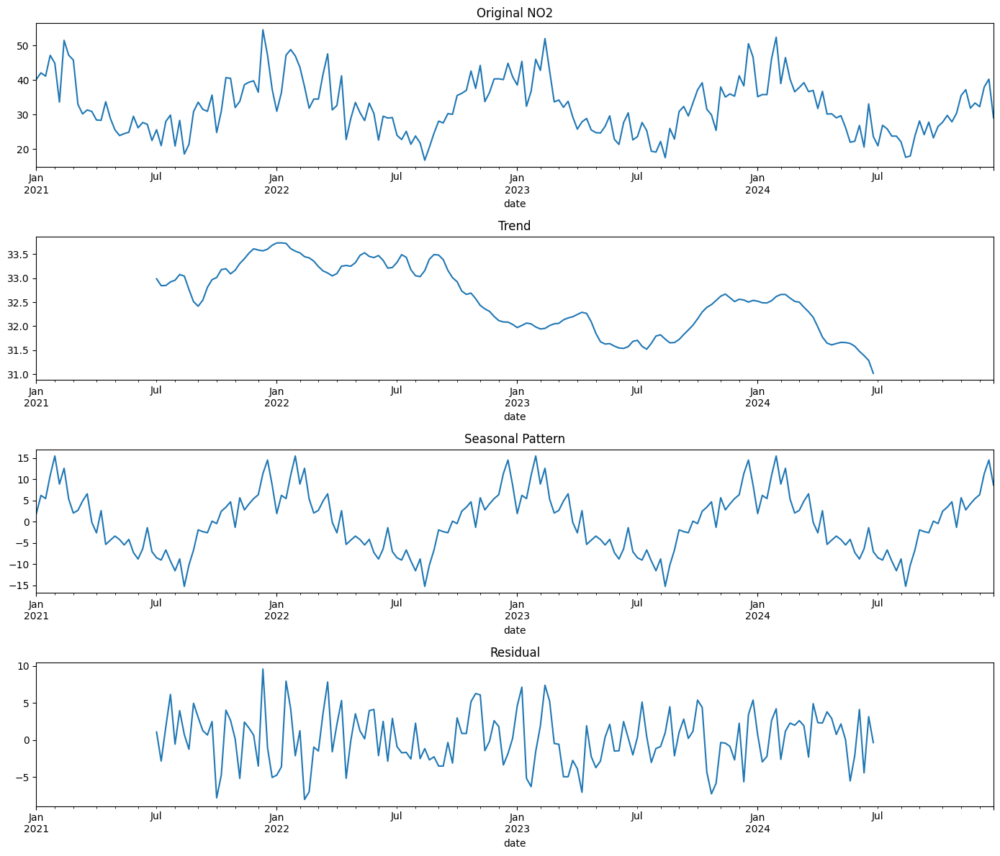

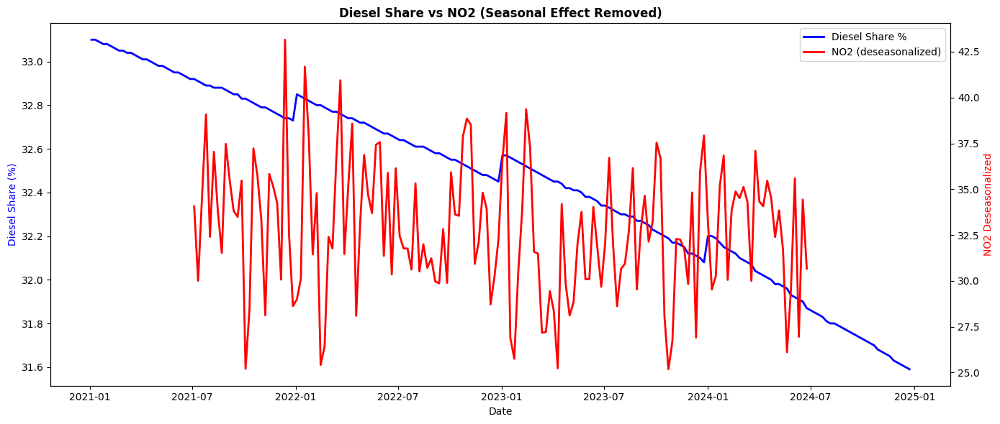

Correlation with deseasonalized NO2:
Diesel_share_pct      0.13
Electric_share_pct   -0.13
Benzine_share_pct    -0.13
Name: NO2_deseasonalized, dtype: float64


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Make sure date is index
cars_temp = cars_size.set_index(pd.to_datetime(cars_size["date"])).sort_index()

# Decompose NO2 — period=52 for weekly data (52 weeks = 1 year)
no2_decomp = seasonal_decompose(cars_temp["NO2"].dropna(), model="additive", period=52)

# Get the deseasonalized NO2 (trend + residual, without seasonal component)
cars_temp["NO2_deseasonalized"] = no2_decomp.trend + no2_decomp.resid

# Plot decomposition
fig, axes = plt.subplots(4, 1, figsize=(14, 12))
no2_decomp.observed.plot(ax=axes[0], title="Original NO2")
no2_decomp.trend.plot(ax=axes[1], title="Trend")
no2_decomp.seasonal.plot(ax=axes[2], title="Seasonal Pattern")
no2_decomp.resid.plot(ax=axes[3], title="Residual")
plt.tight_layout()
plt.show()

# Now plot deseasonalized NO2 vs Diesel share
fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()

ax1.plot(cars_temp.index, cars_temp["Diesel_share_pct"], "b-", linewidth=2, label="Diesel Share %")
ax2.plot(cars_temp.index, cars_temp["NO2_deseasonalized"], "r-", linewidth=2, label="NO2 (deseasonalized)")

ax1.set_xlabel("Date")
ax1.set_ylabel("Diesel Share (%)", color="blue")
ax2.set_ylabel("NO2 Deseasonalized", color="red")
ax1.set_title("Diesel Share vs NO2 (Seasonal Effect Removed)", fontweight="bold")

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)
plt.tight_layout()
plt.show()

# Correlation with deseasonalized data
corr = cars_temp[["Diesel_share_pct", "Electric_share_pct", "Benzine_share_pct", "NO2_deseasonalized"]].corr()
print("Correlation with deseasonalized NO2:")
print(corr["NO2_deseasonalized"].drop("NO2_deseasonalized"))

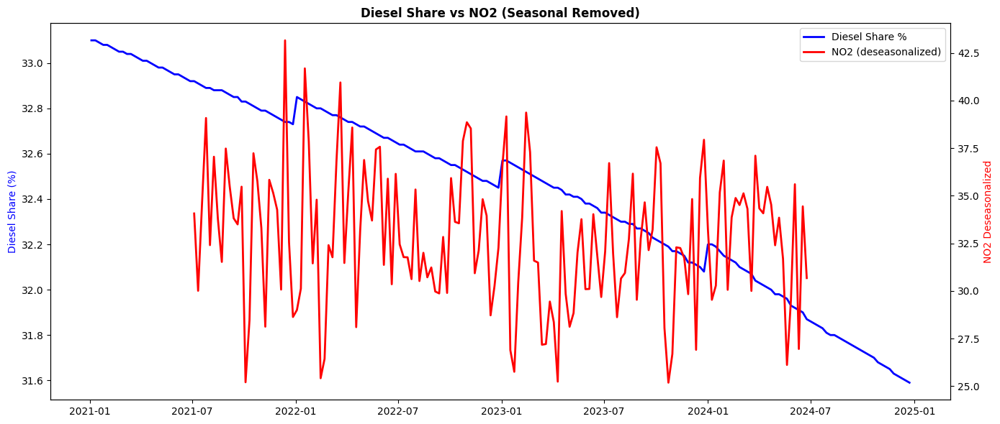

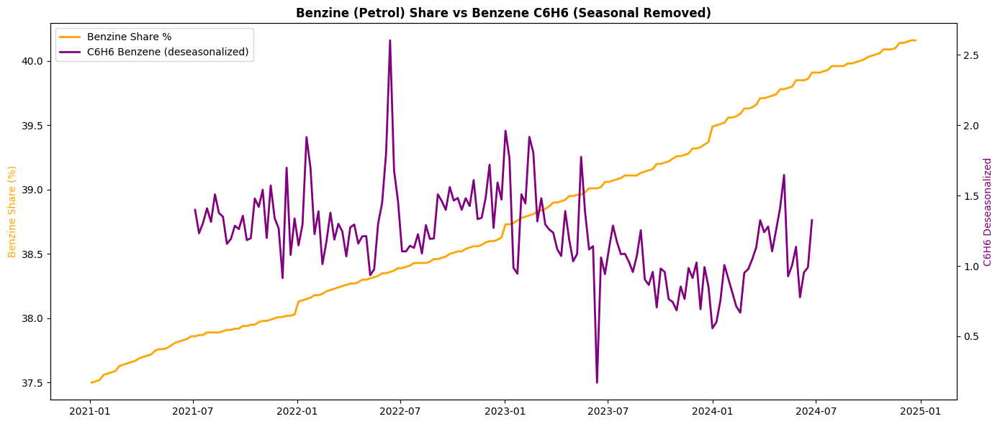

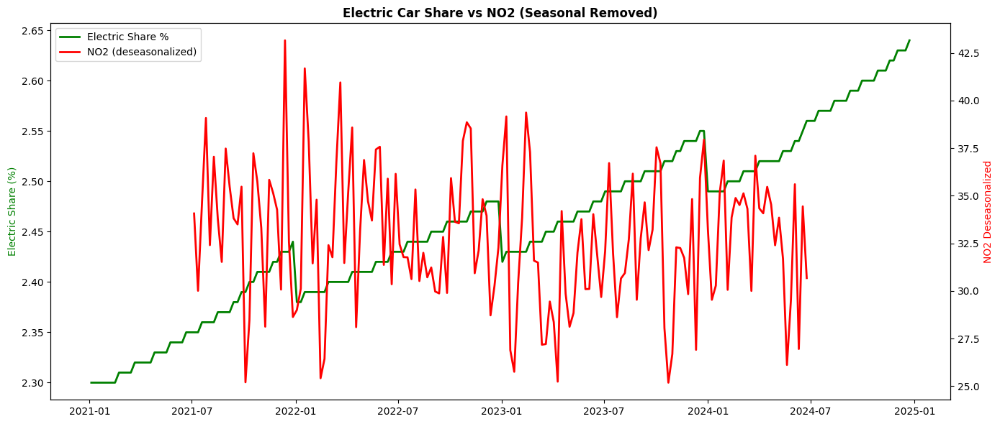

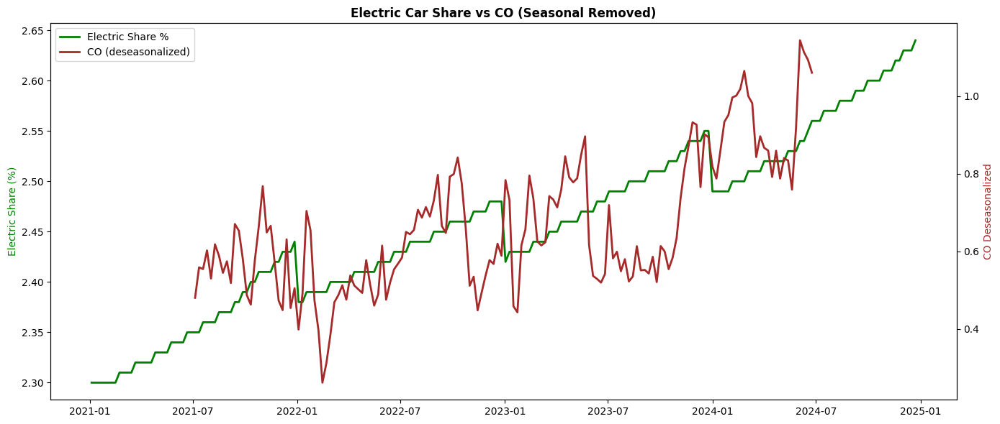


Correlation Summary (deseasonalized pollutants):
                    NO2_deseas  C6H6_deseas  CO_deseas
Diesel_share_pct          0.13         0.45      -0.69
Benzine_share_pct        -0.13        -0.44       0.69
Electric_share_pct       -0.13        -0.43       0.62
Hybrid_share_pct          0.14         0.43      -0.68


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

cars_temp = cars_size.set_index(pd.to_datetime(cars_size["date"])).sort_index()

# ============================================================
# 1. DIESEL vs NO2 (deseasonalized)
# ============================================================
no2_decomp = seasonal_decompose(cars_temp["NO2"].dropna(), model="additive", period=52)
cars_temp["NO2_deseas"] = no2_decomp.trend + no2_decomp.resid

fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()
ax1.plot(cars_temp.index, cars_temp["Diesel_share_pct"], "b-", linewidth=2, label="Diesel Share %")
ax2.plot(cars_temp.index, cars_temp["NO2_deseas"], "r-", linewidth=2, label="NO2 (deseasonalized)")
ax1.set_ylabel("Diesel Share (%)", color="blue")
ax2.set_ylabel("NO2 Deseasonalized", color="red")
ax1.set_title("Diesel Share vs NO2 (Seasonal Removed)", fontweight="bold")
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)
plt.tight_layout()
plt.show()

# ============================================================
# 2. BENZINE vs C6H6 (benzene - directly related to petrol)
# ============================================================
c6h6_decomp = seasonal_decompose(cars_temp["C6H6"].dropna(), model="additive", period=52)
cars_temp["C6H6_deseas"] = c6h6_decomp.trend + c6h6_decomp.resid

fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()
ax1.plot(cars_temp.index, cars_temp["Benzine_share_pct"], "orange", linewidth=2, label="Benzine Share %")
ax2.plot(cars_temp.index, cars_temp["C6H6_deseas"], "purple", linewidth=2, label="C6H6 Benzene (deseasonalized)")
ax1.set_ylabel("Benzine Share (%)", color="orange")
ax2.set_ylabel("C6H6 Deseasonalized", color="purple")
ax1.set_title("Benzine (Petrol) Share vs Benzene C6H6 (Seasonal Removed)", fontweight="bold")
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)
plt.tight_layout()
plt.show()

# ============================================================
# 3. ELECTRIC vs NO2 (more EVs = less pollution?)
# ============================================================
fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()
ax1.plot(cars_temp.index, cars_temp["Electric_share_pct"], "g-", linewidth=2, label="Electric Share %")
ax2.plot(cars_temp.index, cars_temp["NO2_deseas"], "r-", linewidth=2, label="NO2 (deseasonalized)")
ax1.set_ylabel("Electric Share (%)", color="green")
ax2.set_ylabel("NO2 Deseasonalized", color="red")
ax1.set_title("Electric Car Share vs NO2 (Seasonal Removed)", fontweight="bold")
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)
plt.tight_layout()
plt.show()

# ============================================================
# 4. ELECTRIC vs CO (more EVs = less CO from exhaust?)
# ============================================================
co_decomp = seasonal_decompose(cars_temp["CO"].dropna(), model="additive", period=52)
cars_temp["CO_deseas"] = co_decomp.trend + co_decomp.resid

fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()
ax1.plot(cars_temp.index, cars_temp["Electric_share_pct"], "g-", linewidth=2, label="Electric Share %")
ax2.plot(cars_temp.index, cars_temp["CO_deseas"], "brown", linewidth=2, label="CO (deseasonalized)")
ax1.set_ylabel("Electric Share (%)", color="green")
ax2.set_ylabel("CO Deseasonalized", color="brown")
ax1.set_title("Electric Car Share vs CO (Seasonal Removed)", fontweight="bold")
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)
plt.tight_layout()
plt.show()

# ============================================================
# 5. CORRELATION SUMMARY (all deseasonalized)
# ============================================================
corr_data = cars_temp[["Diesel_share_pct", "Benzine_share_pct", "Electric_share_pct",
                        "Hybrid_share_pct", "NO2_deseas", "C6H6_deseas", "CO_deseas"]].corr()

print("\nCorrelation Summary (deseasonalized pollutants):")
print(corr_data[["NO2_deseas", "C6H6_deseas", "CO_deseas"]].iloc[:4].round(3).to_string())

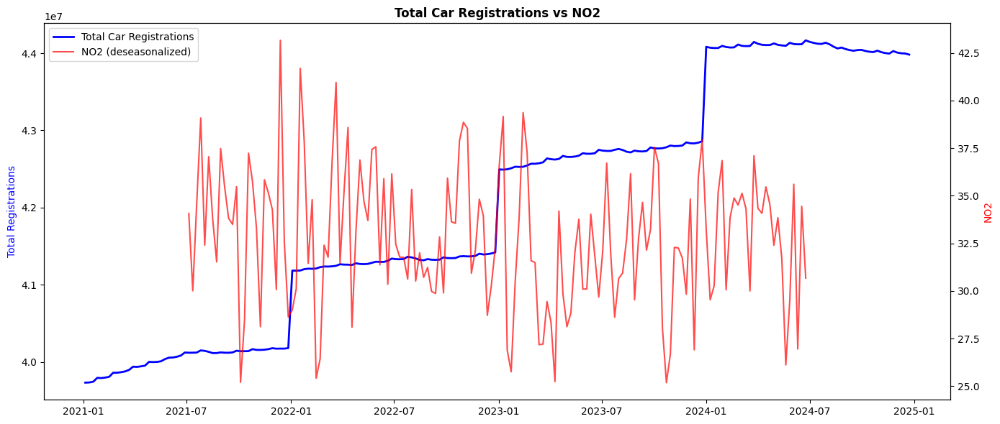

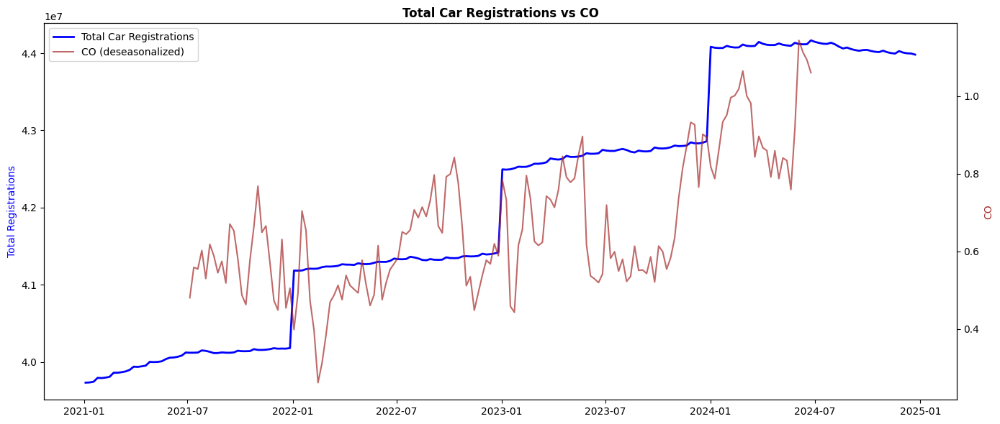

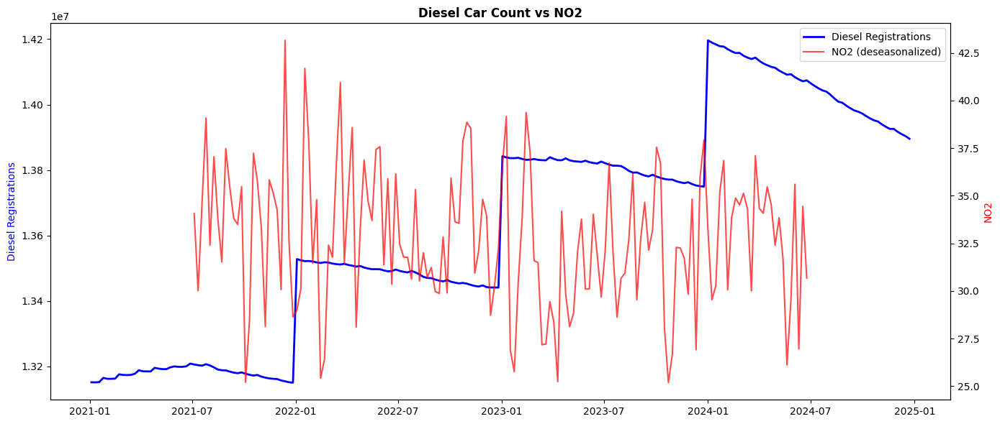

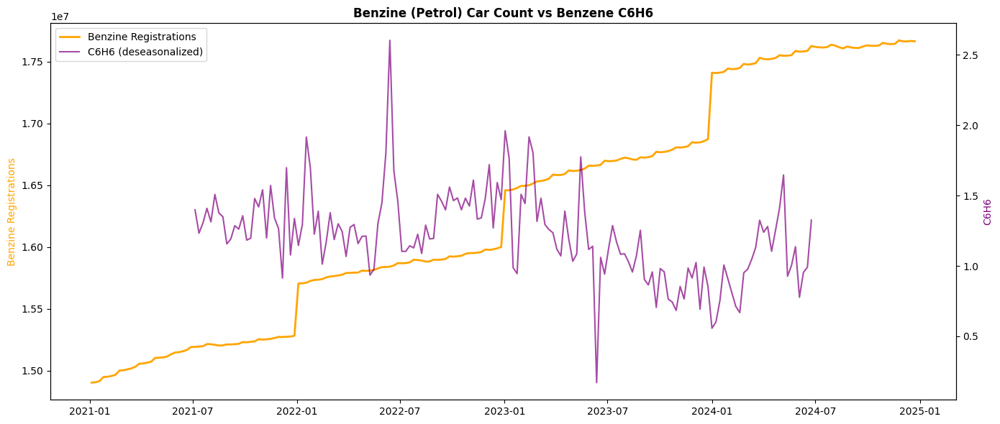


Correlation: Car counts vs deseasonalized pollutants:
                   Total  Diesel  Benzine  Electric  Hybrid
NO2_deseas         -0.13   -0.13    -0.13     -0.14   -0.12
NO_deseas           0.18    0.17     0.18      0.19    0.15
CO_deseas           0.66    0.62     0.68      0.68    0.58
C6H6_deseas        -0.42   -0.39    -0.43     -0.45   -0.36
NOX as NO2_deseas  -0.07   -0.07    -0.07     -0.07   -0.06


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

cars_temp = cars_size.set_index(pd.to_datetime(cars_size["date"])).sort_index()

# Deseasonalize key pollutants if not already done
for poll in ["NO2", "NO", "CO", "C6H6", "NOX as NO2"]:
    decomp = seasonal_decompose(cars_temp[poll].dropna(), model="additive", period=52)
    cars_temp[f"{poll}_deseas"] = decomp.trend + decomp.resid

# ============================================================
# 1. Total registrations vs Total pollution (NO2)
# ============================================================
fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()
ax1.plot(cars_temp.index, cars_temp["Total"], "b-", linewidth=2, label="Total Car Registrations")
ax2.plot(cars_temp.index, cars_temp["NO2_deseas"], "r-", linewidth=1.5, label="NO2 (deseasonalized)", alpha=0.7)
ax1.set_ylabel("Total Registrations", color="blue")
ax2.set_ylabel("NO2", color="red")
ax1.set_title("Total Car Registrations vs NO2", fontweight="bold")
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)
plt.tight_layout()
plt.show()

# ============================================================
# 2. Total registrations vs CO
# ============================================================
fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()
ax1.plot(cars_temp.index, cars_temp["Total"], "b-", linewidth=2, label="Total Car Registrations")
ax2.plot(cars_temp.index, cars_temp["CO_deseas"], "brown", linewidth=1.5, label="CO (deseasonalized)", alpha=0.7)
ax1.set_ylabel("Total Registrations", color="blue")
ax2.set_ylabel("CO", color="brown")
ax1.set_title("Total Car Registrations vs CO", fontweight="bold")
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)
plt.tight_layout()
plt.show()

# ============================================================
# 3. Diesel count vs NO2
# ============================================================
fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()
ax1.plot(cars_temp.index, cars_temp["Diesel"], "b-", linewidth=2, label="Diesel Registrations")
ax2.plot(cars_temp.index, cars_temp["NO2_deseas"], "r-", linewidth=1.5, label="NO2 (deseasonalized)", alpha=0.7)
ax1.set_ylabel("Diesel Registrations", color="blue")
ax2.set_ylabel("NO2", color="red")
ax1.set_title("Diesel Car Count vs NO2", fontweight="bold")
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)
plt.tight_layout()
plt.show()

# ============================================================
# 4. Benzine count vs C6H6
# ============================================================
fig, ax1 = plt.subplots(figsize=(14, 6))
ax2 = ax1.twinx()
ax1.plot(cars_temp.index, cars_temp["Benzine"], "orange", linewidth=2, label="Benzine Registrations")
ax2.plot(cars_temp.index, cars_temp["C6H6_deseas"], "purple", linewidth=1.5, label="C6H6 (deseasonalized)", alpha=0.7)
ax1.set_ylabel("Benzine Registrations", color="orange")
ax2.set_ylabel("C6H6", color="purple")
ax1.set_title("Benzine (Petrol) Car Count vs Benzene C6H6", fontweight="bold")
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)
plt.tight_layout()
plt.show()

# ============================================================
# 5. Correlation summary
# ============================================================
corr_cols = ["Total", "Diesel", "Benzine", "Electric", "Hybrid",
             "NO2_deseas", "NO_deseas", "CO_deseas", "C6H6_deseas", "NOX as NO2_deseas"]
corr = cars_temp[corr_cols].corr()

print("\nCorrelation: Car counts vs deseasonalized pollutants:")
print(corr.loc[["NO2_deseas", "NO_deseas", "CO_deseas", "C6H6_deseas", "NOX as NO2_deseas"],
               ["Total", "Diesel", "Benzine", "Electric", "Hybrid"]].round(3).to_string())

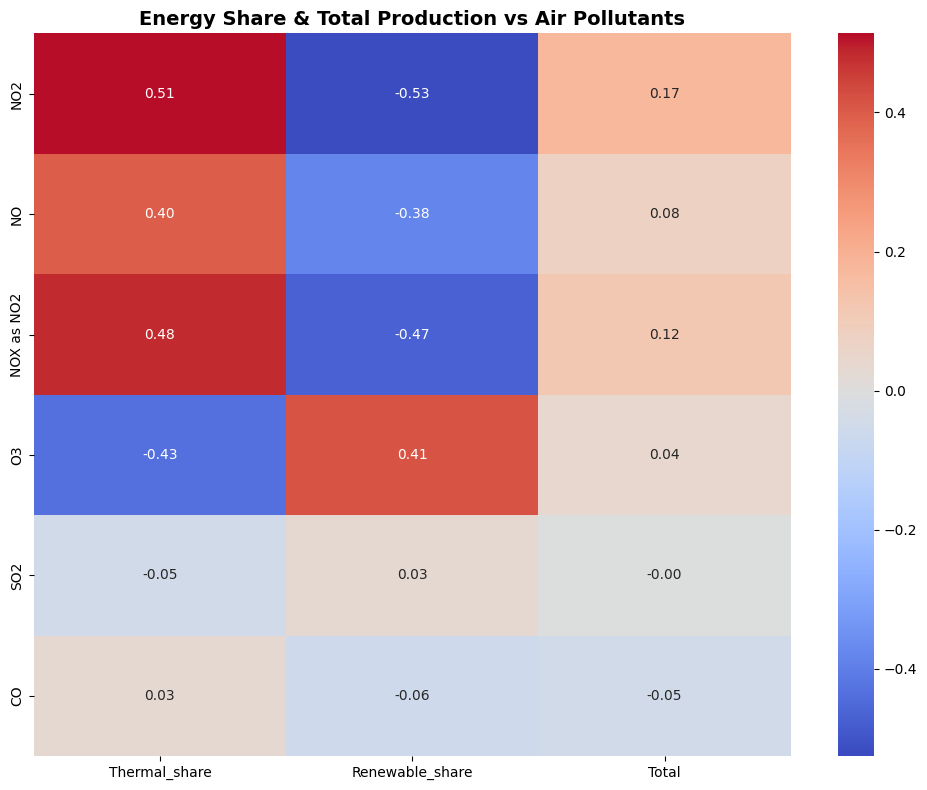

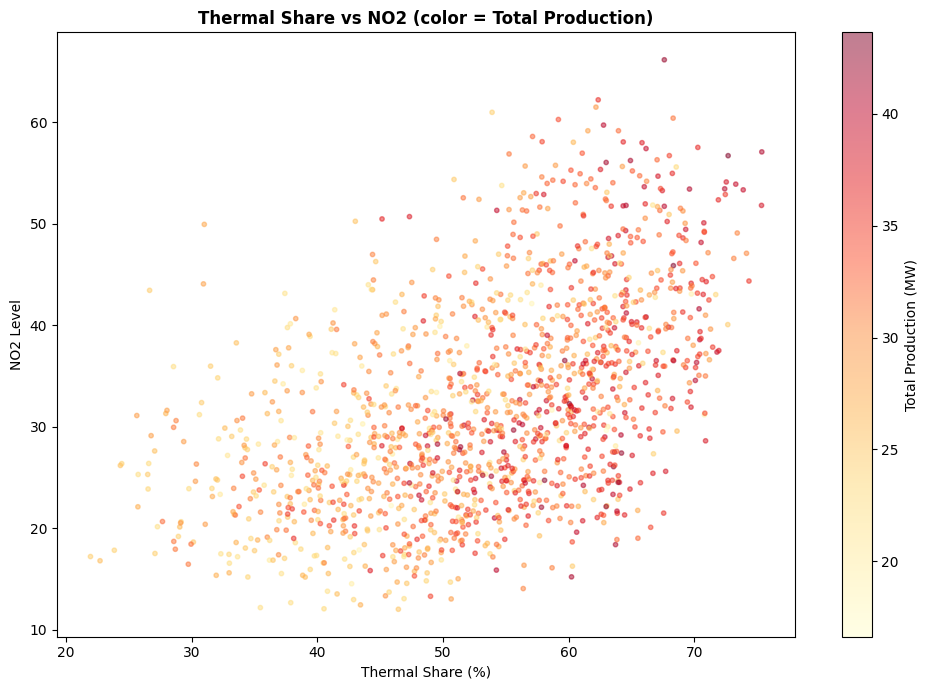

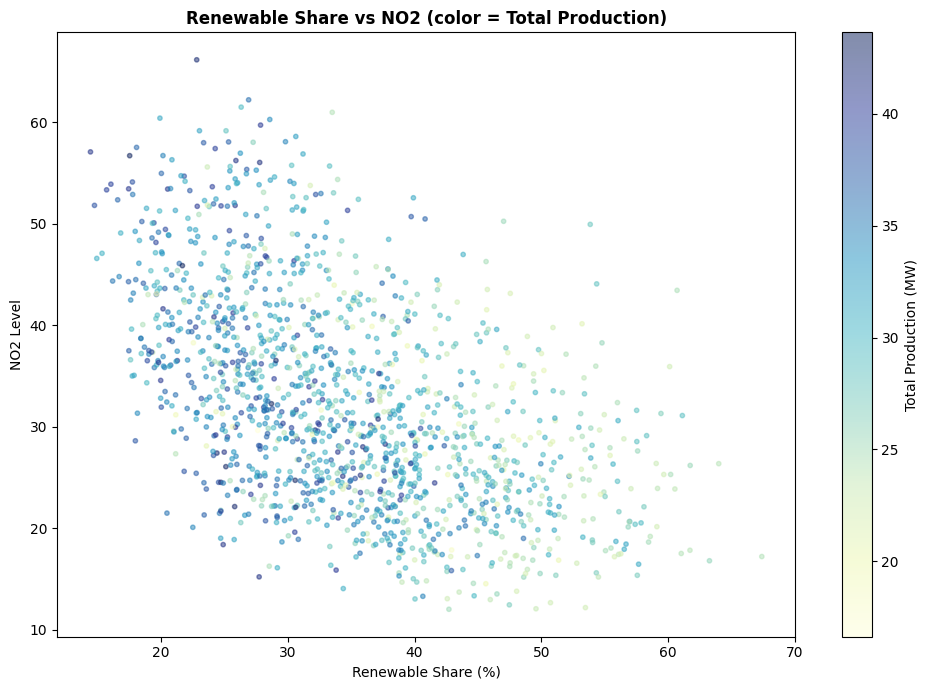


Pollution on High vs Low Thermal Share Days:
            High Thermal Days  Low Thermal Days  Difference %
NO2                     37.05             27.41         35.20
NO                      25.53             13.95         83.10
NOX as NO2              73.55             44.46         65.40
O3                      36.80             50.99        -27.80
SO2                      3.08              3.23         -4.60
CO                       0.69              0.66          3.90


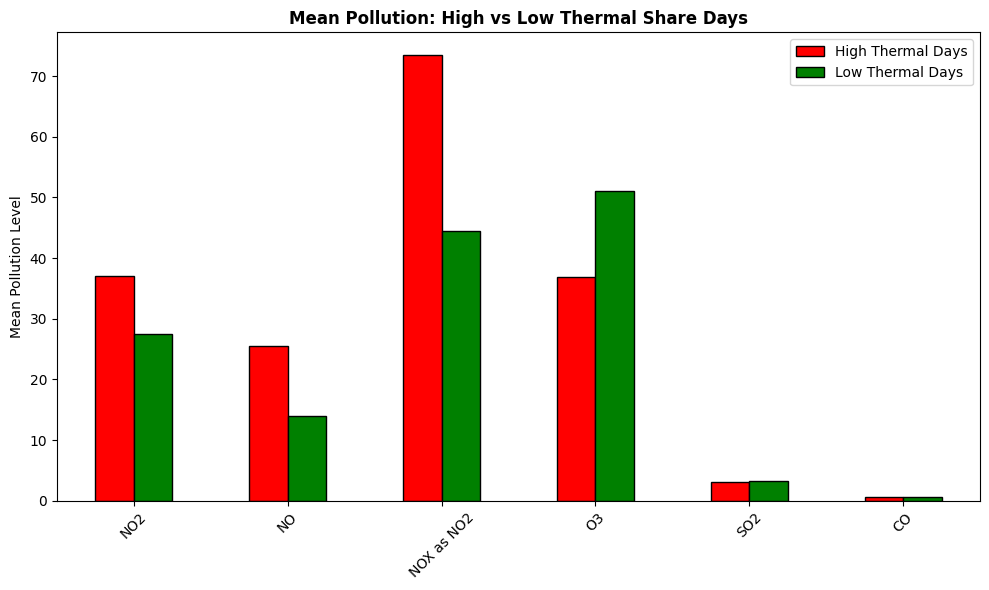

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Merge daily pollution with energy data
daily_pollution["Date"] = pd.to_datetime(daily_pollution["Date"])
energy_plt["Day"] = pd.to_datetime(energy_plt["Day"])

daily_combined = pd.merge(
    daily_pollution,
    energy_plt,
    left_on="Date",
    right_on="Day",
    how="inner"
).drop(columns=["Day"])

# Calculate shares
daily_combined["Thermal_share"] = daily_combined["Thermal"] / daily_combined["Total"] * 100
daily_combined["Renewable_share"] = (
    daily_combined["Hydro"] + daily_combined["Photovoltaic"] +
    daily_combined["Wind"] + daily_combined["Geothermal"]
) / daily_combined["Total"] * 100
daily_combined["Selfcons_share"] = daily_combined["Self-consumption"] / daily_combined["Total"] * 100

# ============================================================
# 1. CORRELATION: Shares + Total production vs Pollutants
# ============================================================
energy_cols = ["Thermal_share", "Renewable_share", "Total"]
pollutant_cols = ["NO2", "NO", "NOX as NO2", "O3", "SO2", "CO"]

fig, ax = plt.subplots(figsize=(10, 8))
corr = daily_combined[energy_cols + pollutant_cols].corr()
sns.heatmap(corr.loc[pollutant_cols, energy_cols], annot=True, cmap="coolwarm",
            center=0, fmt=".2f", ax=ax)
ax.set_title("Energy Share & Total Production vs Air Pollutants", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# ============================================================
# 2. SCATTER: Thermal share vs NO2, colored by Total production
# ============================================================
fig, ax = plt.subplots(figsize=(10, 7))
scatter = ax.scatter(daily_combined["Thermal_share"], daily_combined["NO2"],
                     c=daily_combined["Total"], cmap="YlOrRd", alpha=0.5, s=10)
plt.colorbar(scatter, label="Total Production (MW)")
ax.set_xlabel("Thermal Share (%)")
ax.set_ylabel("NO2 Level")
ax.set_title("Thermal Share vs NO2 (color = Total Production)", fontweight="bold")
plt.tight_layout()
plt.show()

# ============================================================
# 3. SCATTER: Renewable share vs NO2, colored by Total production
# ============================================================
fig, ax = plt.subplots(figsize=(10, 7))
scatter = ax.scatter(daily_combined["Renewable_share"], daily_combined["NO2"],
                     c=daily_combined["Total"], cmap="YlGnBu", alpha=0.5, s=10)
plt.colorbar(scatter, label="Total Production (MW)")
ax.set_xlabel("Renewable Share (%)")
ax.set_ylabel("NO2 Level")
ax.set_title("Renewable Share vs NO2 (color = Total Production)", fontweight="bold")
plt.tight_layout()
plt.show()

# ============================================================
# 4. HIGH vs LOW thermal days comparison
# ============================================================
median_thermal = daily_combined["Thermal_share"].median()
high_thermal = daily_combined[daily_combined["Thermal_share"] > median_thermal]
low_thermal = daily_combined[daily_combined["Thermal_share"] <= median_thermal]

comparison = pd.DataFrame({
    "High Thermal Days": high_thermal[pollutant_cols].mean(),
    "Low Thermal Days": low_thermal[pollutant_cols].mean(),
})
comparison["Difference %"] = ((comparison["High Thermal Days"] - comparison["Low Thermal Days"]) / comparison["Low Thermal Days"] * 100).round(1)

print("\nPollution on High vs Low Thermal Share Days:")
print(comparison.round(2).to_string())

# Plot comparison
fig, ax = plt.subplots(figsize=(10, 6))
comparison[["High Thermal Days", "Low Thermal Days"]].plot(kind="bar", ax=ax,
    color=["red", "green"], edgecolor="black")
ax.set_title("Mean Pollution: High vs Low Thermal Share Days", fontweight="bold")
ax.set_ylabel("Mean Pollution Level")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

---
## 13. Conclusions & Next Steps

**Key findings:**
- Thermal energy production shows a moderate positive correlation with benzene (C6H6) levels
- Wind direction plays a significant role — pollution is elevated when wind blows from factory-dense areas (E/SE of Rome)
- Vehicle fleet is gradually shifting toward hybrid/electric, though the impact on air quality is not yet clearly separable from other factors
- Seasonal patterns dominate most pollutants, with winter peaks (heating + low dispersion) and summer peaks for ozone

**Limitations:** Causal inference is limited — correlations do not establish causation. Wind matching relies on nearest-station proximity rather than atmospheric modelling. Some pollutants have sparse coverage across stations.

*[Edit these conclusions based on your final results.]*